# Introduction


## Overall aim and context
Our data concern cancer cells, which are one of the main causes of death worldwide. In general, cells grow next to a blood vessel which can provide them with enough oxygen to perform their vital activities; however, cancer cells have the ability to reproduce at a very fast pace, creating a "crowded" environment next to the blood vessel, which force these cells to grow in hypoxia (absence of oxygen). In this extreme condition some cells die, others develop some mechanism which allow them to survive and grow resistent to treatments. Therefore, in this project, we are trying to answer an important question: is there a way we can predict the state of a particular cell (hypoxia or normoxia) and understand, as a consequence, whether it might be a dangerous cell or not, just by looking at these different mechanisms they put in place? And where should we look in order to understand these differences?


## A brief introduction on gene expression and RNA sequencing
DNA contains every possible information about the human body, the structure and every specific function, and it encodes the necessary information to perform any activity, so the answer must lie within this complicated structure!
A gene is a chunck of DNA and gene expression is the process by which the information encoded in a gene is turned into a function. This mostly occurs via the transcription of RNA molecules that code for proteins or non-coding RNA molecules that serve other functions.
With current technologies, we have the ability to measure mRNA expression of every gene in the entire genome; this can be done through RNA sequencing which, in brief, works as follows: before the actual procedure the RNA/mRNA is isolated, fragmented and then converted into cDNA. Sequencing is then done through a specific machine which produces a vendor tool format file, a non-text file, which is then read and translated into FASTQ files, and finally, through alignment or assembly, it is converted into SAM/BAM files which are uncompressed and compressed text files respectively.

## Materials and Methods
In our experiment we are analysing two different types of breast cancer cells: MCF7 and HCC1806. Those cells are extracted and grown in cultures in a laboratory, where they are put in two different experimental conditions which are a state of hypoxia or normoxia. These cells are then sequenced through two different sequencing techniques (Smart-Seq and Drop-Seq) and the level of expression of the various genes is then recorded in the dataset. Therefore, our original goal can be translated perfectly in this experimental setting: the final aim of our work is, indeed, to predict the state in which a cell was originally put, through the level of expression of some particular genes.
In order to do so, the general structure of this report will be the following: EDA which will allow us to have a cleaner dataset, followed by unsupervised learning to discover the presence of different classes, or whether there are similarities in cases or features, and finally, supervised learning in order to build a classifier for our ultimate prediction goal.





# Python libraries, file locations

In [ ]:
import sys
import sklearn
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import seaborn as sns
import random
%matplotlib inline     
sns.set(color_codes=True)

In [ ]:
# import and name datasets

# unfiltered data
hcc_smart_unfiltered = "HCC1806_SmartS_Unfiltered_Data.txt"

# meta data
hcc_smart_meta = "HCC1806_SmartS_MetaData.tsv"

# filtered data
hcc_smart_filtered =  "HCC1806_SmartS_Filtered_Data.txt"

# training data
hcc_smart_train = "HCC1806_SmartS_Filtered_Normalised_3000_Data_train.txt"

# test data
hcc_smart_test = "HCC1806_SmartS_Filtered_Normalised_3000_Data_test_anonim.txt"

In [ ]:
df_hcc_smart_unfiltered = pd.read_csv(hcc_smart_unfiltered,delimiter=' ',engine='python',index_col=0)
df_hcc_smart_meta = pd.read_csv(hcc_smart_meta,delimiter='\t',engine='python',index_col=0)
df_hcc_smart_filtered = pd.read_csv(hcc_smart_filtered,delimiter=' ',engine='python',index_col=0)
df_hcc_smart_train = pd.read_csv(hcc_smart_train,delimiter=' ',engine='python',index_col=0)

df_hcc_smart_test = pd.read_csv(hcc_smart_test,delimiter=' ',engine='python',index_col=0)

df_hcc_smart_unfiltered.columns = df_hcc_smart_unfiltered.columns.str.replace(r'"', '')
df_hcc_smart_filtered.columns = df_hcc_smart_filtered.columns.str.replace(r'"', '')
df_hcc_smart_train.columns = df_hcc_smart_train.columns.str.replace(r'"', '')

# Explanatory data analysis

## Description and visualization of the data

We start by looking at the metadata, which give us informations about the sample cells.

In [ ]:
print("Dataframe dimensions:", np.shape(df_hcc_smart_meta))


Dataframe dimensions: (243, 8)


In [ ]:
df_hcc_smart_meta.dtypes

Cell Line             object
PCR Plate              int64
Pos                   object
Condition             object
Hours                  int64
Cell name             object
PreprocessingTag      object
ProcessingComments    object
dtype: object

In [ ]:
df_hcc_smart_meta.head()

,Cell Line,PCR Plate,Pos,Condition,Hours,Cell name,PreprocessingTag,ProcessingComments
Filename,,,,,,,,
output.STAR.PCRPlate1A10_Normoxia_S123_Aligned.sortedByCoord.out.bam,HCC1806,1,A10,Normo,24,S123,Aligned.sortedByCoord.out.bam,"STAR,FeatureCounts"
output.STAR.PCRPlate1A12_Normoxia_S26_Aligned.sortedByCoord.out.bam,HCC1806,1,A12,Normo,24,S26,Aligned.sortedByCoord.out.bam,"STAR,FeatureCounts"
output.STAR.PCRPlate1A1_Hypoxia_S97_Aligned.sortedByCoord.out.bam,HCC1806,1,A1,Hypo,24,S97,Aligned.sortedByCoord.out.bam,"STAR,FeatureCounts"
output.STAR.PCRPlate1A2_Hypoxia_S104_Aligned.sortedByCoord.out.bam,HCC1806,1,A2,Hypo,24,S104,Aligned.sortedByCoord.out.bam,"STAR,FeatureCounts"
output.STAR.PCRPlate1A3_Hypoxia_S4_Aligned.sortedByCoord.out.bam,HCC1806,1,A3,Hypo,24,S4,Aligned.sortedByCoord.out.bam,"STAR,FeatureCounts"


By looking at the first rows of the dataset and knowing its dimension, we can see that there are 243 sample cells and 8 features. Next we look at the possible values that the features can take to better describe their meaning.

In [ ]:
df_hcc_smart_meta.isnull().sum()

Cell Line             0
PCR Plate             0
Pos                   0
Condition             0
Hours                 0
Cell name             0
PreprocessingTag      0
ProcessingComments    0
dtype: int64

In [ ]:
for i,x in enumerate(df_hcc_smart_meta.columns):
  print(f'Values of {x}:')
  print(df_hcc_smart_meta.iloc[:,i].value_counts().to_string(), '\n')

Values of Cell Line:
HCC1806    243 

Values of PCR Plate:
3    68
1    64
2    63
4    48 

Values of Pos:
A10    4
H2     4
F12    4
F4     4
G10    4
G12    4
C6     4
G2     4
C12    4
C11    4
C10    4
G7     4
E12    4
B3     4
B6     4
B1     4
B11    4
A9     4
A3     4
G1     3
E5     3
E8     3
H10    3
F2     3
F9     3
F1     3
E3     3
F10    3
H1     3
G4     3
C3     3
B8     3
G6     3
H6     3
G9     3
E1     3
F7     3
D9     3
C8     3
A1     3
A6     3
D5     3
B2     3
B4     3
C1     3
C5     3
C7     3
A8     3
D1     3
D12    3
C9     2
A2     2
E7     2
E4     2
E9     2
A5     2
A4     2
F3     2
G11    2
F6     2
E6     2
H11    2
H3     2
C2     2
E2     2
H7     2
E11    2
E10    2
B9     2
F8     2
A12    2
G3     2
F5     2
D2     2
B7     2
G8     2
B5     2
H5     2
B12    2
H9     2
D3     2
A7     2
D10    2
H4     1
G5     1
D6     1
D4     1
D11    1
A11    1
C4     1
B10    1 

Values of Condition:
Hypo     126
Normo    117 

Values of Hours:
24   

As expected all cells in the dataset belong to the `Cell line` HCC1806. The data of `PCR plate` and `Pos` tell us the precise location of the cells in the plates. There are four of them and each can allocate at most 96 cells, with coordinates that go from 1 to 12 in one direction and from A to H in the other. The most relevant information is the one of the `Condition`, which can be either Normoxia or Hypoxia and we can see that the data are quite evenly distributed between the two categories with 117 'Normo' and 126 'Hypo'. Next we have the `Hours` category which tells us how long the experiment has been carried out for, but this is an irrelevant data since there is only one common value. Then we have the `Cell name` column, which contains all different data, telling us that each cell is uniquely represented. Finally we have two columns explaining the preprocessing and processing of the data (`PreprocessingTag` and `ProcessingComments`), which are irrelevant in our study since they are equal for all cells.

Now we move on to the actual unfiltered data.

In [ ]:
print("Dataframe dimensions:", np.shape(df_hcc_smart_unfiltered))


Dataframe dimensions: (23396, 243)


First of all, we check for missing values in the unfiltered dataset and again observe that there aren't any.

In [ ]:
df_hcc_smart_unfiltered.isnull().any().sum()

0

In [ ]:
df_hcc_smart_unfiltered.head()

,output.STAR.PCRPlate1A10_Normoxia_S123_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1A12_Normoxia_S26_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1A1_Hypoxia_S97_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1A2_Hypoxia_S104_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1A3_Hypoxia_S4_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1A4_Hypoxia_S8_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1A5_Hypoxia_S108_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1A6_Hypoxia_S11_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1A7_Normoxia_S113_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1A8_Normoxia_S119_Aligned.sortedByCoord.out.bam,...,output.STAR.PCRPlate4G12_Normoxia_S243_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4G1_Hypoxia_S193_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4G2_Hypoxia_S198_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4G6_Hypoxia_S232_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4G7_Normoxia_S204_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4H10_Normoxia_S210_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4H11_Normoxia_S214_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4H2_Hypoxia_S199_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4H7_Normoxia_S205_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4H9_Normoxia_S236_Aligned.sortedByCoord.out.bam
WASH7P,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
CICP27,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
DDX11L17,0,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
WASH9P,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,1,0,1,0,0
OR4F29,2,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
print("Dataframe indices: ", df_hcc_smart_unfiltered.index)

Dataframe indices:  Index(['WASH7P', 'CICP27', 'DDX11L17', 'WASH9P', 'OR4F29', 'MTND1P23',
       'MTND2P28', 'MTCO1P12', 'MTCO2P12', 'MTATP8P1',
       ...
       'MT-TH', 'MT-TS2', 'MT-TL2', 'MT-ND5', 'MT-ND6', 'MT-TE', 'MT-CYB',
       'MT-TT', 'MT-TP', 'MAFIP'],
      dtype='object', length=23396)


In [ ]:
gene_types = pd.Series(index=df_hcc_smart_unfiltered.index, dtype='object')
for x in df_hcc_smart_unfiltered.index:
    index = next((i for i, c in enumerate(x) if (c.isdigit() or c=='-')), len(x))
    gene_types[x]=x[0:index]
gene_types.value_counts()

LINC     723
ZNF      564
MIR      518
RPL      499
SLC      363
        ... 
TXLNG      1
CTH        1
SMS        1
PHEX       1
MAFIP      1
Length: 6109, dtype: int64

By looking at the unfiltered data we see that the columns are represented by the 243 cells, which are the same ones we saw in the metadata. On the other hand, the rows are indexed by symbols that identify the genes and there are 23396 of them.
Each gene corresponds to a sequence of bases in the DNA  and identifiers are used to name sequences that may have a specific function when activated or not. Each symbol is associated to only one gene and their aim is to briefly describe its charcteristics and/or functions. An example is the prefix 'LINC' (long intergenic non-protein coding) that is the most common in our dataset.

In the following line of code we check that all the entries are numeric.

In [ ]:
df_hcc_smart_unfiltered.dtypes.value_counts()

int64    243
dtype: int64

In [ ]:
df_hcc_smart_unfiltered.describe()

,output.STAR.PCRPlate1A10_Normoxia_S123_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1A12_Normoxia_S26_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1A1_Hypoxia_S97_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1A2_Hypoxia_S104_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1A3_Hypoxia_S4_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1A4_Hypoxia_S8_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1A5_Hypoxia_S108_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1A6_Hypoxia_S11_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1A7_Normoxia_S113_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1A8_Normoxia_S119_Aligned.sortedByCoord.out.bam,...,output.STAR.PCRPlate4G12_Normoxia_S243_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4G1_Hypoxia_S193_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4G2_Hypoxia_S198_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4G6_Hypoxia_S232_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4G7_Normoxia_S204_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4H10_Normoxia_S210_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4H11_Normoxia_S214_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4H2_Hypoxia_S199_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4H7_Normoxia_S205_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4H9_Normoxia_S236_Aligned.sortedByCoord.out.bam
count,23396.000000,23396.000000,23396.000000,23396.000000,23396.000000,23396.000000,23396.000000,23396.000000,23396.000000,23396.000000,...,23396.000000,23396.000000,23396.000000,23396.000000,23396.000000,23396.000000,23396.000000,23396.000000,23396.000000,23396.000000
mean,99.565695,207.678278,9.694734,150.689007,35.700504,47.088434,152.799453,135.869422,38.363908,45.512139,...,76.361771,105.566593,54.026116,29.763806,28.905411,104.740725,35.181569,108.197940,37.279962,76.303855
std,529.532443,981.107905,65.546050,976.936548,205.885369,545.367706,864.974182,870.729740,265.062493,366.704721,...,346.659348,536.881574,344.068304,186.721266,135.474736,444.773045,170.872090,589.082268,181.398951,369.090274
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,1.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,0.000000,0.000000,1.000000
75%,51.000000,125.000000,5.000000,40.000000,22.000000,17.000000,81.000000,76.000000,22.000000,18.000000,...,56.000000,67.000000,29.000000,18.000000,19.000000,76.000000,24.000000,68.000000,22.000000,44.000000
max,35477.000000,69068.000000,6351.000000,70206.000000,17326.000000,47442.000000,43081.000000,62813.000000,30240.000000,35450.000000,...,19629.000000,30987.000000,21894.000000,13457.000000,11488.000000,33462.000000,15403.000000,34478.000000,10921.000000,28532.000000


The describe() method used above returns the description of the data in the DataFrame. Here we can observe that the data is sparse; in fact, the features have mostly zero values and have some big entries, an issue that we will address later on.

In [ ]:
df_hcc_smart_unfiltered.T.describe()

,WASH7P,CICP27,DDX11L17,WASH9P,OR4F29,MTND1P23,MTND2P28,MTCO1P12,MTCO2P12,MTATP8P1,...,MT-TH,MT-TS2,MT-TL2,MT-ND5,MT-ND6,MT-TE,MT-CYB,MT-TT,MT-TP,MAFIP
count,243.000000,243.000000,243.000000,243.000000,243.000000,243.000000,243.000000,243.000000,243.000000,243.000000,...,243.000000,243.000000,243.000000,243.000000,243.000000,243.000000,243.000000,243.000000,243.000000,243.000000
mean,0.045267,0.119342,0.469136,0.255144,0.127572,117.930041,28.427984,904.308642,1.403292,0.378601,...,10.358025,5.930041,13.493827,2290.213992,386.901235,18.246914,2163.588477,20.613169,46.444444,3.897119
std,0.318195,0.594531,1.455282,0.818639,0.440910,103.038022,26.062662,654.520308,1.735003,0.747361,...,10.910199,7.040559,11.803967,1726.423259,309.276105,54.076514,1730.393947,22.224590,47.684223,4.736193
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,46.500000,8.000000,390.500000,0.000000,0.000000,...,2.000000,1.000000,4.000000,918.000000,138.500000,4.000000,947.500000,5.000000,14.000000,0.000000
50%,0.000000,0.000000,0.000000,0.000000,0.000000,94.000000,22.000000,790.000000,1.000000,0.000000,...,7.000000,4.000000,10.000000,1848.000000,320.000000,11.000000,1774.000000,14.000000,38.000000,2.000000
75%,0.000000,0.000000,0.000000,0.000000,0.000000,157.000000,42.000000,1208.000000,2.000000,1.000000,...,14.000000,7.500000,20.000000,3172.000000,528.000000,20.000000,2927.000000,30.500000,64.500000,6.000000
max,3.000000,5.000000,12.000000,6.000000,4.000000,694.000000,120.000000,3569.000000,12.000000,4.000000,...,52.000000,43.000000,57.000000,8972.000000,1439.000000,804.000000,11383.000000,154.000000,409.000000,24.000000


Also the gene readings across cells are highly sparse. In some cases, the amount of zero values overcome the third quartile.

Next we plot the cells in their respective positions in the plates and use two different colors to distinguish hypoxic cells from the normal ones.

In [ ]:
def meta_column(info):
    return df_hcc_smart_meta.loc[:,info]

In [ ]:
plate_1 = df_hcc_smart_unfiltered.loc[:,meta_column('PCR Plate')==1]
plate_2 = df_hcc_smart_unfiltered.loc[:,meta_column('PCR Plate')==2]
plate_3 = df_hcc_smart_unfiltered.loc[:,meta_column('PCR Plate')==3]
plate_4 = df_hcc_smart_unfiltered.loc[:,meta_column('PCR Plate')==4]

plate_1_meta = df_hcc_smart_meta.loc[meta_column('PCR Plate')==1,:]
plate_2_meta = df_hcc_smart_meta.loc[meta_column('PCR Plate')==2,:]
plate_3_meta = df_hcc_smart_meta.loc[meta_column('PCR Plate')==3,:]
plate_4_meta = df_hcc_smart_meta.loc[meta_column('PCR Plate')==4,:]

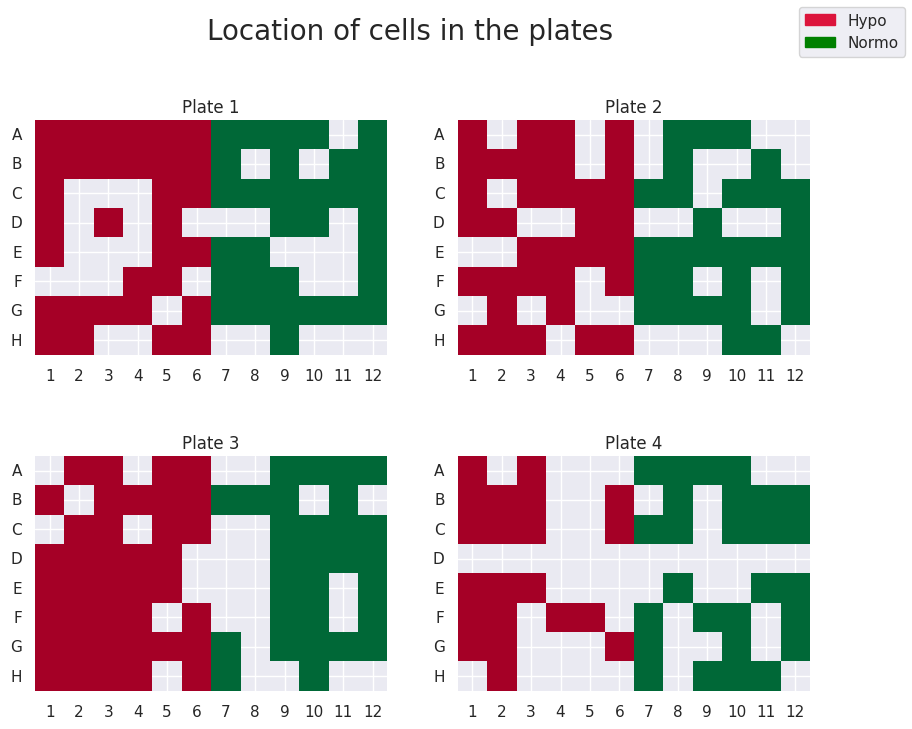

In [ ]:
#Maps
plate_1_pos = plate_1_meta[['Pos','Pos']].copy()
plate_1_pos.columns = ['Letter','Number']
for i,p in plate_1_pos.iterrows():
    p[0]=p[0][0]
    p[1]=int(p[1][1:])

plate_2_pos = plate_2_meta[['Pos','Pos']].copy()
plate_2_pos.columns = ['Letter','Number']
for i,p in plate_2_pos.iterrows():
    p[0]=p[0][0]
    p[1]=int(p[1][1:])

plate_3_pos = plate_3_meta[['Pos','Pos']].copy()
plate_3_pos.columns = ['Letter','Number']
for i,p in plate_3_pos.iterrows():
    p[0]=p[0][0]
    p[1]=int(p[1][1:])

plate_4_pos = plate_4_meta[['Pos','Pos']].copy()
plate_4_pos.columns = ['Letter','Number']
for i,p in plate_4_pos.iterrows():
    p[0]=p[0][0]
    p[1]=int(p[1][1:])


plate_1_values = pd.DataFrame(np.zeros((8,12)), index=list('ABCDEFGH'), columns=list(i+1 for i in range(12)))
for i in plate_1_pos.index:
    plate_1_values.loc[plate_1_pos.loc[i][0]][plate_1_pos.loc[i][1]] = (-1 if plate_1_meta.loc[i,'Condition']=='Hypo' else 1)
plate_2_values = pd.DataFrame(np.zeros((8,12)), index=list('ABCDEFGH'), columns=list(i+1 for i in range(12)))
for i in plate_2_pos.index:
    plate_2_values.loc[plate_2_pos.loc[i][0]][plate_2_pos.loc[i][1]] = (-1 if plate_2_meta.loc[i,'Condition']=='Hypo' else 1)
plate_3_values = pd.DataFrame(np.zeros((8,12)), index=list('ABCDEFGH'), columns=list(i+1 for i in range(12)))
for i in plate_3_pos.index:
    plate_3_values.loc[plate_3_pos.loc[i][0]][plate_3_pos.loc[i][1]] = (-1 if plate_3_meta.loc[i,'Condition']=='Hypo' else 1)
plate_4_values = pd.DataFrame(np.zeros((8,12)), index=list('ABCDEFGH'), columns=list(i+1 for i in range(12)))
for i in plate_4_pos.index:
    plate_4_values.loc[plate_4_pos.loc[i][0]][plate_4_pos.loc[i][1]] = (-1 if plate_4_meta.loc[i,'Condition']=='Hypo' else 1)

fig , ax = plt.subplots(2,2, figsize=(10,8))

h = sns.heatmap(plate_1_values, xticklabels=plate_1_values.columns, yticklabels=plate_1_values.index, cmap='RdYlGn', center=0, mask=(plate_1_values==0), ax=ax[0,0], square=True, cbar=False)
h.set_xticklabels(h.get_xticklabels(), rotation = 0)
h.set_yticklabels(h.get_yticklabels(), rotation = 0)
h = sns.heatmap(plate_2_values, xticklabels=plate_2_values.columns, yticklabels=plate_2_values.index, cmap='RdYlGn', center=0, mask=(plate_2_values==0), ax=ax[0,1], square=True, cbar=False)
h.set_xticklabels(h.get_xticklabels(), rotation = 0)
h.set_yticklabels(h.get_yticklabels(), rotation = 0)
h = sns.heatmap(plate_3_values, xticklabels=plate_3_values.columns, yticklabels=plate_3_values.index, cmap='RdYlGn', center=0, mask=(plate_3_values==0), ax=ax[1,0], square=True, cbar=False)
h.set_xticklabels(h.get_xticklabels(), rotation = 0)
h.set_yticklabels(h.get_yticklabels(), rotation = 0)
h = sns.heatmap(plate_4_values, xticklabels=plate_4_values.columns, yticklabels=plate_4_values.index, cmap='RdYlGn', center=0, mask=(plate_4_values==0), ax=ax[1,1], square=True, cbar=False)
h.set_xticklabels(h.get_xticklabels(), rotation = 0)
h.set_yticklabels(h.get_yticklabels(), rotation = 0)

ax[0,0].set_title('Plate 1')
ax[0,1].set_title('Plate 2')
ax[1,0].set_title('Plate 3')
ax[1,1].set_title('Plate 4')

fig.suptitle("Location of cells in the plates", fontsize=20)
red_patch = mpatches.Patch(color='crimson', label='Hypo')
green_patch = mpatches.Patch(color='green', label='Normo')
fig.legend(handles=[red_patch, green_patch], loc=1)
plt.show()


We can see that all the hypoxic cells are on the left half of the plates. Surely, this was done on purpose when sequencing the cells so we can exclude the proximity to cells of the same type as a relevant information.

Next we plot again the heatmap, giving to each cell its gene activation value, i.e. the number of genes that have an expression different from 0.

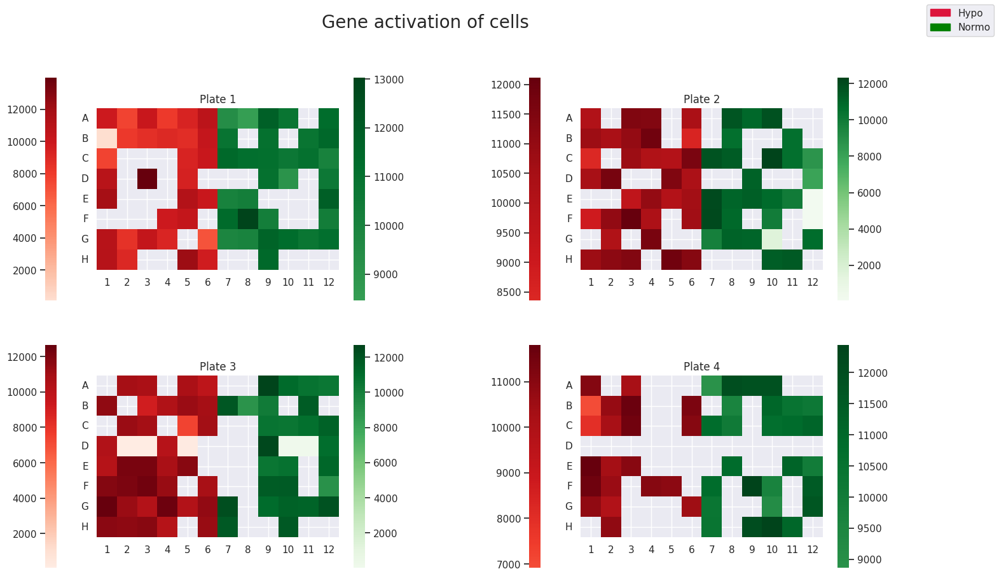

In [ ]:
plate_1_values = pd.DataFrame(np.zeros((8,12)), index=list('ABCDEFGH'), columns=list(i+1 for i in range(12)))
for i in plate_1_pos.index:
    plate_1_values.loc[plate_1_pos.loc[i][0]][plate_1_pos.loc[i][1]] = plate_1.loc[:,i].astype(bool).sum()
plate_2_values = pd.DataFrame(np.zeros((8,12)), index=list('ABCDEFGH'), columns=list(i+1 for i in range(12)))
for i in plate_2_pos.index:
    plate_2_values.loc[plate_2_pos.loc[i][0]][plate_2_pos.loc[i][1]] = plate_2.loc[:,i].astype(bool).sum()
plate_3_values = pd.DataFrame(np.zeros((8,12)), index=list('ABCDEFGH'), columns=list(i+1 for i in range(12)))
for i in plate_3_pos.index:
    plate_3_values.loc[plate_3_pos.loc[i][0]][plate_3_pos.loc[i][1]] = plate_3.loc[:,i].astype(bool).sum()
plate_4_values = pd.DataFrame(np.zeros((8,12)), index=list('ABCDEFGH'), columns=list(i+1 for i in range(12)))
for i in plate_4_pos.index:
    plate_4_values.loc[plate_4_pos.loc[i][0]][plate_4_pos.loc[i][1]] = plate_4.loc[:,i].astype(bool).sum()

fig , ax = plt.subplots(2,2, figsize=(18,10))

plate_1_hypo = plate_1_values.copy()
plate_1_hypo.iloc[:,6:]=0
plate_1_normo = plate_1_values.copy()
plate_1_normo.iloc[:,:6]=0

plate_2_hypo = plate_2_values.copy()
plate_2_hypo.iloc[:,6:]=0
plate_2_normo = plate_2_values.copy()
plate_2_normo.iloc[:,:6]=0

plate_3_hypo = plate_3_values.copy()
plate_3_hypo.iloc[:,6:]=0
plate_3_normo = plate_3_values.copy()
plate_3_normo.iloc[:,:6]=0

plate_4_hypo = plate_4_values.copy()
plate_4_hypo.iloc[:,6:]=0
plate_4_normo = plate_4_values.copy()
plate_4_normo.iloc[:,:6]=0


sns.heatmap(plate_1_hypo, xticklabels=plate_1_hypo.columns, yticklabels=plate_1_hypo.index, cmap='Reds', center=6000, mask=(plate_1_hypo==0), ax=ax[0,0], square=True, cbar_kws = {'location':'left'})
sns.heatmap(plate_2_hypo, xticklabels=plate_2_hypo.columns, yticklabels=plate_2_hypo.index, cmap='Reds', center=6000, mask=(plate_2_hypo==0), ax=ax[0,1], square=True, cbar_kws = {'location':'left'})
sns.heatmap(plate_3_hypo, xticklabels=plate_3_hypo.columns, yticklabels=plate_3_hypo.index, cmap='Reds', center=6000, mask=(plate_3_hypo==0), ax=ax[1,0], square=True, cbar_kws = {'location':'left'})
sns.heatmap(plate_4_hypo, xticklabels=plate_4_hypo.columns, yticklabels=plate_4_hypo.index, cmap='Reds', center=6000, mask=(plate_4_hypo==0), ax=ax[1,1], square=True, cbar_kws = {'location':'left'})

h = sns.heatmap(plate_1_normo, xticklabels=plate_1_normo.columns, yticklabels=plate_1_normo.index, cmap='Greens', center=6000, mask=(plate_1_normo==0), ax=ax[0,0], square=True)
h.set_xticklabels(h.get_xticklabels(), rotation = 0)
h.set_yticklabels(h.get_yticklabels(), rotation = 0)
h = sns.heatmap(plate_2_normo, xticklabels=plate_2_normo.columns, yticklabels=plate_2_normo.index, cmap='Greens', center=6000, mask=(plate_2_normo==0), ax=ax[0,1], square=True)
h.set_xticklabels(h.get_xticklabels(), rotation = 0)
h.set_yticklabels(h.get_yticklabels(), rotation = 0)
h = sns.heatmap(plate_3_normo, xticklabels=plate_3_normo.columns, yticklabels=plate_3_normo.index, cmap='Greens', center=6000, mask=(plate_3_normo==0), ax=ax[1,0], square=True)
h.set_xticklabels(h.get_xticklabels(), rotation = 0)
h.set_yticklabels(h.get_yticklabels(), rotation = 0)
h = sns.heatmap(plate_4_normo, xticklabels=plate_4_normo.columns, yticklabels=plate_4_normo.index, cmap='Greens', center=6000, mask=(plate_4_normo==0), ax=ax[1,1], square=True)
h.set_xticklabels(h.get_xticklabels(), rotation = 0)
h.set_yticklabels(h.get_yticklabels(), rotation = 0)

ax[0,0].set_title('Plate 1')
ax[0,1].set_title('Plate 2')
ax[1,0].set_title('Plate 3')
ax[1,1].set_title('Plate 4')

fig.suptitle("Gene activation of cells", fontsize=20)
red_patch = mpatches.Patch(color='crimson', label='Hypo')
green_patch = mpatches.Patch(color='green', label='Normo')
fig.legend(handles=[red_patch, green_patch], loc=1)
plt.show()

As we can see from the plot, in the frist three plates there are cells with a very low gene activation both among the hypoxic and the normal one, an issue that will be dealt with later on.
<br>
By looking at the last plate we can also see that there may have been some issue in the processing of the cells, since there is a row that is completely blank, with no cell readings. Moreover, as we also noticed during the exploration of the dataset values we can see that the last plate has significantly less cells readings than the others, on the other hand there are no "dead" cells in that plate (cells with very low gene activation counts).

---





To gain an initial understanding of the data, we create boxplots and violin plots that depict the distribution shapes of gene expression profiles from a selected few cells. Moreover, we use violin plots to graphically represent the distribution of gene expression level for several genes across the cells.

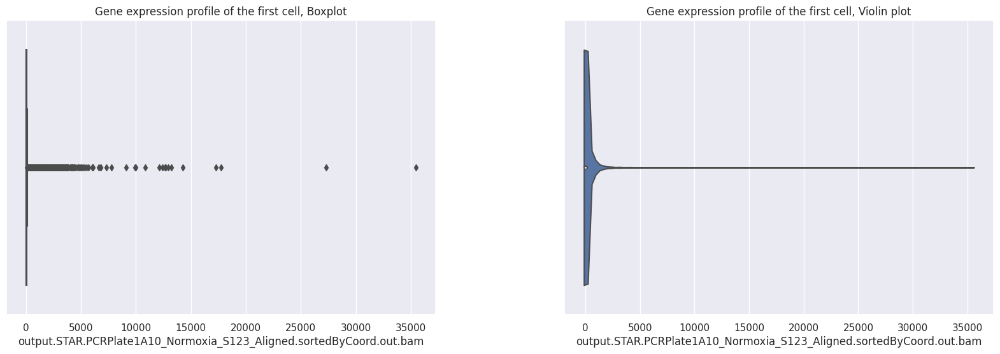

In [ ]:
fig, ax = plt.subplots( 1, 2, figsize = (20,6))
sns.set_style("white")
fig.subplots_adjust(hspace=0.3, wspace=0.3)

# Boxplot of gene expression profile of the first cell
cnames = list(df_hcc_smart_unfiltered.columns)
cnames[0]
sns.boxplot(x=df_hcc_smart_unfiltered[cnames[0]], ax=ax[0]).set_title('Gene expression profile of the first cell, Boxplot')

# Violin plot of gene expression of the first cell
sns.violinplot(x=df_hcc_smart_unfiltered[cnames[0]], ax=ax[1]).set_title('Gene expression profile of the first cell, Violin plot')
plt.show()

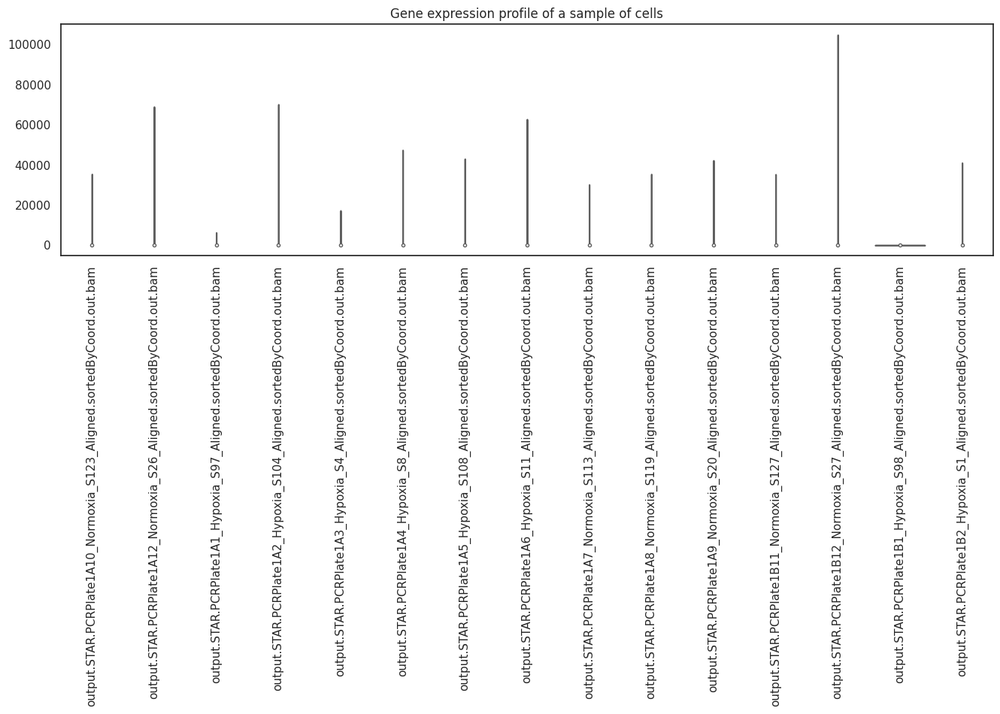

In [ ]:
# Plotting the violin plots of the gene expression of a sample of cells
plt.figure(figsize=(16,4))
plot=sns.violinplot(data=df_hcc_smart_unfiltered.iloc[:, :15],palette="Set3",cut=0)
plt.setp(plot.get_xticklabels(), rotation=90)
plt.title('Gene expression profile of a sample of cells')
plt.show()

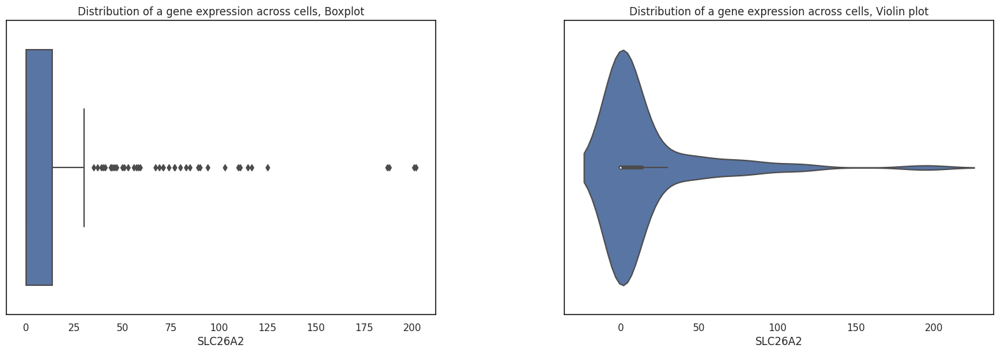

In [ ]:
fig, ax = plt.subplots( 1, 2, figsize = (20,6))
sns.set_style("white")
fig.subplots_adjust(hspace=0.3, wspace=0.3)

# Boxplot of the distribution of a gene expression level 
sns.boxplot(x=df_hcc_smart_unfiltered.loc['SLC26A2', :], ax=ax[0]).set_title('Distribution of a gene expression across cells, Boxplot')
# Violin plot of the distribution of a gene expression level 
sns.violinplot(x=df_hcc_smart_unfiltered.loc['SLC26A2', :], ax=ax[1]).set_title('Distribution of a gene expression across cells, Violin plot')
plt.show()

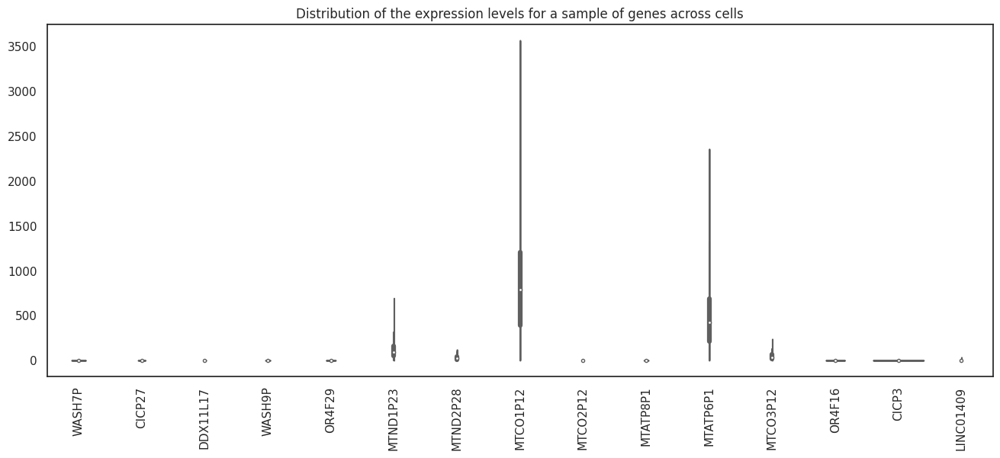

In [ ]:
# Distributions of the expression levels across cells for a sample of genes
plt.figure(figsize=(16, 6))
plot=sns.violinplot(data=df_hcc_smart_unfiltered.iloc[:15,:].T, palette='Set3', cut=0)
plt.setp(plot.get_xticklabels(), rotation=90)
plt.title('Distribution of the expression levels for a sample of genes across cells')
plt.show()

Our initial impression that the data is sparse, appears to be confirmed by these first graphs. Additionally, it is evident that some gene expressions are significantly larger than the majority.

## Filtering

###Check for duplicates

In data recording tasks, it is useful to check for duplicate rows; that is, pairs of genes that have the same counts across all cells. In our specific case, there may be certain features that have the same frequency across experiments but different names. This could be because of redundancy in gene annotation or overlapping gene annotations in the same region. If we retain both duplicates, we risk generating a biased result. Therefore, we examine and potentially keep one of the duplicate features, but it is important to document this action, as it may lead to issues with data interpretation in the future. 

In [ ]:
duplicate_rows_df = df_hcc_smart_unfiltered[df_hcc_smart_unfiltered.duplicated(keep=False)]
print("number of duplicate rows: ", duplicate_rows_df.shape)

number of duplicate rows:  (89, 243)


There are 89 duplicate genes. Now we understand where the duplicates really are. 

In [ ]:
print("names of duplicate rows: ",duplicate_rows_df.index)
duplicate_rows_df_t = duplicate_rows_df.T
duplicate_rows_df_t
c_dupl = duplicate_rows_df_t.corr()
c_dupl

names of duplicate rows:  Index(['MMP23A', 'LINC01647', 'LINC01361', 'ITGA10', 'RORC', 'GPA33', 'OR2M4',
       'LINC01247', 'SNORD92', 'LINC01106', 'ZBTB45P2', 'AOX3P', 'CPS1',
       'RPS3AP53', 'CCR4', 'RNY1P12', 'C4orf50', 'C4orf45', 'PCDHA2', 'PCDHA8',
       'PCDHGA2', 'PCDHGA3', 'PCDHGB3', 'PCDHGA7', 'PCDHGA9', 'PCDHGB7',
       'PCDHGA12', 'PCDHGB9P', 'PCDHGC4', 'SMIM23', 'PANDAR', 'LAP3P2',
       'RBBP4P3', 'RPL21P66', 'VNN3', 'TRPV6', 'CNPY1', 'ASS1P4', 'SLC7A3',
       'MIR374B', 'MIR374C', 'NAB1P1', 'RPL10AP3', 'MIR548AA1', 'MIR548D1',
       'SCARNA8', 'MIR3074', 'MIR24-1', 'SUGT1P4-STRA6LP', 'STRA6LP', 'KCNA4',
       'FBLIM1P2', 'APLNR', 'CYCSP26', 'OPCML', 'B3GAT1-DT', 'RPL21P88',
       'LINC02625', 'RPL22P18', 'PAX2', 'SOX5', 'COL2A1', 'LINC02395',
       'LDHAL6CP', 'CUX2', 'LINC00621', 'NUS1P2', 'UBBP5', 'OR5AU1',
       'LINC02833', 'RASL12', 'CILP', 'MIR6864', 'MIR4520-1', 'MIR4520-2',
       'CCL3L3', 'CCL3L1', 'RNU6-826P', 'OR4D1', 'MSX2P1', 'MIR548D2',
       

,MMP23A,LINC01647,LINC01361,ITGA10,RORC,GPA33,OR2M4,LINC01247,SNORD92,LINC01106,...,MSX2P1,MIR548D2,MIR548AA2,KCNJ16,CD300A,ENPP7,DTNA,ALPK2,OR7G2,PLVAP
MMP23A,1.000000,-0.008299,-0.008299,-0.008299,-0.008299,-0.008299,-0.008299,-0.008299,-0.008299,-0.010083,...,-0.008299,-0.009421,-0.009421,-0.008299,-0.008299,-0.008299,-0.008299,-0.006540,-0.008299,-0.008299
LINC01647,-0.008299,1.000000,0.495851,0.495851,-0.008299,0.495851,-0.008299,0.495851,-0.008299,0.234944,...,-0.008299,-0.009421,-0.009421,0.495851,0.495851,0.495851,0.495851,0.788121,0.495851,0.495851
LINC01361,-0.008299,0.495851,1.000000,1.000000,0.495851,1.000000,0.495851,0.495851,-0.008299,-0.010083,...,-0.008299,-0.009421,-0.009421,0.495851,1.000000,0.495851,1.000000,0.081755,0.495851,1.000000
ITGA10,-0.008299,0.495851,1.000000,1.000000,0.495851,1.000000,0.495851,0.495851,-0.008299,-0.010083,...,-0.008299,-0.009421,-0.009421,0.495851,1.000000,0.495851,1.000000,0.081755,0.495851,1.000000
RORC,-0.008299,-0.008299,0.495851,0.495851,1.000000,0.495851,1.000000,-0.008299,-0.008299,-0.010083,...,-0.008299,-0.009421,-0.009421,-0.008299,0.495851,-0.008299,0.495851,-0.006540,-0.008299,0.495851
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ENPP7,-0.008299,0.495851,0.495851,0.495851,-0.008299,0.495851,-0.008299,0.495851,-0.008299,-0.010083,...,-0.008299,-0.009421,-0.009421,0.495851,0.495851,1.000000,0.495851,0.081755,0.495851,0.495851
DTNA,-0.008299,0.495851,1.000000,1.000000,0.495851,1.000000,0.495851,0.495851,-0.008299,-0.010083,...,-0.008299,-0.009421,-0.009421,0.495851,1.000000,0.495851,1.000000,0.081755,0.495851,1.000000
ALPK2,-0.006540,0.788121,0.081755,0.081755,-0.006540,0.081755,-0.006540,0.081755,-0.006540,0.335362,...,-0.006540,-0.007425,-0.007425,0.081755,0.081755,0.081755,0.081755,1.000000,0.081755,0.081755
OR7G2,-0.008299,0.495851,0.495851,0.495851,-0.008299,0.495851,-0.008299,0.495851,-0.008299,-0.010083,...,-0.008299,-0.009421,-0.009421,0.495851,0.495851,0.495851,0.495851,0.081755,1.000000,0.495851


We look at the statistics of the gene expression profiles of genes that seem duplicates.

In [ ]:
duplicate_rows_df_t.describe()

,MMP23A,LINC01647,LINC01361,ITGA10,RORC,GPA33,OR2M4,LINC01247,SNORD92,LINC01106,...,MSX2P1,MIR548D2,MIR548AA2,KCNJ16,CD300A,ENPP7,DTNA,ALPK2,OR7G2,PLVAP
count,243.000000,243.000000,243.000000,243.000000,243.000000,243.000000,243.000000,243.000000,243.000000,243.000000,...,243.000000,243.000000,243.000000,243.000000,243.000000,243.000000,243.000000,243.000000,243.000000,243.000000
mean,0.008230,0.008230,0.008230,0.008230,0.008230,0.008230,0.008230,0.008230,0.008230,0.041152,...,0.008230,0.024691,0.024691,0.008230,0.008230,0.008230,0.008230,0.037037,0.008230,0.008230
std,0.090534,0.090534,0.090534,0.090534,0.090534,0.090534,0.090534,0.090534,0.090534,0.372552,...,0.090534,0.239247,0.239247,0.090534,0.090534,0.090534,0.090534,0.516931,0.090534,0.090534
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,5.000000,...,1.000000,3.000000,3.000000,1.000000,1.000000,1.000000,1.000000,8.000000,1.000000,1.000000


The majority of the duplicates seem to be sparse. Next, we remove them. 

In [ ]:
df_noDup = df_hcc_smart_unfiltered.drop_duplicates()

In [ ]:
df_noDup.shape

(23342, 243)

### Sparsity and Outliers

A dataset is said to be sparse when the data stored for a particular feature contains mostly zeroes. This could cause machine learning models to operate in a biased behaviour. There are several strategies to solve data sparsity, which we will investigate.

As previously noted, both the data referring to gene expression across cells and the gene expression profile of single cells are sparse: most of the entries are zeros (more than 50%). Moreover, it is interesting to notice that there are some very big outliers. Both of these features of the dataset will be further investigated throughout the report.

####Outliers

As previously mentioned, our dataset seems to present a lot of outliers. We try to recognise outliers by computing the interquartile range for each feature, and by looking for those values in our dataset that have a distance larger than 1.5 times the interquartile range from the closest between the first and the third quartile. 

We first compute the interquartile range for the gene expression levels in cells.

In [ ]:
Q1 = df_hcc_smart_unfiltered.T.quantile(0.25)
Q3 = df_hcc_smart_unfiltered.T.quantile(0.75)
IQR = Q3 - Q1
IQR.value_counts()

0.0       10145
1.0         700
2.0         330
3.0         225
4.0         181
          ...  
1528.5        1
370.5         1
635.5         1
278.0         1
1979.5        1
Length: 1539, dtype: int64

10 145 genes have an interquartile range 0. This means that most of their readings across cells share the same value and by our previous investigation we know that that value must be 0. Therefore, as previously discussed, the data is very sparse.  

As mentioned, we define "outliers" those values in our dataset that have a distance larger than 1.5 times the interquartile range from the closest between the first and the third quartile.

In [ ]:
low_bound = (Q1 - 1.5*IQR)
high_bound = (Q3 + 1.5*IQR)

We only want to keep those cells that have no outlier values among their features

In [ ]:
msk = (df_hcc_smart_unfiltered.T < low_bound) | (df_hcc_smart_unfiltered.T > high_bound)
df_filt = df_hcc_smart_unfiltered.T[~ msk.any(axis=1)]
df_filt.shape

(0, 23396)

By filtering the data according to the absence of outlier values among their features, all the cells have been removed. So, this strategy doesn't work. We apply an analogous strategy on the genes' expressions.

In [ ]:
Q1 = df_hcc_smart_unfiltered.quantile(0.25)
Q3 = df_hcc_smart_unfiltered.quantile(0.75)
IQR = Q3 - Q1
IQR.value_counts()

22.0     9
0.0      9
16.0     7
29.0     7
25.0     7
        ..
132.0    1
6.0      1
84.0     1
28.0     1
41.0     1
Length: 102, dtype: int64

In [ ]:
low_bound = (Q1 - 1.5*IQR).T
high_bound = (Q3 + 1.5*IQR).T

In [ ]:
msk = (df_hcc_smart_unfiltered < low_bound) | (df_hcc_smart_unfiltered > high_bound)
df_filt = df_hcc_smart_unfiltered[~ msk.any(axis=1)]
df_filt.shape

(10815, 243)

About half of the genes have now been cut.

We analyse how this filtering affected our previously built violin plots. 

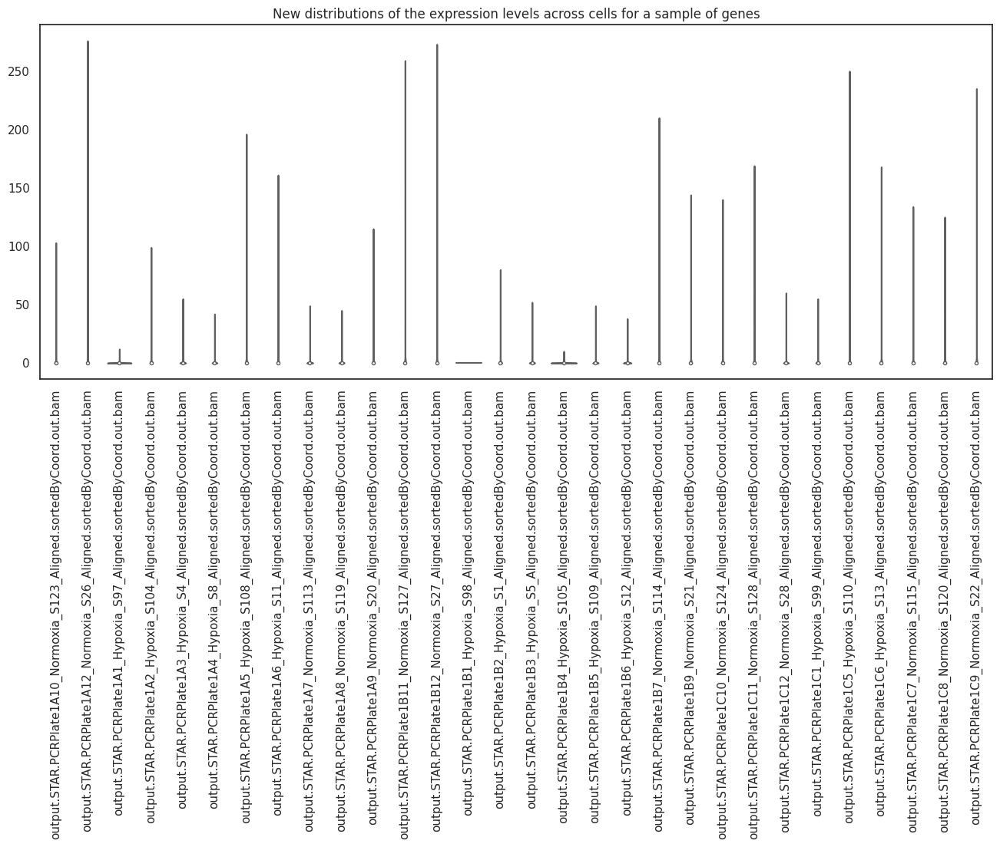

In [ ]:
plt.figure(figsize=(16, 6))
sns.violinplot(data=df_filt.iloc[:,:30], palette='Set3', cut=0)
plt.xticks(rotation=90)
plt.title("New distributions of the expression levels across cells for a sample of genes")
plt.show()

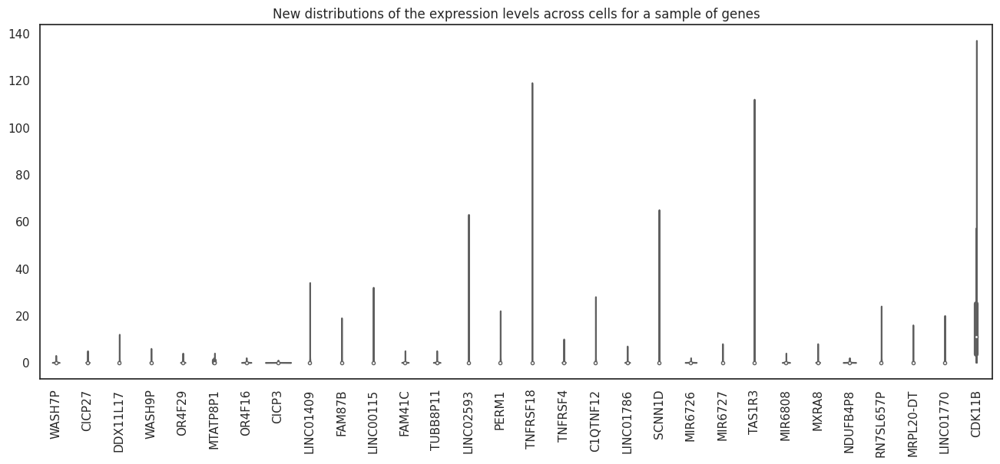

In [ ]:
plt.figure(figsize=(16, 6))
sns.violinplot(data=df_filt.iloc[:30,:].T, palette='Set3', cut=0)
plt.xticks(rotation=90)
plt.title("New distributions of the expression levels across cells for a sample of genes")
plt.show()

In order to calculate sparsity, one can divide the overall number of zero-valued elements by the total number of elements in a dataset. This is often defined as the "sparsity of the matrix".

In [ ]:
print("sparsity level:")
print("without outliers:", (df_filt == 0).sum().sum() / df_filt.size)
print("with outliers:", (df_hcc_smart_unfiltered == 0).sum().sum() / df_hcc_smart_unfiltered.size)

sparsity level:
without outliers: 0.8673120133026642
with outliers: 0.558456230779135


We obtain an unsatisfactory result: the post-filtering data are even more sparse than the original data. Therefore, our filtering method must be reshaped. We learn that we cannot simply filter the data by the outliers, because they often carry some important information for our inquiry.

####Sparsity of genes

Very sparse genes are generally expressed in a few amount of cells. We do not expect sparse genes to be relevant for the classification, since they add little information about the cells in which they are observed.

As previously detected, the sparsity level of our dataset is just above 0.5:

In [ ]:
print("sparsity level:", (df_hcc_smart_unfiltered == 0).sum().sum() / df_hcc_smart_unfiltered.size)

sparsity level: 0.558456230779135


We now compute the individual sparsity level of each gene, and the sparsity level of the expression level of genes across cells.

In [ ]:
sparsity_levels_genes = (df_hcc_smart_unfiltered.T==0).sum() / df_hcc_smart_unfiltered.T.shape[0]
sparsity_levels_genes

WASH7P      0.975309
CICP27      0.946502
DDX11L17    0.823045
WASH9P      0.860082
OR4F29      0.901235
              ...   
MT-TE       0.078189
MT-CYB      0.032922
MT-TT       0.074074
MT-TP       0.041152
MAFIP       0.296296
Length: 23396, dtype: float64

In [ ]:
sparsity_levels_cells = (df_hcc_smart_unfiltered==0).sum() / df_hcc_smart_unfiltered.shape[0]
sparsity_levels_cells.sort_values()

output.STAR.PCRPlate1D3_Hypoxia_S6_Aligned.sortedByCoord.out.bam        0.402206
output.STAR.PCRPlate1F8_Normoxia_S18_Aligned.sortedByCoord.out.bam      0.443110
output.STAR.PCRPlate3A9_Normoxia_S83_Aligned.sortedByCoord.out.bam      0.457258
output.STAR.PCRPlate3G1_Hypoxia_S164_Aligned.sortedByCoord.out.bam      0.458882
output.STAR.PCRPlate3D9_Normoxia_S86_Aligned.sortedByCoord.out.bam      0.466105
                                                                          ...   
output.STAR.PCRPlate2F12_Normoxia_S62_Aligned.sortedByCoord.out.bam     0.996367
output.STAR.PCRPlate3D2_Hypoxia_S168_Aligned.sortedByCoord.out.bam      0.996538
output.STAR.PCRPlate3D10_Normoxia_S188_Aligned.sortedByCoord.out.bam    0.996965
output.STAR.PCRPlate2E12_Normoxia_S61_Aligned.sortedByCoord.out.bam     0.997136
output.STAR.PCRPlate3D11_Normoxia_S92_Aligned.sortedByCoord.out.bam     0.998504
Length: 243, dtype: float64

We represent these sparsity levels in their corresponding histograms

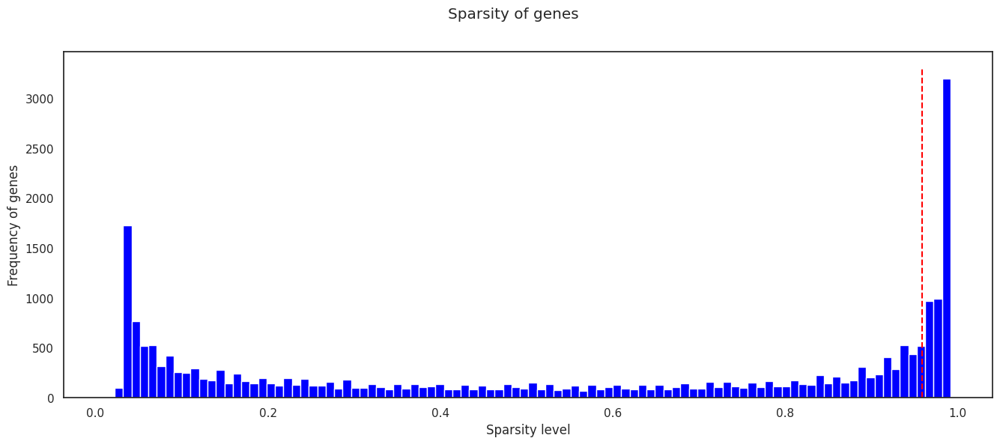

In [ ]:
fig, ax = plt.subplots(figsize=(16, 6))
sns.set_style("white")

bars = ax.hist(sparsity_levels_genes, bins = 100, color = 'blue')

# Labels
fig.suptitle("Sparsity of genes")
ax.set_xlabel("Sparsity level")
ax.set_ylabel("Frequency of genes");

sparsity_threshold = 0.9588477366255144

ax.plot([sparsity_threshold, sparsity_threshold], [0, 3300], color='red', linestyle='dashed')

sns.set_theme() 

We can easily notice that the distribution of the sparsity level of genes has two tall peaks at its extremes. We aim at filtering the data that is extremely sparse, since it may cause a decrease in the performance of our algorithms.

Hence, we filter out those genes that are expressed in ten or less cells.

In [ ]:
sparsity_threshold = -((10 - df_hcc_smart_unfiltered.T.shape[0])/df_hcc_smart_unfiltered.T.shape[0])
sparsity_threshold

0.9588477366255144

In [ ]:
sparse_genes = (sparsity_levels_genes > sparsity_threshold)
df_genes_not_sparse = df_hcc_smart_unfiltered.T.drop(df_hcc_smart_unfiltered.T.columns[sparse_genes], axis=1)
print('Number of relevant genes:',df_genes_not_sparse.shape[1])

Number of relevant genes: 18239


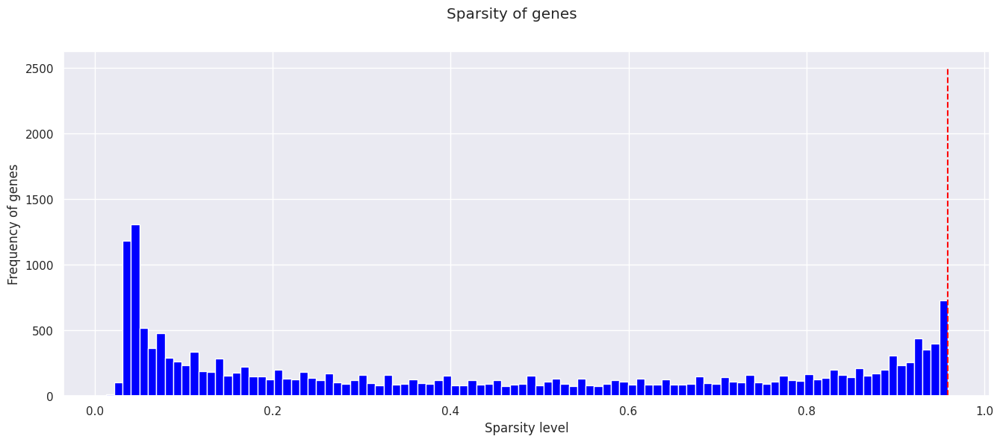

In [ ]:
sparsity_levels_genes_not_sparse = (df_genes_not_sparse==0).sum() / df_genes_not_sparse.shape[0]
fig, ax = plt.subplots(figsize=(16, 6))
sns.set_style("white")

bars = ax.hist(sparsity_levels_genes_not_sparse, bins = 100, color = 'blue')

fig.suptitle("Sparsity of genes")
ax.set_xlabel("Sparsity level")
ax.set_ylabel("Frequency of genes");

sparsity_threshold = 0.9588477366255144

ax.plot([sparsity_threshold, sparsity_threshold], [0, 2500], color='red', linestyle='dashed')

sns.set_theme()

In [ ]:
not_sparse_genes = (sparsity_levels_genes <= sparsity_threshold)
df_genes_sparse = df_hcc_smart_unfiltered.T.drop(df_hcc_smart_unfiltered.T.columns[not_sparse_genes], axis=1)
print('Number of sparse genes:',df_genes_sparse.shape[1])

Number of sparse genes: 5157


### Variability


We aim to delete from our dataset those genes that have the lowest variability. Indeed, these are the genes that appear with similar frequencies in most cells, meaning that they add little information to our inquiry. In our inquiry, we will only keep the upper quartile of the vmr distribution.

In [ ]:
std_dev = df_hcc_smart_unfiltered.std(axis=1)
var = df_hcc_smart_unfiltered.var(axis=1)

In [ ]:
#Sort by standard deviation
sorted_std_dev = std_dev.sort_values(ascending=False)

# Sort by variance
sorted_variance = var.sort_values(ascending=False)

In [ ]:
sorted_std_dev

FTL           24669.076099
ACTB          18288.941367
FTH1          15853.673169
LDHA          14290.034283
BEST1         13738.877437
                  ...     
HNRNPA1P13        0.090534
TXNDC8            0.090534
MIR138-1          0.090534
OR12D1            0.090534
SMYD3-IT1         0.090534
Length: 23396, dtype: float64

In [ ]:
sorted_variance

FTL           6.085633e+08
ACTB          3.344854e+08
FTH1          2.513390e+08
LDHA          2.042051e+08
BEST1         1.887568e+08
                  ...     
SMYD3-IT1     8.196443e-03
TMSB4Y        8.196443e-03
HNRNPA1P13    8.196443e-03
EEF1GP8       8.196443e-03
C1GALT1P2     8.196443e-03
Length: 23396, dtype: float64

In [ ]:
mean_values = df_hcc_smart_unfiltered.mean(axis=1)

In [ ]:
sorted_mean = mean_values.sort_values(ascending=False)

In [ ]:
sorted_mean

ACTB          27087.000000
FTL           23305.798354
GAPDH         16000.962963
LDHA          15654.251029
FTH1          12939.954733
                  ...     
CEACAM7           0.008230
ISCA1P2           0.008230
OPN4              0.008230
RPL7AP8           0.008230
HNRNPA1P19        0.008230
Length: 23396, dtype: float64

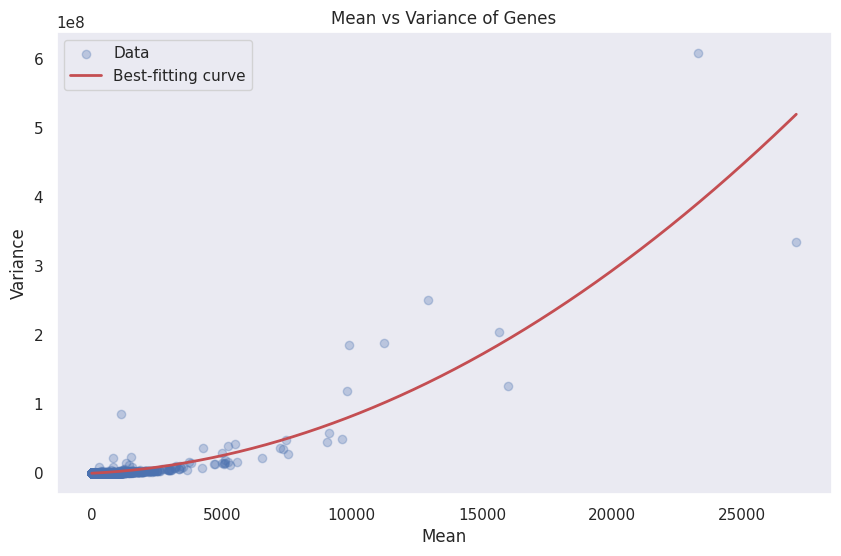

In [ ]:
# create a best fitting curve for the plot

from scipy.optimize import curve_fit

def polynomial_func(x, a, b, c):
    return a * x**2 + b * x + c
  
popt, _ = curve_fit(polynomial_func, mean_values, var)
a, b, c = popt

# create plot 
plt.figure(figsize=(10, 6))
plt.scatter(mean_values, var, alpha = 0.3, label='Data')

# Plot the fitted curve
x_line = np.linspace(min(mean_values), max(mean_values), 1000)
y_line = polynomial_func(x_line, a, b, c)
plt.plot(x_line, y_line, 'r', label='Best-fitting curve', linewidth=2)

plt.xlabel('Mean')
plt.ylabel('Variance')
plt.title('Mean vs Variance of Genes')
plt.legend()
plt.grid()
plt.show()

Next we try applying different transformations to the data to better capture the differences in variability.

In [ ]:
# apply a log-transformation

log_df = np.log2(df_hcc_smart_unfiltered+1)
log_df.head()

,output.STAR.PCRPlate1A10_Normoxia_S123_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1A12_Normoxia_S26_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1A1_Hypoxia_S97_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1A2_Hypoxia_S104_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1A3_Hypoxia_S4_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1A4_Hypoxia_S8_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1A5_Hypoxia_S108_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1A6_Hypoxia_S11_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1A7_Normoxia_S113_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1A8_Normoxia_S119_Aligned.sortedByCoord.out.bam,...,output.STAR.PCRPlate4G12_Normoxia_S243_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4G1_Hypoxia_S193_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4G2_Hypoxia_S198_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4G6_Hypoxia_S232_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4G7_Normoxia_S204_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4H10_Normoxia_S210_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4H11_Normoxia_S214_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4H2_Hypoxia_S199_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4H7_Normoxia_S205_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4H9_Normoxia_S236_Aligned.sortedByCoord.out.bam
WASH7P,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
CICP27,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
DDX11L17,0.000000,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
WASH9P,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0
OR4F29,1.584963,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
# recalculate std, var, mean

log_std_dev = log_df.std(axis=1)
log_var = log_df.var(axis=1)
log_mean_values = log_df.mean(axis=1)

In [ ]:
#Sort by standard deviation
log_sorted_std_dev = log_std_dev.sort_values(ascending=False)

# Sort by variance
log_sorted_variance = log_var.sort_values(ascending=False)

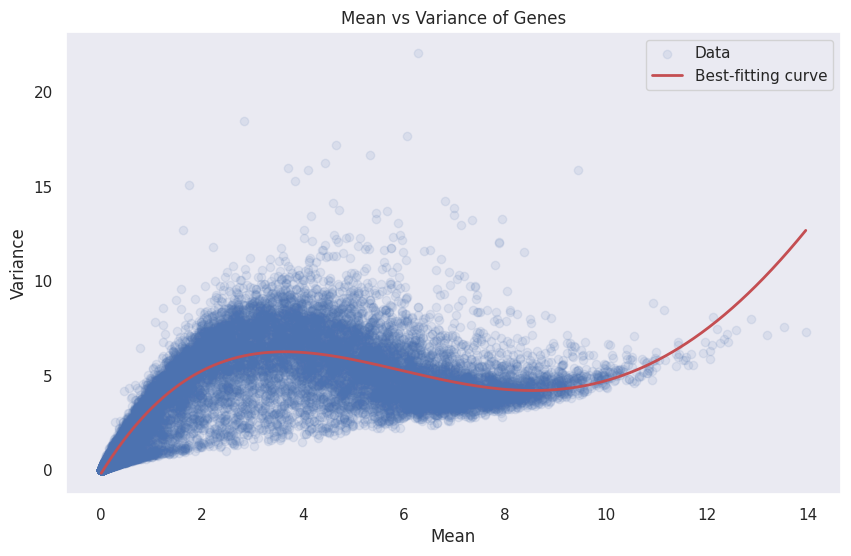

In [ ]:
# create a best fitting curve for the plot

from scipy.optimize import curve_fit

def polynomial_func(x, a, b, c, d, e):
    return a * x**4 + b * x**3 + c * x**2 + d * x + e
  
popt, _ = curve_fit(polynomial_func, log_mean_values, log_var)
a, b, c, d, e = popt

# create plot 
plt.figure(figsize=(10, 6))
plt.scatter(log_mean_values, log_var, alpha = 0.1, label='Data')

# Plot the fitted curve
x_line = np.linspace(min(log_mean_values), max(log_mean_values), 1000)
y_line = polynomial_func(x_line, a, b, c, d, e)
plt.plot(x_line, y_line, 'r', label='Best-fitting curve', linewidth=2)

plt.xlabel('Mean')
plt.ylabel('Variance')
plt.title('Mean vs Variance of Genes')
plt.legend()
plt.grid()
plt.show()

In [ ]:
# apply a square-root transformation

sqrt_df = np.sqrt(df_hcc_smart_unfiltered)
sqrt_df.head()

,output.STAR.PCRPlate1A10_Normoxia_S123_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1A12_Normoxia_S26_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1A1_Hypoxia_S97_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1A2_Hypoxia_S104_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1A3_Hypoxia_S4_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1A4_Hypoxia_S8_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1A5_Hypoxia_S108_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1A6_Hypoxia_S11_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1A7_Normoxia_S113_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1A8_Normoxia_S119_Aligned.sortedByCoord.out.bam,...,output.STAR.PCRPlate4G12_Normoxia_S243_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4G1_Hypoxia_S193_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4G2_Hypoxia_S198_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4G6_Hypoxia_S232_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4G7_Normoxia_S204_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4H10_Normoxia_S210_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4H11_Normoxia_S214_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4H2_Hypoxia_S199_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4H7_Normoxia_S205_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4H9_Normoxia_S236_Aligned.sortedByCoord.out.bam
WASH7P,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
CICP27,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
DDX11L17,0.000000,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
WASH9P,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0
OR4F29,1.414214,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
# recalculate std, var, mean

sqrt_std_dev = sqrt_df.std(axis=1)
sqrt_var = sqrt_df.var(axis=1)
sqrt_mean_values = sqrt_df.mean(axis=1)

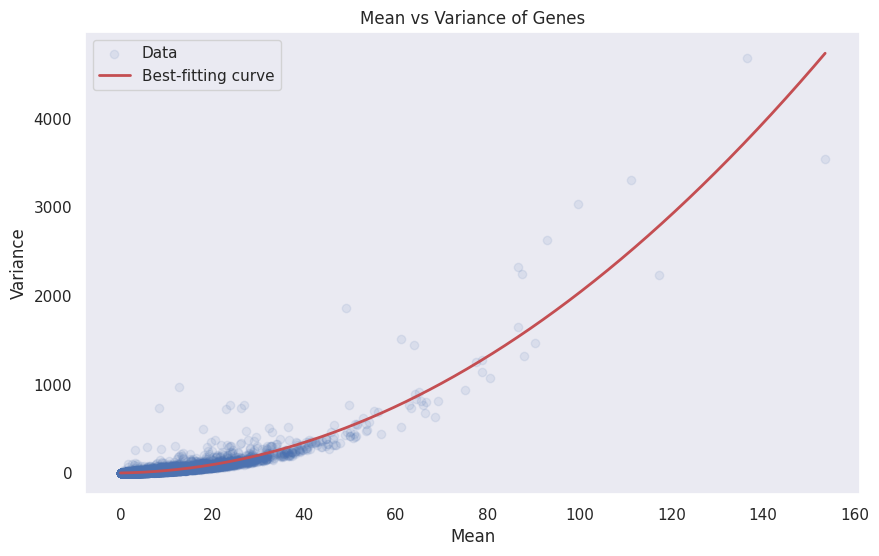

In [ ]:
# create a best fitting curve for the plot

from scipy.optimize import curve_fit

def polynomial_func(x, a, b, c):
    return a * x**2 + b * x + c 
  
popt, _ = curve_fit(polynomial_func, sqrt_mean_values, sqrt_var)
a, b, c = popt

# create plot 
plt.figure(figsize=(10, 6))
plt.scatter(sqrt_mean_values, sqrt_var, alpha = 0.1, label='Data')

# Plot the fitted curve
x_line = np.linspace(min(sqrt_mean_values), max(sqrt_mean_values), 1000)
y_line = polynomial_func(x_line, a, b, c)
plt.plot(x_line, y_line, 'r', label='Best-fitting curve', linewidth=2)

plt.xlabel('Mean')
plt.ylabel('Variance')
plt.title('Mean vs Variance of Genes')
plt.legend()
plt.grid()
plt.show()

We decide to work on the log-transformed data

We want to find an optimal threshold for filtering our data. Hence, we use an objective function to quantify how well the threshold separates the data into the desired groups. One common approach is to keep the upper quartile.

In [ ]:
# Calculate variance-to-mean ratio
vmr = log_var / log_mean_values

# Calculate the 75th percentile of the VMR values
vmr_threshold = vmr.quantile(0.75)

In [ ]:
# Get the column indices of genes with a VMR above the threshold
high_vmr_columns = vmr[vmr >= vmr_threshold].index

# Filter the DataFrame to keep only the genes with a high VMR
log_df_dispersed = df_hcc_smart_unfiltered.T[high_vmr_columns]

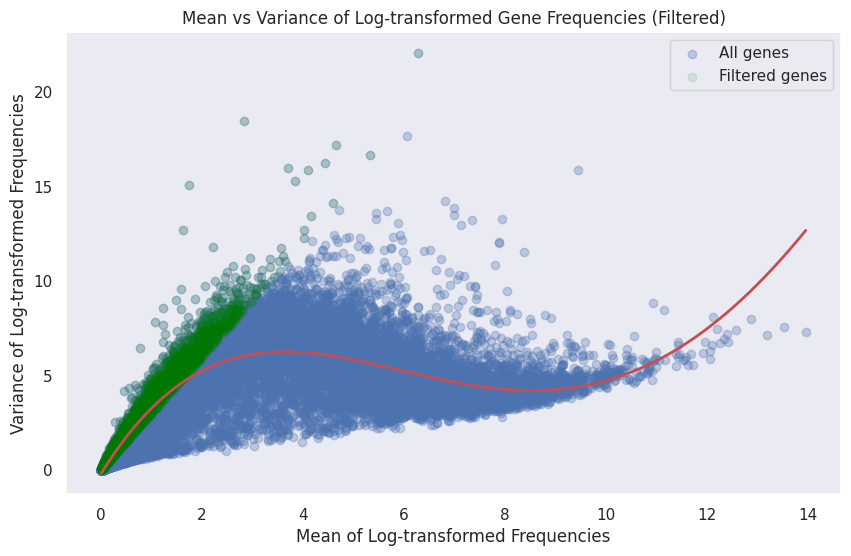

In [ ]:
# create a best fitting curve for the plot

from scipy.optimize import curve_fit

def polynomial_func(x, a, b, c, d, e):
    return a * x**4 + b * x**3 + c * x**2 + d * x + e
  
popt, _ = curve_fit(polynomial_func, log_mean_values, log_var)
a, b, c, d, e = popt

# create plot 
plt.figure(figsize=(10, 6))

# Plot all the genes with low alpha
plt.scatter(log_mean_values, log_var, alpha=0.3, label='All genes')

# Highlight the filtered genes with a higher alpha and different color
high_vmr_indices = vmr[vmr >= vmr_threshold].index
plt.scatter(log_mean_values[high_vmr_indices], log_var[high_vmr_indices], alpha=0.1, color='green', label='Filtered genes')

# Plot the fitted curve
x_line = np.linspace(min(log_mean_values), max(log_mean_values), 1000)
y_line = polynomial_func(x_line, a, b, c, d, e)
plt.plot(x_line, y_line, 'r', linewidth=2)

plt.xlabel('Mean of Log-transformed Frequencies')
plt.ylabel('Variance of Log-transformed Frequencies')
plt.title('Mean vs Variance of Log-transformed Gene Frequencies (Filtered)')
plt.legend()
plt.grid()
plt.show()

In [ ]:
print("Number of dispersed genes:",log_df_dispersed.shape[1])

Number of dispersed genes: 5849


In [ ]:
# Filter the rows based on the presence of the index in log_df_dispersed
df_dispersed = df_hcc_smart_unfiltered.T.loc[:, df_hcc_smart_unfiltered.T.columns.isin(log_df_dispersed.columns)]


In [ ]:
df_dispersed.shape

(243, 5849)

### Mitochondria density

By looking at the mitochondrial density in cells, we are able to assess if we are dealing with damaged cells. Indeed, when cells are perforated, or dying, they present a large percentage of mithocondrial genes. This is because mitochondrial genes are larger and take more time leaving dying cells whose membrane has been damaged.

In [ ]:
mt_genes = np.array(df_hcc_smart_unfiltered.T.columns[df_hcc_smart_unfiltered.T.columns.str.startswith("MT-")])
print(mt_genes)

['MT-TF' 'MT-RNR1' 'MT-TV' 'MT-RNR2' 'MT-TL1' 'MT-ND1' 'MT-TI' 'MT-TQ'
 'MT-TM' 'MT-ND2' 'MT-TW' 'MT-TA' 'MT-TC' 'MT-TY' 'MT-CO1' 'MT-TS1'
 'MT-TD' 'MT-CO2' 'MT-TK' 'MT-ATP8' 'MT-ATP6' 'MT-CO3' 'MT-TG' 'MT-ND3'
 'MT-TR' 'MT-ND4L' 'MT-ND4' 'MT-TH' 'MT-TS2' 'MT-TL2' 'MT-ND5' 'MT-ND6'
 'MT-TE' 'MT-CYB' 'MT-TT' 'MT-TP']


In [ ]:
df_mt = df_hcc_smart_unfiltered.T.loc[:,mt_genes]
df_mt

,MT-TF,MT-RNR1,MT-TV,MT-RNR2,MT-TL1,MT-ND1,MT-TI,MT-TQ,MT-TM,MT-ND2,...,MT-ND4,MT-TH,MT-TS2,MT-TL2,MT-ND5,MT-ND6,MT-TE,MT-CYB,MT-TT,MT-TP
output.STAR.PCRPlate1A10_Normoxia_S123_Aligned.sortedByCoord.out.bam,3,662,13,9947,44,1123,3,7,10,1364,...,17732,17,5,15,3852,900,22,4208,26,66
output.STAR.PCRPlate1A12_Normoxia_S26_Aligned.sortedByCoord.out.bam,13,1528,31,19835,111,2111,3,6,5,2069,...,15624,49,29,36,7457,1439,43,6491,62,71
output.STAR.PCRPlate1A1_Hypoxia_S97_Aligned.sortedByCoord.out.bam,0,14,0,195,1,34,0,0,0,14,...,200,0,0,0,93,12,0,25,0,1
output.STAR.PCRPlate1A2_Hypoxia_S104_Aligned.sortedByCoord.out.bam,1,453,0,5123,26,394,2,2,0,202,...,6588,43,17,8,1479,234,0,4819,11,3
output.STAR.PCRPlate1A3_Hypoxia_S4_Aligned.sortedByCoord.out.bam,0,190,4,1950,9,174,1,1,4,82,...,1028,0,0,3,303,33,0,310,4,9
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
output.STAR.PCRPlate4H10_Normoxia_S210_Aligned.sortedByCoord.out.bam,8,1005,10,8201,57,900,4,8,5,855,...,6273,25,17,11,2926,423,26,3719,42,48
output.STAR.PCRPlate4H11_Normoxia_S214_Aligned.sortedByCoord.out.bam,0,132,2,1421,4,243,1,1,0,207,...,1446,2,1,3,688,114,1,984,1,18
output.STAR.PCRPlate4H2_Hypoxia_S199_Aligned.sortedByCoord.out.bam,2,411,1,7836,29,542,1,9,9,558,...,7026,9,6,23,2999,486,4,2256,15,36
output.STAR.PCRPlate4H7_Normoxia_S205_Aligned.sortedByCoord.out.bam,1,192,0,1475,20,230,1,2,2,183,...,1201,2,3,3,611,75,4,981,6,8


In [ ]:
mt_density = df_mt.sum(axis=1) / df_hcc_smart_unfiltered.T.sum(axis=1)
mt_density.sort_values(ascending=False)

output.STAR.PCRPlate3D2_Hypoxia_S168_Aligned.sortedByCoord.out.bam      0.492157
output.STAR.PCRPlate1G6_Hypoxia_S15_Aligned.sortedByCoord.out.bam       0.077753
output.STAR.PCRPlate4B1_Hypoxia_S221_Aligned.sortedByCoord.out.bam      0.067976
output.STAR.PCRPlate2G10_Normoxia_S157_Aligned.sortedByCoord.out.bam    0.050459
output.STAR.PCRPlate2C1_Hypoxia_S131_Aligned.sortedByCoord.out.bam      0.048678
                                                                          ...   
output.STAR.PCRPlate1D3_Hypoxia_S6_Aligned.sortedByCoord.out.bam        0.004921
output.STAR.PCRPlate3D5_Hypoxia_S78_Aligned.sortedByCoord.out.bam       0.004622
output.STAR.PCRPlate1B1_Hypoxia_S98_Aligned.sortedByCoord.out.bam       0.002237
output.STAR.PCRPlate2A4_Hypoxia_S138_Aligned.sortedByCoord.out.bam      0.000435
output.STAR.PCRPlate3D10_Normoxia_S188_Aligned.sortedByCoord.out.bam    0.000000
Length: 243, dtype: float64

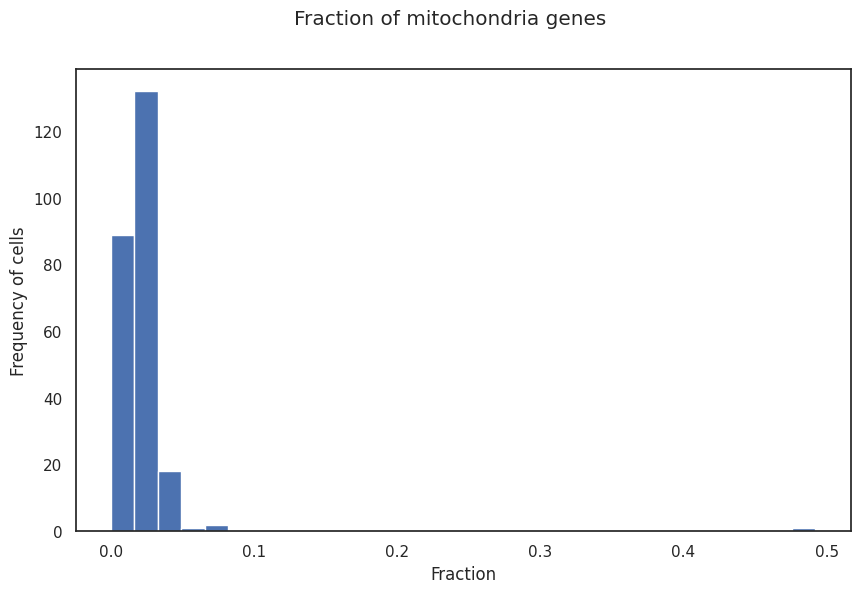

In [ ]:
fig = plt.figure(figsize=(10, 6))
sns.set_style("white")

ax1 = plt.axes()
ax1.hist(mt_density, bins = 30)

# Labels
fig.suptitle("Fraction of mitochondria genes")
ax1.set_xlabel("Fraction")
ax1.set_ylabel("Frequency of cells");

sns.set_theme() # resetting the style plot

We find that there is one strong outlier (around 0.5) to the main proportions of mitochondrial genes densities in our dataset. We want to filter that out.

In [ ]:
low_mt_density = mt_density[mt_density <= 0.1]
low_mt_density.sort_values(ascending=False)

output.STAR.PCRPlate1G6_Hypoxia_S15_Aligned.sortedByCoord.out.bam       0.077753
output.STAR.PCRPlate4B1_Hypoxia_S221_Aligned.sortedByCoord.out.bam      0.067976
output.STAR.PCRPlate2G10_Normoxia_S157_Aligned.sortedByCoord.out.bam    0.050459
output.STAR.PCRPlate2C1_Hypoxia_S131_Aligned.sortedByCoord.out.bam      0.048678
output.STAR.PCRPlate1H6_Hypoxia_S16_Aligned.sortedByCoord.out.bam       0.044875
                                                                          ...   
output.STAR.PCRPlate1D3_Hypoxia_S6_Aligned.sortedByCoord.out.bam        0.004921
output.STAR.PCRPlate3D5_Hypoxia_S78_Aligned.sortedByCoord.out.bam       0.004622
output.STAR.PCRPlate1B1_Hypoxia_S98_Aligned.sortedByCoord.out.bam       0.002237
output.STAR.PCRPlate2A4_Hypoxia_S138_Aligned.sortedByCoord.out.bam      0.000435
output.STAR.PCRPlate3D10_Normoxia_S188_Aligned.sortedByCoord.out.bam    0.000000
Length: 242, dtype: float64

In [ ]:
low_mt_density.size

242

Let's now filter our original dataframe according to this measure.

In [ ]:
df_lowmt = df_hcc_smart_unfiltered.T.loc[low_mt_density.index]
df_lowmt.shape

(242, 23396)

##Filtered Data

Now that we filtered our data by duplicates, sparsity, variability and mithocondrial gene proportions, we can create a final dataframe that only contains those data that are kept during all previous precedures.

In [ ]:
common_columns = set(df_dispersed).intersection(set(df_genes_not_sparse), set(df_noDup.T), set(df_dispersed), set(df_lowmt))
common_rows = set(df_dispersed.T).intersection(set(df_genes_not_sparse.T), set(df_noDup), set(df_dispersed.T), set(df_lowmt.T))

df_filt = df_hcc_smart_unfiltered.T.loc[common_rows, common_columns]


<ipython-input-85-33e785d58531>:4: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  df_filt = df_hcc_smart_unfiltered.T.loc[common_rows, common_columns]


In [ ]:
df_filt.shape

(242, 3979)

Before proceeding we check the frequency of cells in genes, such that we can verify if specific cells are outliers.

In [ ]:
list(df_filt.T.astype(bool).sum(axis=0).sort_values())

[3,
 5,
 6,
 8,
 12,
 13,
 14,
 54,
 314,
 349,
 398,
 399,
 409,
 431,
 441,
 447,
 447,
 450,
 466,
 469,
 502,
 503,
 508,
 511,
 521,
 524,
 525,
 525,
 527,
 534,
 564,
 567,
 576,
 587,
 595,
 598,
 598,
 617,
 627,
 639,
 643,
 645,
 645,
 650,
 651,
 655,
 662,
 664,
 671,
 677,
 678,
 682,
 685,
 696,
 697,
 700,
 701,
 703,
 704,
 704,
 705,
 707,
 712,
 712,
 719,
 729,
 731,
 732,
 733,
 733,
 740,
 740,
 742,
 745,
 745,
 746,
 754,
 755,
 761,
 762,
 763,
 765,
 766,
 767,
 767,
 770,
 771,
 772,
 781,
 787,
 791,
 792,
 792,
 793,
 793,
 798,
 801,
 802,
 808,
 822,
 822,
 823,
 825,
 825,
 834,
 837,
 841,
 843,
 843,
 855,
 858,
 861,
 867,
 872,
 876,
 881,
 882,
 882,
 884,
 884,
 886,
 888,
 889,
 896,
 900,
 904,
 907,
 910,
 914,
 916,
 917,
 919,
 919,
 919,
 923,
 925,
 925,
 926,
 928,
 930,
 933,
 935,
 936,
 951,
 952,
 952,
 958,
 960,
 962,
 962,
 967,
 970,
 973,
 978,
 979,
 979,
 980,
 980,
 982,
 983,
 985,
 985,
 989,
 993,
 997,
 999,
 1001,
 1002,
 1

We find 2 main group of outliers on the left and on the right. We filter these cells out.

In [ ]:
col_freqs = df_filt.T.astype(bool).sum(axis=0)

# Create a boolean mask based on the condition
mask = (col_freqs > 100) & (col_freqs < 2000)

# Filter the dataframe based on the mask
df_filtered = df_filt.loc[mask, :]

# Print the filtered dataframe shape
df_filtered.shape

(233, 3979)

### Exploration of filtered data

We now repeat some EDA steps on our new filtered dataset.

In [ ]:
print("Dataframe dimensions:", np.shape(df_filtered))

Dataframe dimensions: (233, 3979)


Our dimension has drastically decreased (from 23396 genes to 3979).

In [ ]:
df_filtered.T.describe()

,output.STAR.PCRPlate4A1_Hypoxia_S220_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate2E6_Hypoxia_S48_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate3A2_Hypoxia_S166_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1A12_Normoxia_S26_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1E6_Hypoxia_S14_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1C1_Hypoxia_S99_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate3H2_Hypoxia_S68_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1F5_Hypoxia_S9_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate2A1_Hypoxia_S129_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate3E9_Normoxia_S87_Aligned.sortedByCoord.out.bam,...,output.STAR.PCRPlate4G6_Hypoxia_S232_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate3G6_Hypoxia_S181_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4C8_Normoxia_S208_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate2C11_Normoxia_S160_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate3C10_Normoxia_S187_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4B8_Normoxia_S207_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate3F3_Hypoxia_S170_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate3F6_Hypoxia_S180_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1C9_Normoxia_S22_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4C11_Normoxia_S212_Aligned.sortedByCoord.out.bam
count,3979.000000,3979.000000,3979.000000,3979.000000,3979.000000,3979.000000,3979.000000,3979.000000,3979.000000,3979.000000,...,3979.000000,3979.000000,3979.000000,3979.000000,3979.000000,3979.000000,3979.000000,3979.000000,3979.000000,3979.000000
mean,8.368183,6.029404,4.555667,16.438050,5.462428,8.390550,3.481779,15.001257,2.708972,3.401357,...,3.298567,11.598392,21.273687,3.344810,3.892184,3.077909,4.506911,7.845439,20.587082,2.221412
std,38.600803,48.681917,18.333816,62.549571,27.621222,49.370347,14.618041,65.282114,25.271562,13.916472,...,29.875531,41.044698,384.867753,14.214164,14.407127,19.803229,12.566470,46.470223,70.569401,10.026410
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,3.000000,0.000000,0.000000,0.000000,...,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,5.000000,0.000000,0.000000,1.000000
max,1783.000000,2846.000000,584.000000,2503.000000,1149.000000,1896.000000,607.000000,2868.000000,1477.000000,539.000000,...,1565.000000,1228.000000,23827.000000,652.000000,322.000000,1077.000000,487.000000,2417.000000,1651.000000,530.000000


In [ ]:
print("sparsity level:", (df_filtered == 0).sum().sum() / df_filtered.size)

sparsity level: 0.7744791054322748


In [ ]:
df_filtered.describe()

,ADAMTSL5,LINC02562,TFCP2,FABP6,BCL6,CYP2J2,EPSTI1,KLHL11,MFHAS1,RLN2,...,KRT80,IRF7,MAPK8IP2,CNTLN,TAFA2,BTBD7P1,CNTN5,TTN-AS1,INHBB,EYA4
count,233.000000,233.000000,233.000000,233.000000,233.000000,233.000000,233.000000,233.000000,233.000000,233.000000,...,233.000000,233.000000,233.000000,233.000000,233.000000,233.000000,233.000000,233.000000,233.000000,233.000000
mean,17.703863,3.227468,21.566524,6.523605,41.678112,3.493562,5.527897,9.690987,8.377682,0.369099,...,28.497854,24.347639,2.098712,4.373391,0.424893,1.300429,1.862661,4.901288,2.424893,5.030043
std,36.928085,8.949317,35.066637,14.963767,96.242798,19.211868,14.566149,32.665081,24.066786,2.383725,...,63.035781,47.165192,12.551056,10.718682,2.773750,4.257331,10.200491,13.589539,11.203628,14.554711
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,20.000000,0.000000,30.000000,5.000000,44.000000,0.000000,2.000000,4.000000,5.000000,0.000000,...,30.000000,32.000000,0.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
max,328.000000,70.000000,170.000000,90.000000,862.000000,232.000000,116.000000,402.000000,199.000000,27.000000,...,548.000000,357.000000,129.000000,85.000000,33.000000,30.000000,93.000000,106.000000,118.000000,105.000000


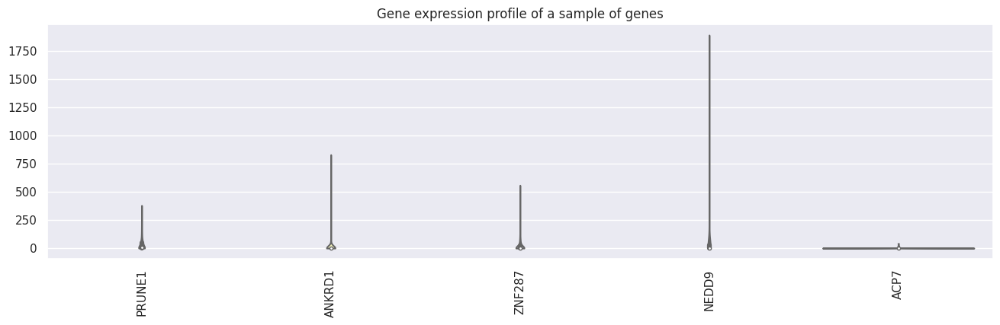

In [ ]:
# Plotting the violin plots of the gene expression for a sample of genes
plt.figure(figsize=(16,4))
plot=sns.violinplot(data=df_filtered.iloc[:, 20:25],palette="Set3",cut=0)
plt.setp(plot.get_xticklabels(), rotation=90)
plt.title('Gene expression profile of a sample of genes')
plt.show()

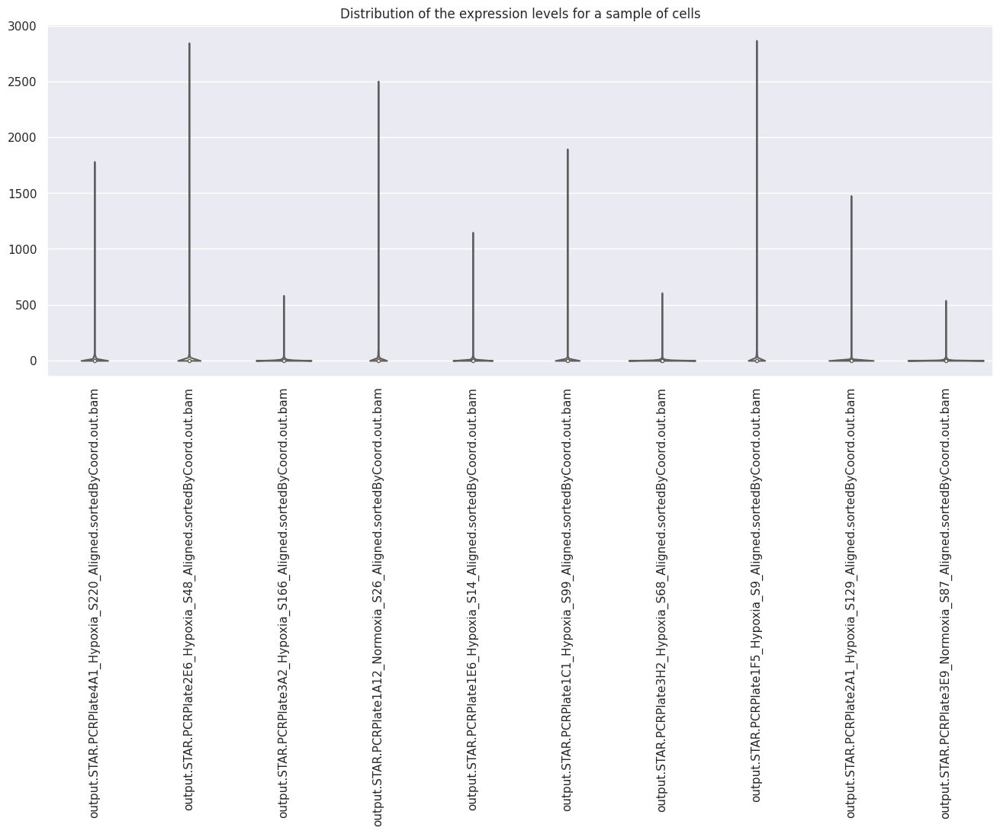

In [ ]:
# Distributions of the expression levels across cells for a sample of cells
plt.figure(figsize=(16, 6))
plot=sns.violinplot(data=df_filtered.iloc[:10,:].T, palette='Set3', cut=0)
plt.setp(plot.get_xticklabels(), rotation=90)
plt.title('Distribution of the expression levels for a sample of cells')
plt.show()

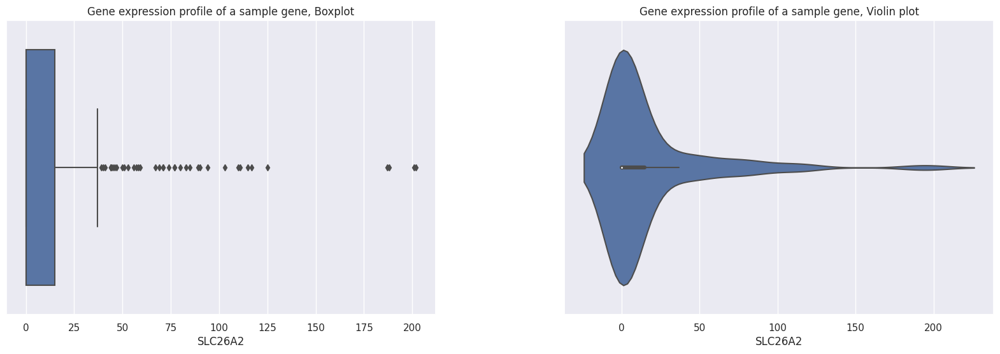

In [ ]:
fig, ax = plt.subplots( 1, 2, figsize = (20,6))
sns.set_style("white")
fig.subplots_adjust(hspace=0.3, wspace=0.3)

# Boxplot of gene expression profile of a sample gene
cnames = list(df_filtered.columns)
cnames[5]
sns.boxplot(x=df_filtered.T.loc['SLC26A2', :], ax=ax[0]).set_title('Gene expression profile of a sample gene, Boxplot')

# Violin plot of gene expression of a sample gene
sns.violinplot(x=df_filtered.T.loc['SLC26A2', :], ax=ax[1]).set_title('Gene expression profile of a sample gene, Violin plot')
plt.show()

We calculate the sparsity level of our new dataframe and represent it graphically.

In [ ]:
print("sparsity level:", (df_filtered == 0).sum().sum() / df_filtered.size)
sparsity_levels_genes = (df_filtered==0).sum() / df_filtered.shape[0]
sparsity_levels_genes

sparsity level: 0.7744791054322748


ADAMTSL5     0.549356
LINC02562    0.781116
TFCP2        0.506438
FABP6        0.699571
BCL6         0.463519
               ...   
BTBD7P1      0.871245
CNTN5        0.939914
TTN-AS1      0.793991
INHBB        0.862661
EYA4         0.729614
Length: 3979, dtype: float64

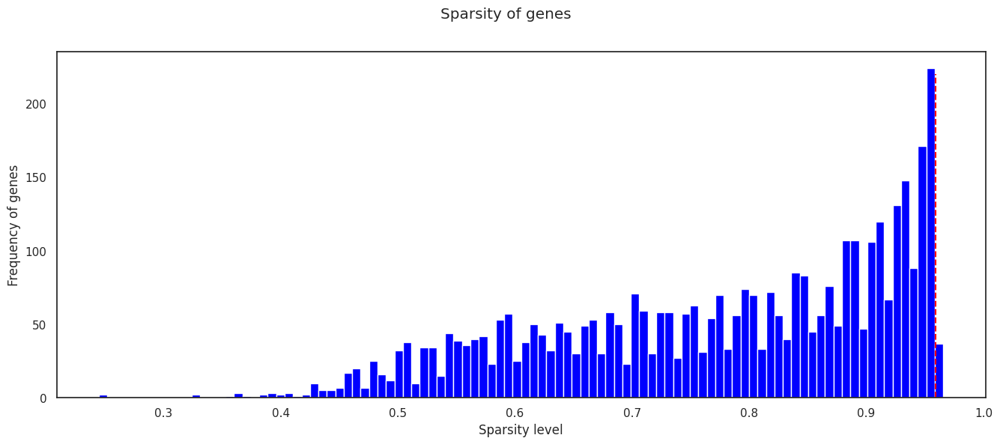

In [ ]:
fig = plt.figure(figsize=(16, 6))
sns.set_style("white")

ax1 = plt.axes()
bars = ax1.hist(sparsity_levels_genes, bins = 100, color = 'blue')

# Labels
fig.suptitle("Sparsity of genes")
ax1.set_xlabel("Sparsity level")
ax1.set_ylabel("Frequency of genes");

sparsity_threshold = 0.9588477366255144

ax1.plot([sparsity_threshold, sparsity_threshold], [0, 220], color='red', linestyle='dashed')

sns.set_theme() # resetting the style plot

One might argue that our filtering didn't work correctly, since there are some genes that appear to have a higher sparsity than our previously established threshold. However, this was to be expected: we filtered out sparse data before applying other filtering methods. During the succeeding filtering methods, we deleted non-zero entries, causing an increase in the overall ratio of null entries (sparsity).

## Normalization


After the data transformation we move on to better understanding if the data are normalized or not.
We start by looking at the overall distribution of the gene expression of the cells.

Text(0.5, 1.0, 'Distribution of gene expression of all cells')

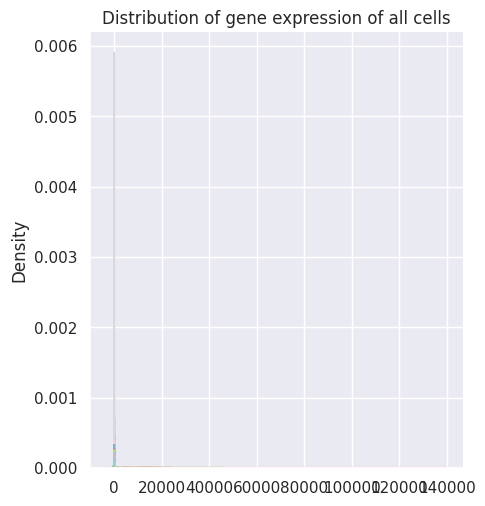

In [ ]:
sns.displot(data=df_filtered.T,palette="Set3",kind="kde", bw_adjust=2, legend=False)
plt.title('Distribution of gene expression of all cells')

Text(0.5, 1.0, 'Distribution of gene expression of all cells')

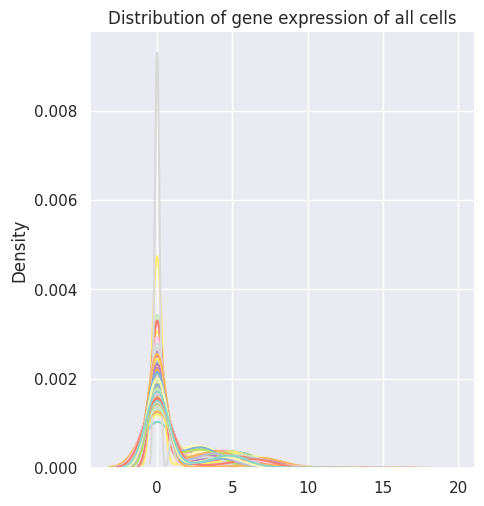

In [ ]:
sns.displot(data=(df_filtered.T+1).apply(np.log2),palette="Set3",kind="kde", bw_adjust=2, legend=False)
plt.title('Distribution of gene expression of all cells')

It's clear by looking at the graph that the data is not normalized, since the distributions of the gene expressions of the cells are very different and cover a wide range of values, but in a very uneven way across samples. This could be due to differences in the rilevation of the data or other types of outside noise, since we expect the distributions to be similar after having filtered the data.

Next we try different normalization techniques in order to solve this problem. We will combine the normalization with the log transformation, a techinque commonly used when dealing with data spanning across multiple orders of magnitude and whose usefulness will be further explained later.
We try applying the log before and after the normalization, giving respectively more importance to the main body or to the tail of the distribution, in order to find the best approach.
We could avoid this approach, but all we would see would be plots with a big spike at 0 and it wouldn't be possible to visually compare the normaliation techniques.

In [ ]:
df_filtered_log = (df_filtered+1).apply(np.log2)

MAX-MIN NORMALIZATIOM

In [ ]:
df_norm=df_filtered.T.copy()
for x in df_filtered.T.columns:
    df_norm.loc[:,x]=(df_filtered.T.loc[:,x]-df_filtered.T.loc[:,x].min())/(df_filtered.T.loc[:,x].max()-df_filtered.T.loc[:,x].min())

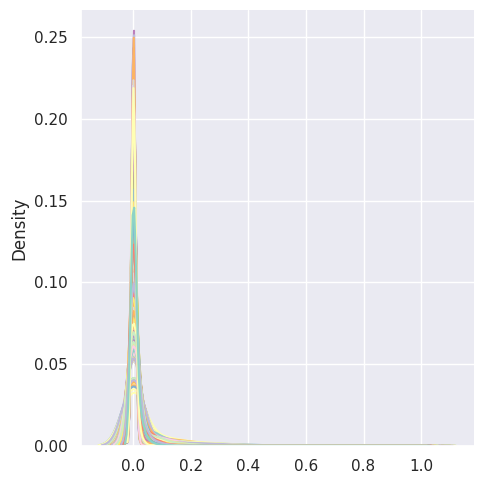

In [ ]:
sns.displot((df_norm+1).apply(np.log2),palette="Set3",kind="kde", bw_adjust=2, legend=False)

In [ ]:
df_norm_log=df_filtered_log.T.copy()
for x in df_filtered_log.T.columns:
    df_norm_log.loc[:,x]=(df_filtered_log.T.loc[:,x]-df_filtered_log.T.loc[:,x].min())/(df_filtered_log.T.loc[:,x].max()-df_filtered_log.T.loc[:,x].min())

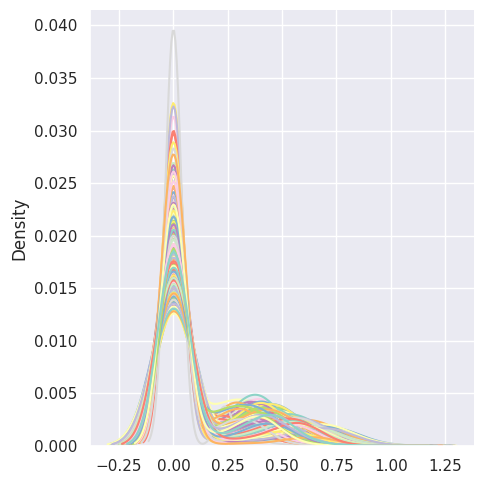

In [ ]:
sns.displot(data=(df_norm_log),palette="Set3",kind="kde", bw_adjust=2, legend=False)

STANDARDIZATION

In [ ]:
df_std=df_filtered.T.copy()
for x in df_filtered.T.columns:
    df_std.loc[:,x]=(df_filtered.T.loc[:,x]-df_filtered.T.loc[:,x].mean())/df_filtered.T.loc[:,x].std()

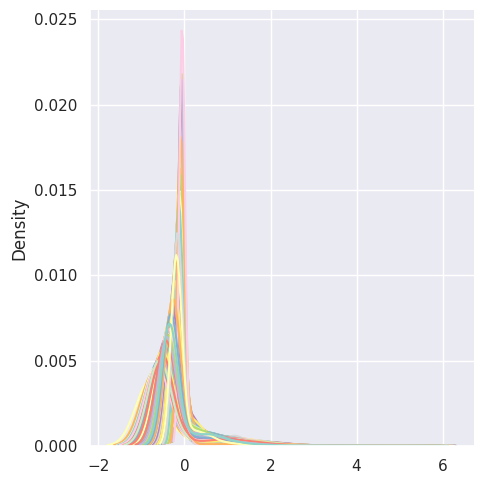

In [ ]:
sns.displot(data=(df_std+1).apply(np.log2),palette="Set3",kind="kde", bw_adjust=2, legend=False)

In [ ]:
df_std_log=df_filtered_log.T.copy()
for x in df_filtered_log.T.columns:
    df_std_log.loc[:,x]=(df_filtered_log.T.loc[:,x]-df_filtered_log.T.loc[:,x].mean())/df_filtered_log.T.loc[:,x].std()

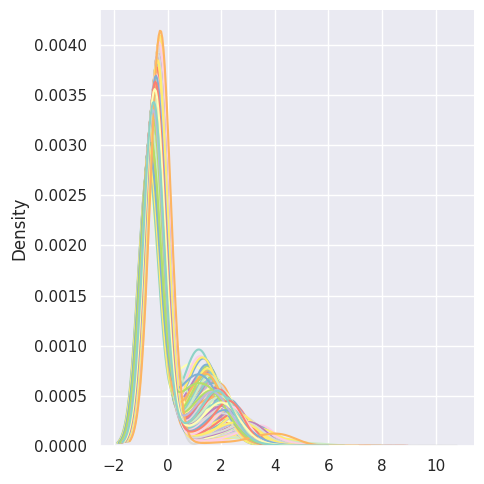

In [ ]:
sns.displot(data=(df_std_log),palette="Set3",kind="kde", bw_adjust=2, legend=False)

COUNTS PER MILLION

In [ ]:
df_cpm=df_filtered.T.copy()
for x in df_filtered.T.columns:
    df_cpm.loc[:,x] = (df_filtered.T.loc[:,x]*1e6)/(df_filtered.T.loc[:,x].sum())

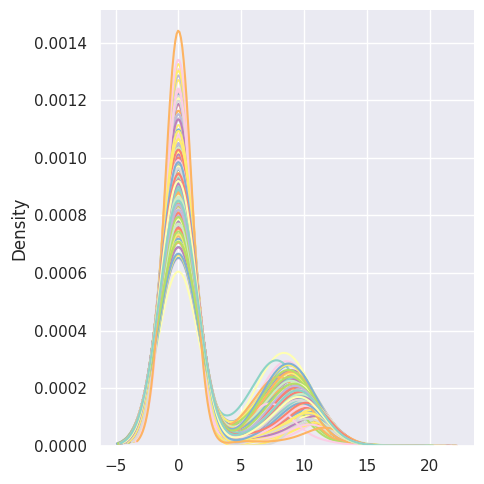

In [ ]:
sns.displot((df_cpm+1).apply(np.log2),palette="Set3",kind="kde", bw_adjust=2, legend=False)

In [ ]:
df_cpm_log=df_filtered_log.T.copy()
for x in df_filtered_log.T.columns:
    df_cpm_log.loc[:,x] = (df_filtered_log.T.loc[:,x]*1e6)/(df_filtered_log.T.loc[:,x].sum())

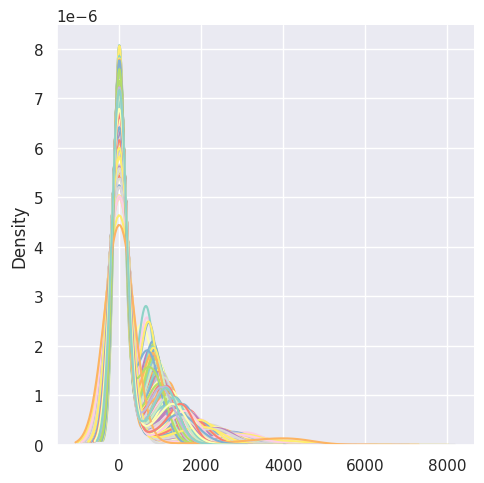

In [ ]:
sns.displot((df_cpm_log),palette="Set3",kind="kde", bw_adjust=2, legend=False)

QUANTILE NORMALIZATION

In [ ]:
def quantile_normalize(df):
    # compute rank
    dic = {}
    for col in df:
        dic.update({col : sorted(df[col])})
    sorted_df = pd.DataFrame(dic)

    # compute average rank values
    rank_mean = sorted_df.mean(axis = 1).tolist()

    # sort by original order
    rank_mean.sort()
    for col in df:
        t = np.searchsorted(np.sort(df[col]), df[col])
        df[col] = [rank_mean[i] for i in t]
    return df

df_normalized = quantile_normalize(df_filtered.T)

Text(0.5, 1.0, 'Distribution of gene expression of all cells')

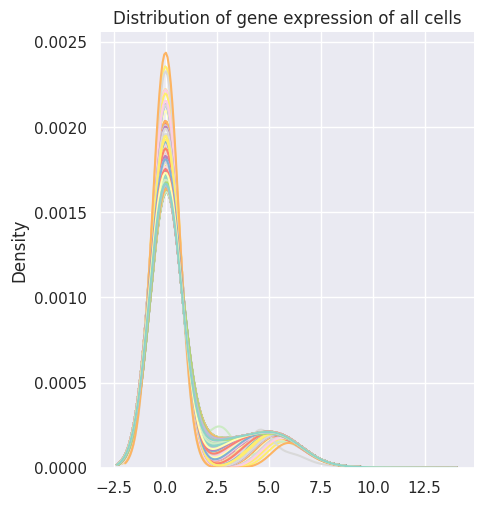

In [ ]:
sns.displot(data=(df_normalized+1).apply(np.log2),palette="Set3",kind="kde", bw_adjust=2, legend=False)
plt.title('Distribution of gene expression of all cells')

In [ ]:
df_normalized_log = quantile_normalize(df_filtered_log.T)

Text(0.5, 1.0, 'Distribution of gene expression of all cells')

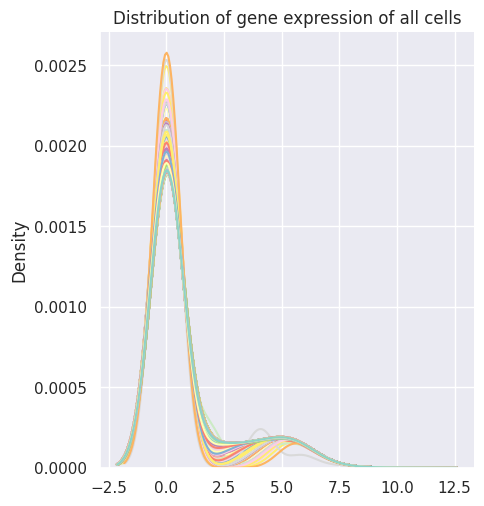

In [ ]:
sns.displot(data=(df_normalized_log),palette="Set3",kind="kde", bw_adjust=2, legend=False)
plt.title('Distribution of gene expression of all cells')

We can clearly see that the best normalization technique is the quantile normalization. It doesn't really matter if we perform the log transform before or after, since due to the nature of the normalization, results should be the same (there are small variations in our case due to the fact that we have many repeated values in the samples, but we will not further investigate this aspect).

In [ ]:
df_normalized.describe()

,output.STAR.PCRPlate4A1_Hypoxia_S220_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate2E6_Hypoxia_S48_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate3A2_Hypoxia_S166_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1A12_Normoxia_S26_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1E6_Hypoxia_S14_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1C1_Hypoxia_S99_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate3H2_Hypoxia_S68_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1F5_Hypoxia_S9_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate2A1_Hypoxia_S129_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate3E9_Normoxia_S87_Aligned.sortedByCoord.out.bam,...,output.STAR.PCRPlate4G6_Hypoxia_S232_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate3G6_Hypoxia_S181_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4C8_Normoxia_S208_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate2C11_Normoxia_S160_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate3C10_Normoxia_S187_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4B8_Normoxia_S207_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate3F3_Hypoxia_S170_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate3F6_Hypoxia_S180_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1C9_Normoxia_S22_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4C11_Normoxia_S212_Aligned.sortedByCoord.out.bam
count,3979.000000,3979.000000,3979.000000,3979.000000,3979.000000,3979.000000,3979.000000,3979.000000,3979.000000,3979.000000,...,3979.000000,3979.000000,3979.000000,3979.000000,3979.000000,3979.000000,3979.000000,3979.000000,3979.000000,3979.000000
mean,10.418318,10.305044,10.306073,10.358786,10.136556,8.199353,10.152279,10.226222,10.036470,10.180227,...,10.134569,10.470894,10.299913,10.149572,10.131347,9.933670,10.228721,10.387235,10.457987,10.043906
std,68.242538,68.231731,68.190001,68.295456,68.151803,68.225417,68.093032,68.305726,68.131772,68.158548,...,68.131017,68.204789,68.302349,67.841320,68.145646,68.222599,68.142119,68.237018,68.284822,68.012703
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.000000,0.000000,1.223176,0.000000,0.000000,0.000000,0.991416,0.000000,0.000000,0.000000,...,0.000000,1.188841,0.000000,0.000000,0.000000,0.000000,1.347639,0.000000,0.000000,1.373391
max,3340.630901,3340.630901,3340.630901,3340.630901,3340.630901,3340.630901,3340.630901,3340.630901,3340.630901,3340.630901,...,3340.630901,3340.630901,3340.630901,3340.630901,3340.630901,3340.630901,3340.630901,3340.630901,3340.630901,3340.630901


Since there is no difference between applying it before or after, we will next check the usefulness of the log tranformation on the normalized data.

##Summary statistics and log trasformation


In this part we inspect the summary statistics of the distribution of our data; in particular, we plot the distributions of the skewness and the kurtosis of both the gene expression profiles and the gene expression levels. Skewness is a commonly used measure in descriptive statistics that characterizes the asymmetry of a data distribution, while kurtosis determines the heaviness of the distribution tails.

First, we study the skewness and kurtosis at the cell level.

 Original skewness of cells  34.166890262444696
 Original kurtosis of cells  1520.1046769094016


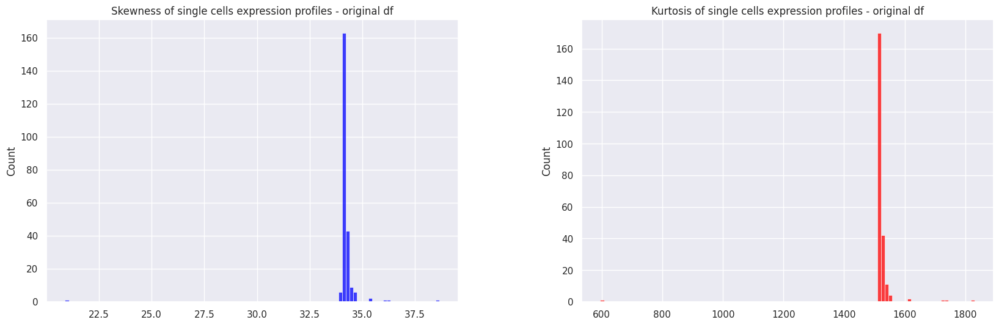

In [ ]:
from scipy.stats import kurtosis, skew
from statistics import mean

fig, ax = plt.subplots( 1, 2, figsize = (20,6))
sns.set_style("white")
fig.subplots_adjust(hspace=0.3, wspace=0.3)

# Original Skewness of cells
cnames = list(df_normalized.columns)
colN = df_normalized.shape[1]
skew_cells = []

for i in range(colN) :     
     v_df_normalized = df_normalized[cnames[i]]
     skew_cells += [skew(v_df_normalized)]   

sns.histplot(skew_cells,bins=100, ax=ax[0], color = 'blue').set_title('Skewness of single cells expression profiles - original df')
print(' Original skewness of cells ', mean(skew_cells)) #skew(skew_cells, bias=False))

# Original Kurtosis of cells
colN = df_normalized.shape[1]

kurt_cells = []
for i in range(colN) :     
     v_df_normalized = df_normalized[cnames[i]]
     kurt_cells += [kurtosis(v_df_normalized)]   
kurt_cells
sns.histplot(kurt_cells,bins=100,ax=ax[1], color = 'red').set_title('Kurtosis of single cells expression profiles - original df')
print(' Original kurtosis of cells ', mean(kurt_cells))#kurtosis(kurt_cells, bias=False))
plt.show()


Significant skewness and kurtosis clearly indicate that data are not normal; therefore, from the histograms plotted above, we can conclude that the distributions are highly non-normal and skewed with heavy tails. 

If a data set exhibits significant skewness or kurtosis we can apply some type of data transformation to try to make the data more normal. In particular, taking the log of a data set is often useful for data that has high skewness.

The logarithm with base 2 is frequently used to demonstrate that an increase of 1 signifies a double rise in the quantity of gene expression, while a decrease of 1 represents a halving of the feature abundance. As a result, modifications in feature values in either direction are balanced, resulting in gene up-regulation and down-regulation being symmetrical in relation to a control.


 Log2 skewness of cells  1.8868505577277526
 Log2 kurtosis of cells  2.3000342453148144


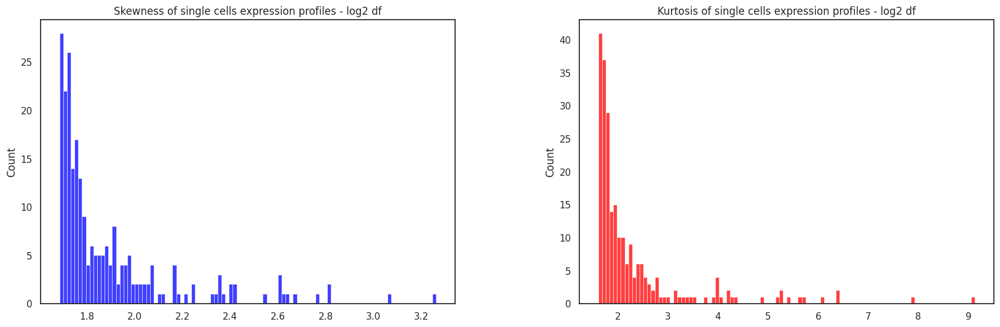

In [ ]:
# Applying the log transformation
df_log2 = df_normalized.apply(lambda x: np.log2(1+x))

fig, ax = plt.subplots( 1, 2, figsize = (20,6))
sns.set_style("white")
fig.subplots_adjust(hspace=0.3, wspace=0.3)

# Log2 Skewness of cells
colN = df_log2.shape[1]

log2_skew_cells = []
for i in range(colN) :     
     v_df_normalized = df_log2[cnames[i]]
     log2_skew_cells += [skew(v_df_normalized)]   
log2_skew_cells
sns.histplot(log2_skew_cells,bins=100,ax=ax[0], color = 'blue').set_title('Skewness of single cells expression profiles - log2 df')
print(' Log2 skewness of cells ', mean(log2_skew_cells)) #skew(log2_skew_cells, bias=False))

# Log2 Kurtosis of cells
colN = df_log2.shape[1]

log2_kurt_cells = []
for i in range(colN) :     
     v_df_normalized = df_log2[cnames[i]]
     log2_kurt_cells += [kurtosis(v_df_normalized)] 
log2_kurt_cells
sns.histplot(log2_kurt_cells,bins=100,ax=ax[1], color = 'red').set_title('Kurtosis of single cells expression profiles - log2 df')
print(' Log2 kurtosis of cells ', mean(log2_kurt_cells)) #kurtosis(log2_kurt_cells, bias=False))
plt.show()

Now we do the same for the gene expression levels.

 Original skewness of genes  5.01539710872769
 Original kurtosis of genes  35.68018005694586
 Log2 skewness of genes  2.4392047980750773
 Log2 kurtosis of genes  7.439565842328416


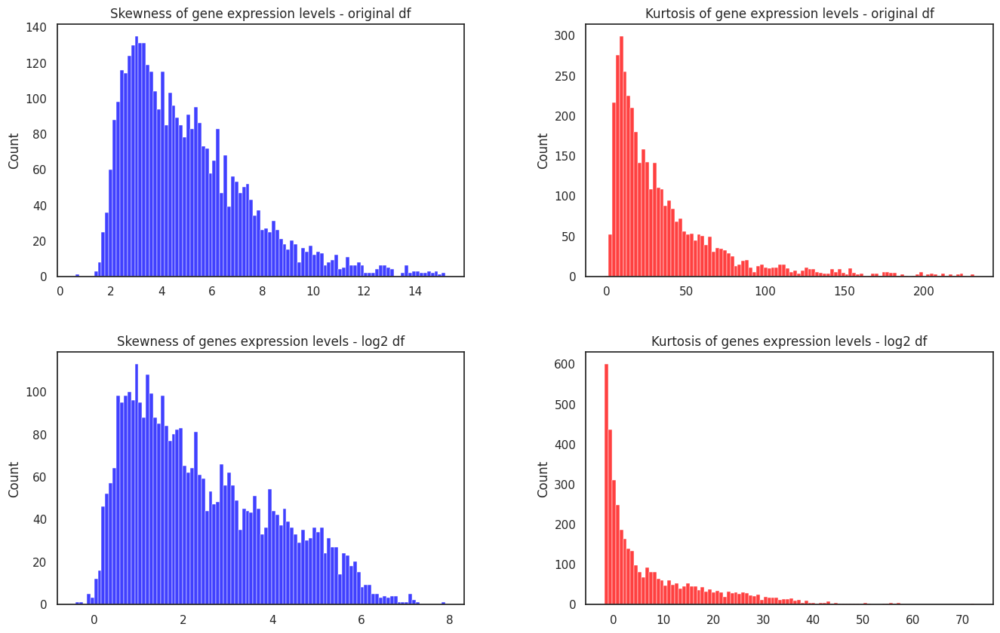

In [ ]:
df_log2 = df_normalized.apply(lambda x: np.log2(1+x))

fig, ax = plt.subplots( 2, 2, figsize = (16,10))
sns.set_style("white")
fig.subplots_adjust(hspace=0.3, wspace=0.3)

# Original Skewness of genes
rowN = df_normalized.shape[0]

skew_genes = []
for i in range(rowN) :     
     skew_genes += [df_normalized.iloc[i,:].skew()]   
skew_genes
sns.histplot(skew_genes,bins=100,ax=ax[0,0], color = 'blue').set_title('Skewness of gene expression levels - original df')
print( " Original skewness of genes ", mean(skew_genes) )

# Original Kurtosis of genes
rowN = df_normalized.shape[0]

kurt_genes = []
for i in range(rowN) :     
     kurt_genes += [df_normalized.iloc[i,:].kurtosis()]   
kurt_genes
sns.histplot(kurt_genes,bins=100,ax=ax[0,1], color = 'red').set_title('Kurtosis of gene expression levels - original df')
print( " Original kurtosis of genes ",  mean(kurt_genes) )

# Log2 Skewness of genes
rowN = df_log2.shape[0]

log2_skew_genes = []
for i in range(rowN) :     
     log2_skew_genes += [df_log2.iloc[i, :].skew()]   
log2_skew_genes
sns.histplot(log2_skew_genes,bins=100,ax=ax[1,0], color = 'blue').set_title('Skewness of genes expression levels - log2 df')
print( " Log2 skewness of genes ", mean(log2_skew_genes) )

# Log2 Kurtosis of genes
rowN = df_log2.shape[0]

log2_kurt_genes = []
for i in range(rowN) :     
     log2_kurt_genes += [df_log2.iloc[i, :].kurtosis()]   
log2_kurt_genes
sns.histplot(log2_kurt_genes,bins=100,ax=ax[1,1], color = 'red').set_title('Kurtosis of genes expression levels - log2 df')
print( " Log2 kurtosis of genes ",  mean(log2_kurt_genes) )
plt.show()


From this analysis we can make a general conclusion. After the log2 transformation, the high skewness and the heavy tails, both present in the distributions at the cell and gene level, are reduced. In fact, the skewnes and kurtosis are both closer to 0, which means that our data is now more symmetric and normalized.

Next we can plot the distributions of some genes and cells after the log2 transformation and compare them to the plots studied in the initial EDA.

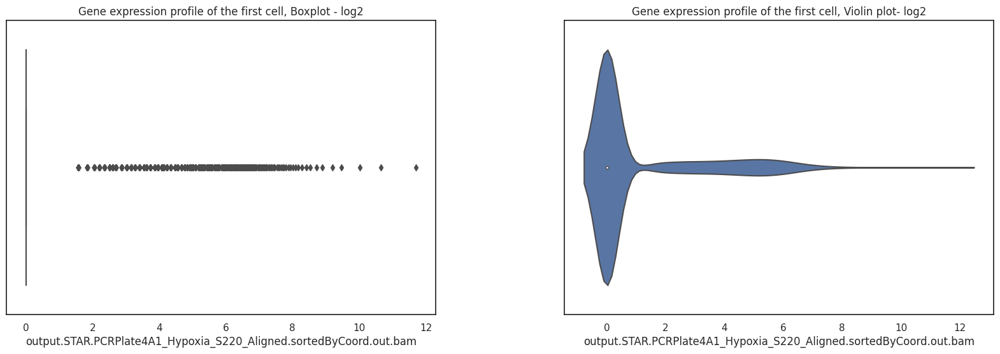

In [ ]:

fig, ax = plt.subplots( 1, 2, figsize = (20,6))
sns.set_style("white")
fig.subplots_adjust(hspace=0.3, wspace=0.3)

# Boxplot of the genes expression profiles of the first cell - log2
sns.boxplot(x=df_log2.iloc[:,0], ax=ax[0]).set_title('Gene expression profile of the first cell, Boxplot - log2')
# Violin plot of the genes expression profiles of the first cell - log2
sns.violinplot(x=df_log2.iloc[:,0], ax=ax[1]).set_title('Gene expression profile of the first cell, Violin plot- log2')
plt.show()

In [ ]:
 dfS123_log2 = df_log2.iloc[:,0]
 display(dfS123_log2.describe().round(2))

count    3979.00
mean        1.06
std         2.05
min         0.00
25%         0.00
50%         0.00
75%         0.00
max        11.71
Name: output.STAR.PCRPlate4A1_Hypoxia_S220_Aligned.sortedByCoord.out.bam, dtype: float64

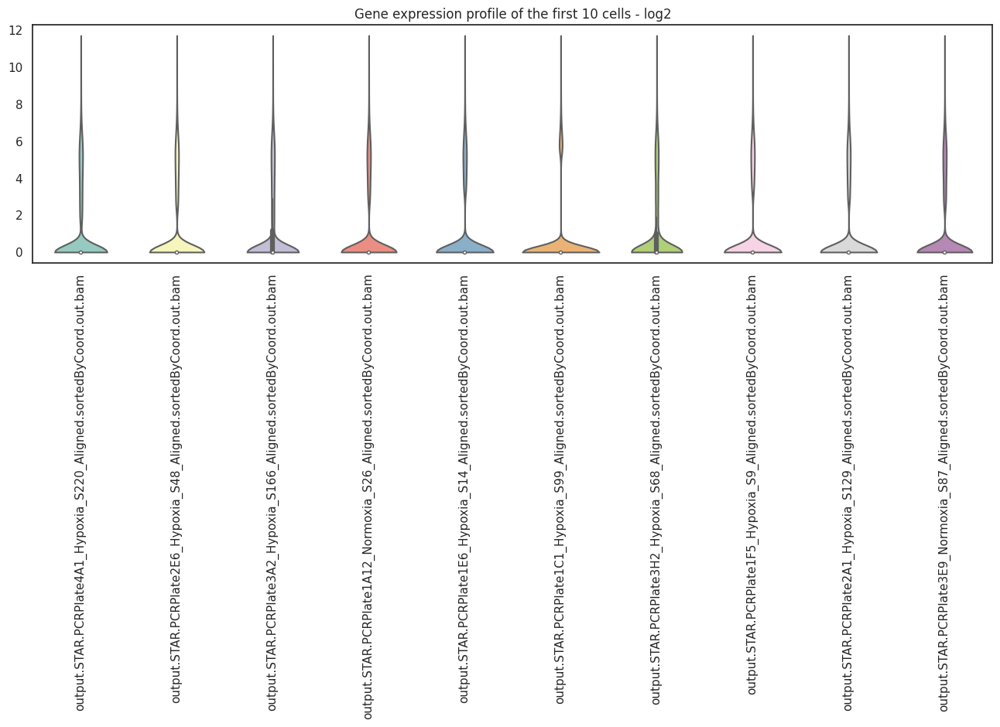

In [ ]:
# Plotting the violin plots of the gene expression for the first 10 single cells - log2
plt.figure(figsize=(16,4))
plot=sns.violinplot(data=df_log2.iloc[:, :10],palette="Set3",cut=0)
plt.setp(plot.get_xticklabels(), rotation=90)
plt.title('Gene expression profile of the first 10 cells - log2')
plt.show()

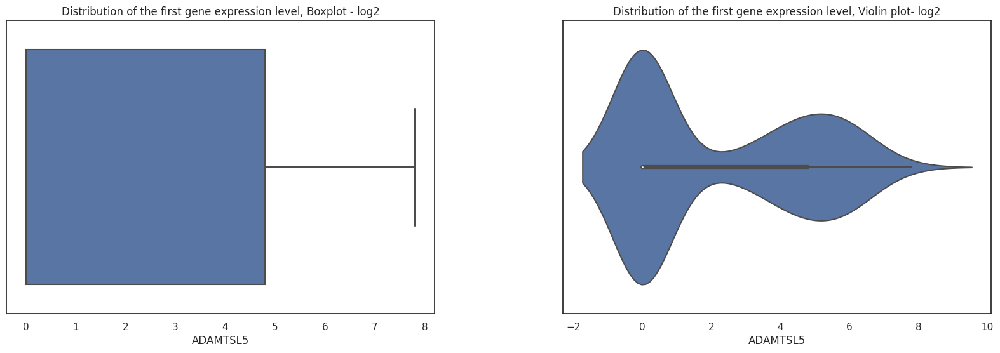

In [ ]:

fig, ax = plt.subplots( 1, 2, figsize = (20,6))
sns.set_style("white")
fig.subplots_adjust(hspace=0.3, wspace=0.3)

# Boxplot of the distribution of the first gene expression level - log2
sns.boxplot(x=df_log2.iloc[0,:], ax=ax[0]).set_title('Distribution of the first gene expression level, Boxplot - log2')

# Violin plot of the distribution of the first gene expression level - log2
sns.violinplot(x=df_log2.iloc[0, :], ax=ax[1]).set_title('Distribution of the first gene expression level, Violin plot- log2')
plt.show()

In [ ]:
 dfWASH7P_log2 = df_log2.iloc[0,:]
 display(dfWASH7P_log2.describe().round(2))

count    233.00
mean       2.17
std        2.58
min        0.00
25%        0.00
50%        0.00
75%        4.80
max        7.81
Name: ADAMTSL5, dtype: float64

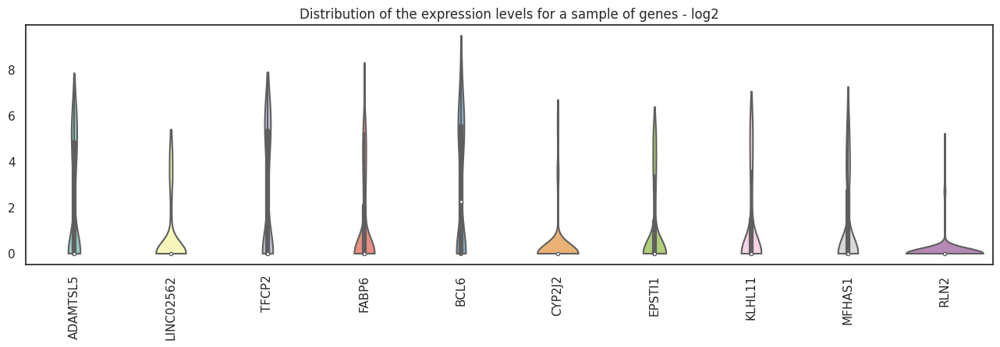

In [ ]:
# Distributions of the expression levels across cells for a sample of genes - log2

plt.figure(figsize=(16, 4))
plot=sns.violinplot(data=df_log2.iloc[:10,:].T, palette='Set3', cut=0)
plt.setp(plot.get_xticklabels(), rotation=90)
plt.title('Distribution of the expression levels for a sample of genes - log2')
plt.show()




Now we try the cube root transformation on our dataframe both at the level of cells and genes to see if we can further mitigate the high skewnees and kurtosis.

 Original skewness of cells  34.166890262444696
 Original kurtosis of cells  1520.1046769094016
 Cube skewness of cells  2.3602935650860437
 cube kurtosis of cells  7.341877551203151


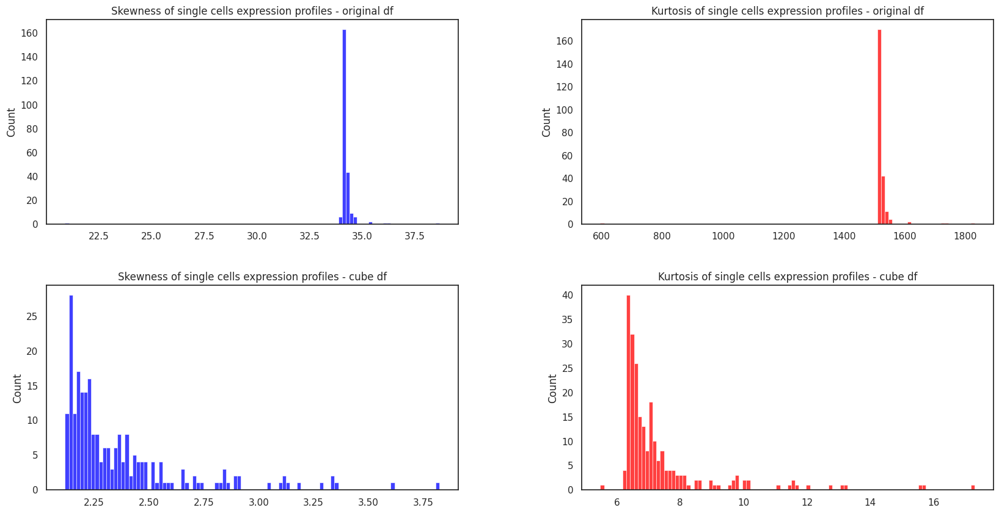

In [ ]:
from scipy.stats import kurtosis, skew

fig, ax = plt.subplots( 2, 2, figsize = (20,10))
sns.set_style("white")
fig.subplots_adjust(hspace=0.3, wspace=0.3)

# Original Skewness of cells
cnames = list(df_normalized.columns)
colN = df_normalized.shape[1]

skew_cells = []
for i in range(colN) :     
     v_df_normalized = df_normalized[cnames[i]]
     skew_cells += [skew(v_df_normalized)]   
skew_cells
sns.histplot(skew_cells,bins=100, ax=ax[0,0], color = 'blue').set_title('Skewness of single cells expression profiles - original df')
print(' Original skewness of cells ',mean(skew_cells))

# Original Kurtosis of cells
colN = df_normalized.shape[1]

kurt_cells = []
for i in range(colN) :     
     v_df_normalized = df_normalized[cnames[i]]
     kurt_cells += [kurtosis(v_df_normalized)]   
kurt_cells
sns.histplot(kurt_cells,bins=100,ax=ax[0,1], color = 'red').set_title('Kurtosis of single cells expression profiles - original df')
print(' Original kurtosis of cells ', mean(kurt_cells))


df_cbrt = df_normalized.apply(lambda x: np.cbrt(x))

# Cube Skewness of cells
colN = df_cbrt.shape[1]

cbrt_skew_cells = []
for i in range(colN) :     
     v_df_normalized = df_cbrt[cnames[i]]
     cbrt_skew_cells += [skew(v_df_normalized)]   
cbrt_skew_cells
sns.histplot(cbrt_skew_cells,bins=100,ax=ax[1,0], color = 'blue').set_title('Skewness of single cells expression profiles - cube df')
print(' Cube skewness of cells ', mean(cbrt_skew_cells))

# Cube Kurtosis of cells
colN = df_cbrt.shape[1]

cbrt_kurt_cells = []
for i in range(colN) :     
     v_df_normalized = df_cbrt[cnames[i]]
     cbrt_kurt_cells += [kurtosis(v_df_normalized)] 
cbrt_kurt_cells
sns.histplot(cbrt_kurt_cells,bins=100,ax=ax[1,1], color = 'red').set_title('Kurtosis of single cells expression profiles - cube df')
print(' cube kurtosis of cells ', mean(cbrt_kurt_cells))
plt.show()

 Original skewness of genes  5.01539710872769
 Original kurtosis of genes  35.68018005694586
 Cube skewness of genes  2.4596116989047987
 Cube kurtosis of genes  7.549626627651022


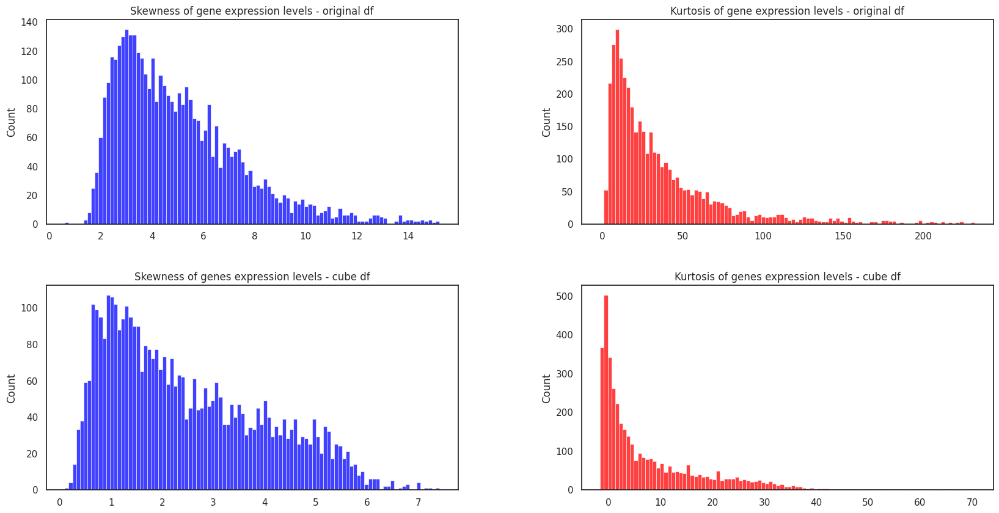

In [ ]:
df_cbrt = df_normalized.apply(lambda x: np.cbrt(x))

fig, ax = plt.subplots( 2, 2, figsize = (20,10))
sns.set_style("white")
fig.subplots_adjust(hspace=0.3, wspace=0.3)

# Original Skewness of genes
rowN = df_normalized.shape[0]

skew_genes = []
for i in range(rowN) :     
     skew_genes += [df_normalized.iloc[i,:].skew()]   
skew_genes
sns.histplot(skew_genes,bins=100,ax=ax[0,0], color = 'blue').set_title('Skewness of gene expression levels - original df')
print( " Original skewness of genes ", mean(skew_genes) )

# Original Kurtosis of genes
rowN = df_normalized.shape[0]

kurt_genes = []
for i in range(rowN) :     
     kurt_genes += [df_normalized.iloc[i,:].kurtosis()]   
kurt_genes
sns.histplot(kurt_genes,bins=100,ax=ax[0,1], color = 'red').set_title('Kurtosis of gene expression levels - original df')
print( " Original kurtosis of genes ",  mean(kurt_genes) )

# Cube Skewness of genes
rowN = df_cbrt.shape[0]

cbrt_skew_genes = []
for i in range(rowN) :     
     cbrt_skew_genes += [df_cbrt.iloc[i, :].skew()]   
cbrt_skew_genes
sns.histplot(cbrt_skew_genes,bins=100,ax=ax[1,0], color = 'blue').set_title('Skewness of genes expression levels - cube df')
print( " Cube skewness of genes ", mean(cbrt_skew_genes) )

# Cube Kurtosis of genes
rowN = df_cbrt.shape[0]

cbrt_kurt_genes = []
for i in range(rowN) :     
     cbrt_kurt_genes += [df_cbrt.iloc[i, :].kurtosis()]   
cbrt_kurt_genes
sns.histplot(cbrt_kurt_genes,bins=100,ax=ax[1,1], color = 'red').set_title('Kurtosis of genes expression levels - cube df')
print( " Cube kurtosis of genes ",  mean(cbrt_kurt_genes) )
plt.show()

We can deduce that, compared to the log-transformation, the cube-trasformation did a worse job at decreasing kurtosis and skewness both at the sample and feature level. 

We therefore keep the dataframe with the log transformation applied.

In [ ]:
df_log2

,output.STAR.PCRPlate4A1_Hypoxia_S220_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate2E6_Hypoxia_S48_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate3A2_Hypoxia_S166_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1A12_Normoxia_S26_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1E6_Hypoxia_S14_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1C1_Hypoxia_S99_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate3H2_Hypoxia_S68_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1F5_Hypoxia_S9_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate2A1_Hypoxia_S129_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate3E9_Normoxia_S87_Aligned.sortedByCoord.out.bam,...,output.STAR.PCRPlate4G6_Hypoxia_S232_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate3G6_Hypoxia_S181_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4C8_Normoxia_S208_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate2C11_Normoxia_S160_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate3C10_Normoxia_S187_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4B8_Normoxia_S207_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate3F3_Hypoxia_S170_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate3F6_Hypoxia_S180_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1C9_Normoxia_S22_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4C11_Normoxia_S212_Aligned.sortedByCoord.out.bam
ADAMTSL5,0.000000,2.895702,0.000000,0.000000,0.000000,0.0,0.448697,0.000000,0.000000,4.696863,...,0.00000,4.311987,5.861287,5.170441,6.045426,0.000000,5.588055,0.000000,0.000000,6.765341
LINC02562,0.000000,0.000000,0.000000,4.256376,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,...,0.00000,0.000000,0.000000,0.000000,0.000000,5.000193,0.000000,0.000000,0.000000,0.000000
TFCP2,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,4.113809,0.000000,0.000000,5.792239,...,0.00000,0.000000,0.000000,0.000000,5.053745,0.000000,3.177473,4.609266,5.822096,1.246950
FABP6,2.708514,0.000000,0.000000,5.273445,0.000000,0.0,0.000000,0.000000,0.000000,5.431009,...,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,1.231211,4.294108,0.000000,0.000000
BCL6,5.251995,4.618370,6.433876,0.000000,0.000000,0.0,5.152970,9.458323,7.502751,4.696863,...,4.01578,5.609900,5.642617,0.000000,0.000000,4.197860,4.774928,2.714187,6.011851,6.228241
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
BTBD7P1,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.141438,0.000000,0.000000,0.000000,...,0.00000,2.784171,0.000000,4.561292,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
CNTN5,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,1.862032,0.000000,0.000000,3.125208,...,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
TTN-AS1,3.279835,0.000000,0.000000,0.000000,4.269277,0.0,0.000000,0.000000,0.000000,0.000000,...,0.00000,0.000000,0.000000,4.735494,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
INHBB,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,...,0.00000,0.000000,0.000000,2.374219,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


In [ ]:
df_log2.describe()

,output.STAR.PCRPlate4A1_Hypoxia_S220_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate2E6_Hypoxia_S48_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate3A2_Hypoxia_S166_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1A12_Normoxia_S26_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1E6_Hypoxia_S14_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1C1_Hypoxia_S99_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate3H2_Hypoxia_S68_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1F5_Hypoxia_S9_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate2A1_Hypoxia_S129_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate3E9_Normoxia_S87_Aligned.sortedByCoord.out.bam,...,output.STAR.PCRPlate4G6_Hypoxia_S232_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate3G6_Hypoxia_S181_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4C8_Normoxia_S208_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate2C11_Normoxia_S160_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate3C10_Normoxia_S187_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4B8_Normoxia_S207_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate3F3_Hypoxia_S170_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate3F6_Hypoxia_S180_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1C9_Normoxia_S22_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4C11_Normoxia_S212_Aligned.sortedByCoord.out.bam
count,3979.000000,3979.000000,3979.000000,3979.000000,3979.000000,3979.000000,3979.000000,3979.000000,3979.000000,3979.000000,...,3979.000000,3979.000000,3979.000000,3979.000000,3979.000000,3979.000000,3979.000000,3979.000000,3979.000000,3979.000000
mean,1.060703,1.001599,1.069847,0.977942,0.921090,0.491512,1.071071,0.919507,0.944419,0.986535,...,0.991454,1.085989,0.951324,0.992561,0.938004,0.862086,1.078824,1.041892,1.030966,1.041095
std,2.045765,2.045072,2.026961,2.051205,2.031099,1.697354,1.998424,2.036853,2.021673,2.035148,...,2.029024,2.044734,2.045666,2.034852,2.031667,2.004700,2.003645,2.046823,2.056855,2.002832
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.000000,0.000000,1.152622,0.000000,0.000000,0.000000,0.993795,0.000000,0.000000,0.000000,...,0.000000,1.130167,0.000000,0.000000,0.000000,0.000000,1.231211,0.000000,0.000000,1.246950
max,11.706337,11.706337,11.706337,11.706337,11.706337,11.706337,11.706337,11.706337,11.706337,11.706337,...,11.706337,11.706337,11.706337,11.706337,11.706337,11.706337,11.706337,11.706337,11.706337,11.706337


## Correlation with our data

In [ ]:
df=df_log2.copy()

In [ ]:
df.shape

(3979, 233)

In [ ]:
## separation of hypoxic and normoxic cells

condition_hypo = np.array(['Hypoxia' in cell for cell in df.columns])
condition_normo = np.array(['Normoxia' in cell for cell in df.columns])
df_hypo = df[df.columns[condition_hypo]]
df_normo = df[df.columns[condition_normo]]
display(df_hypo, df_normo)

,output.STAR.PCRPlate4A1_Hypoxia_S220_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate2E6_Hypoxia_S48_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate3A2_Hypoxia_S166_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1E6_Hypoxia_S14_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1C1_Hypoxia_S99_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate3H2_Hypoxia_S68_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1F5_Hypoxia_S9_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate2A1_Hypoxia_S129_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate2B1_Hypoxia_S130_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate2H3_Hypoxia_S137_Aligned.sortedByCoord.out.bam,...,output.STAR.PCRPlate4B3_Hypoxia_S225_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate3B5_Hypoxia_S76_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4E2_Hypoxia_S196_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1C6_Hypoxia_S13_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4B6_Hypoxia_S230_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4F2_Hypoxia_S197_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4G6_Hypoxia_S232_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate3G6_Hypoxia_S181_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate3F3_Hypoxia_S170_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate3F6_Hypoxia_S180_Aligned.sortedByCoord.out.bam
ADAMTSL5,0.000000,2.895702,0.000000,0.000000,0.0,0.448697,0.000000,0.000000,0.000000,0.000000,...,0.000000,4.343133,0.000000,0.000000,1.574606,5.802704,0.00000,4.311987,5.588055,0.000000
LINC02562,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,...,1.313233,3.348310,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000
TFCP2,0.000000,0.000000,0.000000,0.000000,0.0,4.113809,0.000000,0.000000,0.000000,5.097987,...,0.000000,0.000000,6.129371,0.000000,0.000000,0.000000,0.00000,0.000000,3.177473,4.609266
FABP6,2.708514,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,4.438453,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,1.231211,4.294108
BCL6,5.251995,4.618370,6.433876,0.000000,0.0,5.152970,9.458323,7.502751,4.294108,8.080755,...,4.054304,0.000000,3.902343,0.000000,0.000000,7.338741,4.01578,5.609900,4.774928,2.714187
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
BTBD7P1,0.000000,0.000000,0.000000,0.000000,0.0,0.141438,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,3.642617,0.00000,2.784171,0.000000,0.000000
CNTN5,0.000000,0.000000,0.000000,0.000000,0.0,1.862032,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000
TTN-AS1,3.279835,0.000000,0.000000,4.269277,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,...,5.273445,0.000000,4.951797,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000
INHBB,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000


,output.STAR.PCRPlate1A12_Normoxia_S26_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate3E9_Normoxia_S87_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate3G9_Normoxia_S185_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4A7_Normoxia_S201_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1B12_Normoxia_S27_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate3G10_Normoxia_S191_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4A8_Normoxia_S206_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate2C10_Normoxia_S154_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1H9_Normoxia_S122_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1D9_Normoxia_S23_Aligned.sortedByCoord.out.bam,...,output.STAR.PCRPlate1E12_Normoxia_S30_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate2C12_Normoxia_S59_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1C11_Normoxia_S128_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1G11_Normoxia_S25_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4C8_Normoxia_S208_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate2C11_Normoxia_S160_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate3C10_Normoxia_S187_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4B8_Normoxia_S207_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1C9_Normoxia_S22_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4C11_Normoxia_S212_Aligned.sortedByCoord.out.bam
ADAMTSL5,0.000000,4.696863,5.039507,0.000000,0.000000,3.469528,6.705788,5.832238,6.007238,0.000000,...,0.000000,0.0,5.852205,0.000000,5.861287,5.170441,6.045426,0.000000,0.000000,6.765341
LINC02562,4.256376,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.930230,0.000000,0.000000,...,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,5.000193,0.000000,0.000000
TFCP2,0.000000,5.792239,5.092190,0.000000,0.000000,4.946988,6.705788,4.696863,4.034037,6.652868,...,1.048703,0.0,5.743953,5.614710,0.000000,0.000000,5.053745,0.000000,5.822096,1.246950
FABP6,5.273445,5.431009,0.000000,0.000000,0.000000,2.914712,4.613825,0.930230,0.000000,0.000000,...,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
BCL6,0.000000,4.696863,0.000000,4.237461,5.655941,4.804256,0.000000,0.000000,0.000000,0.000000,...,5.896222,0.0,5.743953,0.000000,5.642617,0.000000,0.000000,4.197860,6.011851,6.228241
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
BTBD7P1,0.000000,0.000000,0.000000,0.000000,3.819686,3.156794,0.000000,0.000000,0.000000,4.522754,...,0.000000,0.0,0.000000,0.000000,0.000000,4.561292,0.000000,0.000000,0.000000,0.000000
CNTN5,0.000000,3.125208,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.100155,0.000000,...,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
TTN-AS1,0.000000,0.000000,0.000000,0.000000,4.142841,5.061368,0.549442,0.000000,0.000000,0.000000,...,0.000000,0.0,0.000000,0.000000,0.000000,4.735494,0.000000,0.000000,0.000000,0.000000
INHBB,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,1.781472,0.0,0.000000,0.000000,0.000000,2.374219,0.000000,0.000000,0.000000,0.000000


Text(219.44444444444446, 0.5, 'Cells')

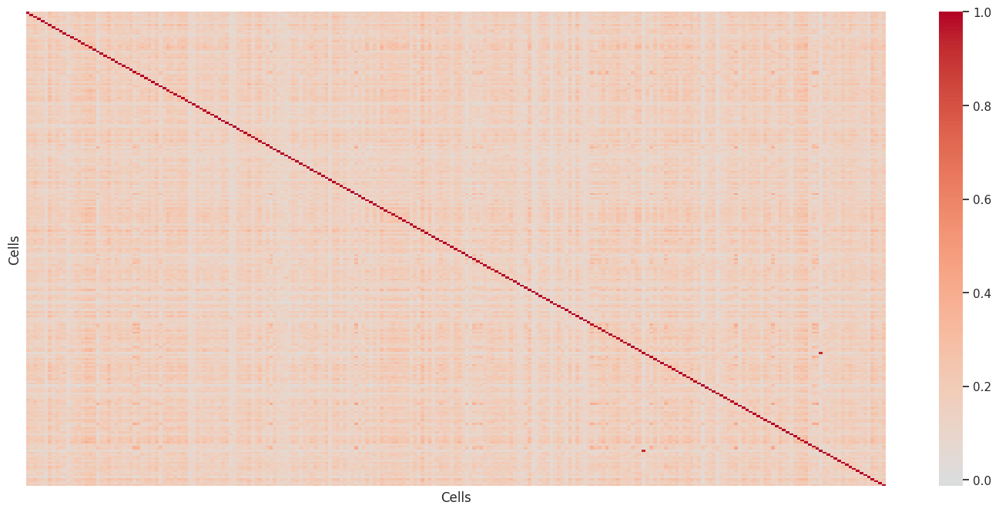

In [ ]:
## general correlation

plt.figure(figsize=(18,8))
c = df.corr()
sns.heatmap(c,cmap='coolwarm', center=0, xticklabels=False, yticklabels=False)
plt.xlabel("Cells")
plt.ylabel("Cells")

Text(1089.8989898989896, 0.5, 'Normo cells')

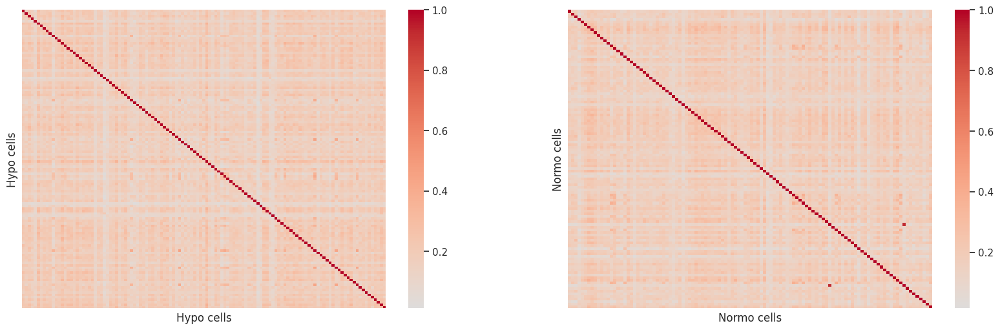

In [ ]:
## correlation normoxic-normoxic and hypoxic-hypoxic

fig, ax = plt.subplots(1, 2, figsize = (20,6))
c1= df_hypo.corr()
c2= df_normo.corr()

sns.heatmap(c1,cmap='coolwarm', center=0, ax = ax[0], xticklabels=False, yticklabels=False)
sns.heatmap(c2,cmap='coolwarm', center=0, ax = ax[1], xticklabels=False, yticklabels=False)
ax[0].set_xlabel("Hypo cells")
ax[0].set_ylabel("Hypo cells")
ax[1].set_xlabel("Normo cells")
ax[1].set_ylabel("Normo cells")

In [ ]:
## correlation whihch includes also hypoxic-normoxic 
## firstly I group the correlations computed previously based on the condition

corr_hypo = pd.DataFrame(c.columns[['Hypoxia' in cell for cell in df.columns]])
corr_normo = pd.DataFrame(c.columns[['Normoxia' in cell for cell in df.columns]])
grouped_corr = c.loc[pd.concat([corr_hypo, corr_normo])[0], pd.concat([corr_hypo, corr_normo])[0]]
grouped_corr

,output.STAR.PCRPlate4A1_Hypoxia_S220_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate2E6_Hypoxia_S48_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate3A2_Hypoxia_S166_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1E6_Hypoxia_S14_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1C1_Hypoxia_S99_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate3H2_Hypoxia_S68_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1F5_Hypoxia_S9_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate2A1_Hypoxia_S129_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate2B1_Hypoxia_S130_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate2H3_Hypoxia_S137_Aligned.sortedByCoord.out.bam,...,output.STAR.PCRPlate1E12_Normoxia_S30_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate2C12_Normoxia_S59_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1C11_Normoxia_S128_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1G11_Normoxia_S25_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4C8_Normoxia_S208_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate2C11_Normoxia_S160_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate3C10_Normoxia_S187_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4B8_Normoxia_S207_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1C9_Normoxia_S22_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4C11_Normoxia_S212_Aligned.sortedByCoord.out.bam
output.STAR.PCRPlate4A1_Hypoxia_S220_Aligned.sortedByCoord.out.bam,1.000000,0.153795,0.203763,0.173415,0.079338,0.282194,0.186458,0.193251,0.215270,0.191664,...,0.142629,0.077638,0.139559,0.131964,0.144428,0.129033,0.185747,0.099763,0.177028,0.208921
output.STAR.PCRPlate2E6_Hypoxia_S48_Aligned.sortedByCoord.out.bam,0.153795,1.000000,0.231092,0.144414,0.139734,0.238105,0.187333,0.192089,0.218928,0.246631,...,0.071049,0.083901,0.142778,0.132207,0.133266,0.124002,0.171884,0.075592,0.138658,0.167005
output.STAR.PCRPlate3A2_Hypoxia_S166_Aligned.sortedByCoord.out.bam,0.203763,0.231092,1.000000,0.241234,0.091623,0.252461,0.233483,0.247618,0.203084,0.253251,...,0.143635,0.047642,0.119628,0.180948,0.142829,0.125336,0.136368,0.086386,0.117736,0.212982
output.STAR.PCRPlate1E6_Hypoxia_S14_Aligned.sortedByCoord.out.bam,0.173415,0.144414,0.241234,1.000000,0.099151,0.212400,0.148110,0.233861,0.161274,0.201502,...,0.149475,0.045776,0.113516,0.129375,0.108546,0.155704,0.153762,0.050215,0.106337,0.132847
output.STAR.PCRPlate1C1_Hypoxia_S99_Aligned.sortedByCoord.out.bam,0.079338,0.139734,0.091623,0.099151,1.000000,0.135103,0.128629,0.129519,0.088507,0.151644,...,0.053404,0.066027,0.052934,0.092059,0.094482,0.047176,0.063297,0.032699,0.096351,0.116799
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
output.STAR.PCRPlate2C11_Normoxia_S160_Aligned.sortedByCoord.out.bam,0.129033,0.124002,0.125336,0.155704,0.047176,0.182759,0.118687,0.157283,0.157401,0.186242,...,0.133208,0.123208,0.182833,0.116820,0.117594,1.000000,0.132926,0.136747,0.149054,0.176155
output.STAR.PCRPlate3C10_Normoxia_S187_Aligned.sortedByCoord.out.bam,0.185747,0.171884,0.136368,0.153762,0.063297,0.209622,0.126602,0.164907,0.204088,0.152424,...,0.112820,0.141848,0.156355,0.156850,0.147393,0.132926,1.000000,0.126748,0.180705,0.194294
output.STAR.PCRPlate4B8_Normoxia_S207_Aligned.sortedByCoord.out.bam,0.099763,0.075592,0.086386,0.050215,0.032699,0.150538,0.071824,0.144818,0.097328,0.108702,...,0.103794,0.107363,0.160969,0.083562,0.137092,0.136747,0.126748,1.000000,0.111591,0.121375
output.STAR.PCRPlate1C9_Normoxia_S22_Aligned.sortedByCoord.out.bam,0.177028,0.138658,0.117736,0.106337,0.096351,0.176277,0.106601,0.158443,0.120298,0.174118,...,0.088995,0.090564,0.157793,0.142607,0.178812,0.149054,0.180705,0.111591,1.000000,0.174981


Text(0.5, 1.0, 'Correlation Matrix')

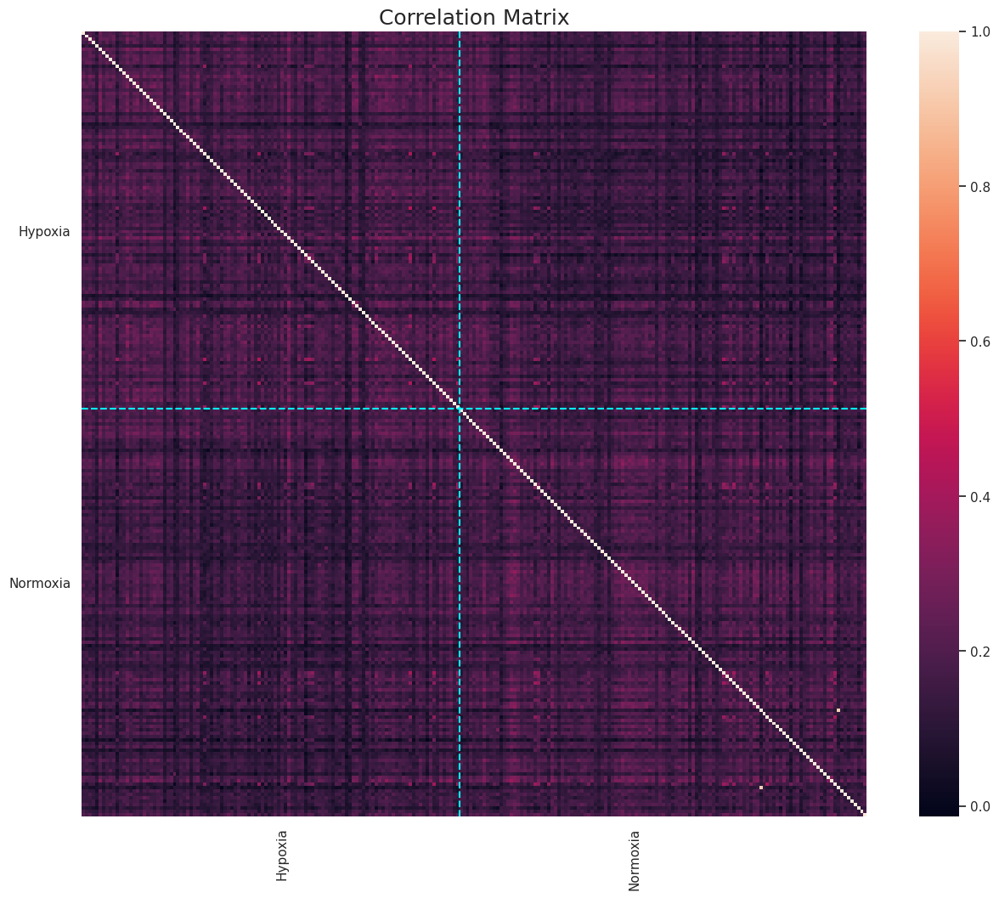

In [ ]:
## correlation matrix

f, ax = plt.subplots(figsize=(16, 12))
sns.heatmap(grouped_corr, vmax=1,
            cbar=True, square=True, fmt='.2f', annot_kws={'size': 10})
plt.yticks([59.5, 164], ["Hypoxia", "Normoxia"])
plt.plot([0,df.shape[1]], [df_normo.shape[1],df_normo.shape[1]], color='cyan', 
              linestyle='dashed')
plt.plot([df_normo.shape[1],df_normo.shape[1]], [0,df.shape[1]], color='cyan', 
              linestyle='dashed')
plt.xticks([59.5, 164], ["Hypoxia", "Normoxia"])
plt.title("Correlation Matrix", fontsize=18)

<Axes: >

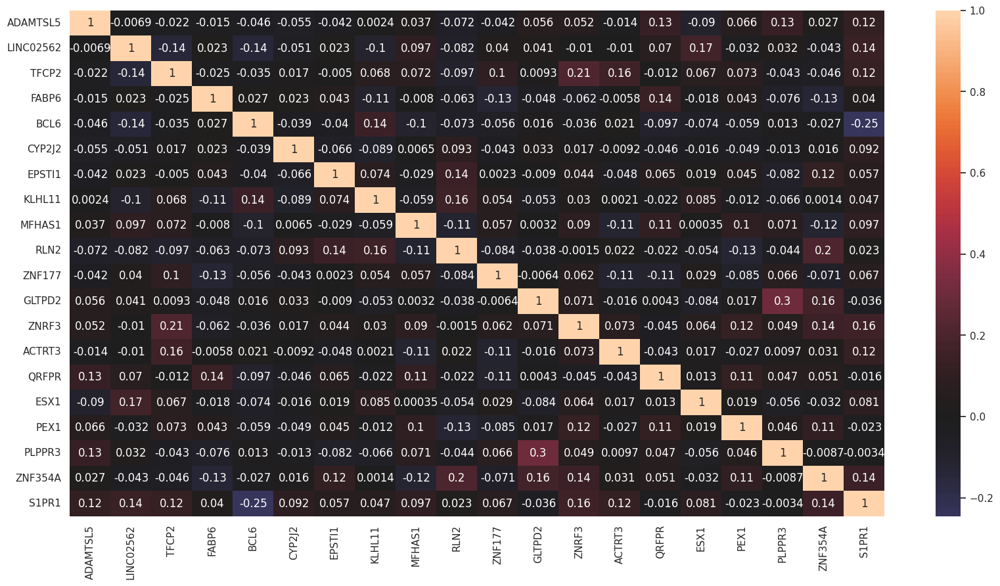

In [ ]:
## correlation between some of the genes plotted

plt.figure(figsize=(20,10))
c = df.transpose().iloc[:,:20].corr()
#midpoint = (c.values.max() - c.values.min()) /2 + c.values.min()
#sns.heatmap(c,cmap='coolwarm',annot=True, center=midpoint )
sns.heatmap(c, center=0, annot=True)

In [ ]:
## trying to define an analytic correlation based on the prevalence of some genes in normoxic or hypoxic cells

hypo_sum = np.zeros(len(df.transpose().columns))
normo_sum = np.zeros(len(df.transpose().columns))
for i in range(len(df.transpose().columns)):
    hypo_sum[i] = df_hypo.loc[df_hypo.transpose().columns[i]].sum()*121/233
    normo_sum[i] = df_normo.loc[df_normo.transpose().columns[i]].sum()*112/233
ratio_hypo = hypo_sum/(hypo_sum+normo_sum)
ratio_normo = normo_sum/(hypo_sum+normo_sum)
df_corr = pd.DataFrame({"Ratio_hypo":ratio_hypo, "Ratio_normo":ratio_normo}, index=df.transpose().columns)
df_corr

,Ratio_hypo,Ratio_normo
ADAMTSL5,0.514764,0.485236
LINC02562,0.483618,0.516382
TFCP2,0.434882,0.565118
FABP6,0.489395,0.510605
BCL6,0.589002,0.410998
...,...,...
BTBD7P1,0.348333,0.651667
CNTN5,0.187464,0.812536
TTN-AS1,0.546364,0.453636
INHBB,0.624101,0.375899


<Axes: >

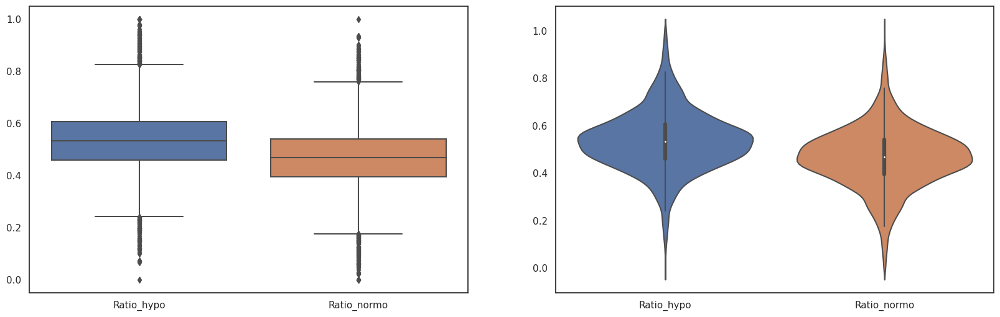

In [ ]:
## idk if this is useful, era carino

fig,ax = plt.subplots(1, 2, figsize = (20,6))
sns.boxplot(df_corr, ax=ax[0])
sns.violinplot(df_corr, ax=ax[1])

In [ ]:
## 50 most correlated genes to hypoxic or normoxic condition based on the last-computed metric

genes_hypo = df_corr.sort_values(by='Ratio_normo').iloc[:50,:]
genes_normo = df_corr.sort_values(by='Ratio_hypo').iloc[:50,:]
display(genes_normo,genes_hypo)

,Ratio_hypo,Ratio_normo
AKNAD1,0.000000,1.000000
ENO1P4,0.065382,0.934618
KIT,0.071068,0.928932
NFKBID,0.073305,0.926695
NR0B1,0.098219,0.901781
SLC25A27,0.102976,0.897024
THOC1-DT,0.111450,0.888550
NPFFR2,0.114637,0.885363
TMEM30A-DT,0.116076,0.883924
KRT81,0.121498,0.878502


,Ratio_hypo,Ratio_normo
FAM238C,1.000000,0.000000
CCN4,1.000000,0.000000
PPFIA4,1.000000,0.000000
LINC00898,1.000000,0.000000
PTPRN,1.000000,0.000000
NYNRIN,0.980381,0.019619
HIF1A-AS3,0.976850,0.023150
UBXN10,0.975317,0.024683
FRMPD2,0.972096,0.027904
ZNF608,0.961713,0.038287


Text(0, 0.5, 'Gene expression')

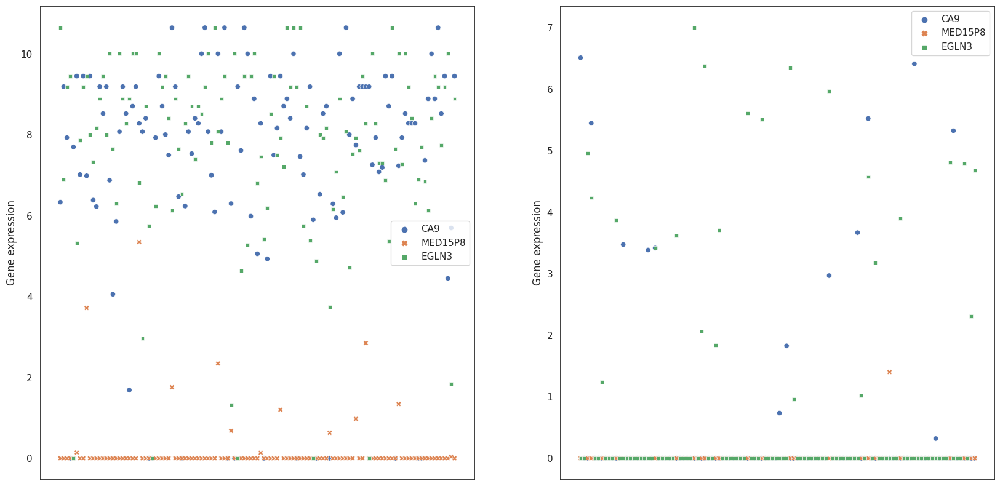

In [ ]:
## choosing one of these genes which show a strong "imbalance" and comparing the behaviour in normoxic and hypoxic cells, we can see, indeed, the difference in its expression

fig,ax = plt.subplots(1, 2, figsize = (20,10))
sns.scatterplot(df_hypo.T[['CA9','MED15P8','EGLN3']], ax=ax[0]).set(xticklabels=[])
sns.scatterplot(df_normo.T[['CA9','MED15P8','EGLN3']], ax=ax[1]).set(xticklabels=[])
ax[0].set_ylabel('Gene expression')
ax[1].set_ylabel('Gene expression')

In [ ]:
## actually computing the correlation with 'condition' as a categorical variable

cond = pd.DataFrame(['Hypoxia' in cell for cell in df.columns])
cond.index = df.columns
cond.columns = ['Hypo_condition']
data_cond = pd.concat([df.transpose(), cond], axis = 1)
corr_genes = data_cond.corr()

In [ ]:
## ordering values, in order to see the ones that are more correlated with Hypoxia

most_correlated = pd.Series.sort_values((corr_genes["Hypo_condition"]), ascending=False)
most_correlated

Hypo_condition    1.000000
NDRG1             0.861012
EGLN3             0.847325
ANGPTL4           0.837277
CA9               0.827808
                    ...   
SLC25A25         -0.350519
PLA2G4A          -0.350567
GK               -0.353259
SACS             -0.360415
NAV3             -0.368961
Name: Hypo_condition, Length: 3980, dtype: float64

In [ ]:
df_grouped = pd.concat([df_hypo, df_normo], axis = 1)
df_grouped_corr = df_grouped.loc[most_correlated[1:15].index]
df_grouped_corr

,output.STAR.PCRPlate4A1_Hypoxia_S220_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate2E6_Hypoxia_S48_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate3A2_Hypoxia_S166_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1E6_Hypoxia_S14_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1C1_Hypoxia_S99_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate3H2_Hypoxia_S68_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1F5_Hypoxia_S9_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate2A1_Hypoxia_S129_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate2B1_Hypoxia_S130_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate2H3_Hypoxia_S137_Aligned.sortedByCoord.out.bam,...,output.STAR.PCRPlate1E12_Normoxia_S30_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate2C12_Normoxia_S59_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1C11_Normoxia_S128_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1G11_Normoxia_S25_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4C8_Normoxia_S208_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate2C11_Normoxia_S160_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate3C10_Normoxia_S187_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4B8_Normoxia_S207_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1C9_Normoxia_S22_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4C11_Normoxia_S212_Aligned.sortedByCoord.out.bam
NDRG1,9.458323,7.870074,9.458323,7.338741,7.538460,9.197111,8.287108,10.010939,11.706337,10.655327,...,1.416585,0.000000,7.019794,0.000000,10.010939,0.000000,0.000000,4.197860,6.683973,5.351499
EGLN3,10.655327,6.893568,9.197111,9.458323,0.000000,5.322392,7.870074,9.197111,9.458323,8.008921,...,0.000000,0.000000,4.809785,0.000000,0.000000,0.000000,4.789331,0.000000,2.313233,4.681744
ANGPTL4,11.706337,11.706337,10.010939,11.706337,11.706337,11.706337,11.706337,11.706337,10.010939,11.706337,...,0.000000,0.000000,5.953497,0.000000,10.655327,0.000000,0.000000,0.000000,5.416730,5.856379
CA9,6.337785,9.197111,7.935197,0.000000,7.703295,9.458323,7.019794,9.458323,6.990293,9.458323,...,0.000000,0.000000,0.000000,5.328261,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
ASB2,4.353469,4.022273,5.255566,4.269277,6.552479,0.000000,6.095273,4.711589,6.975116,4.899234,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
KCTD11,6.078695,8.008921,8.714761,8.714761,8.414989,10.010939,3.184301,8.897975,8.714761,7.154318,...,0.000000,0.000000,0.000000,0.000000,6.029021,0.000000,0.000000,0.000000,5.953497,6.642989
PPP1R3G,5.008296,5.181232,7.617865,0.000000,0.000000,6.100967,5.911938,6.267028,6.095273,5.856379,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
PFKFB4,5.527460,4.928807,6.777866,0.000000,0.000000,5.703770,0.000000,7.808073,0.000000,7.935197,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.642989
BARX1,0.000000,5.242867,7.154318,5.487719,6.154275,4.696863,5.668657,5.927384,0.000000,3.642617,...,0.000000,0.000000,0.000000,0.000000,0.000000,5.398202,0.000000,4.885474,0.000000,0.000000
FGF11,3.279835,5.618496,6.942313,7.004251,0.000000,6.295291,6.061461,7.196214,7.703295,7.578012,...,0.000000,0.000000,0.000000,0.000000,5.457319,4.975411,0.000000,0.000000,6.705788,0.000000


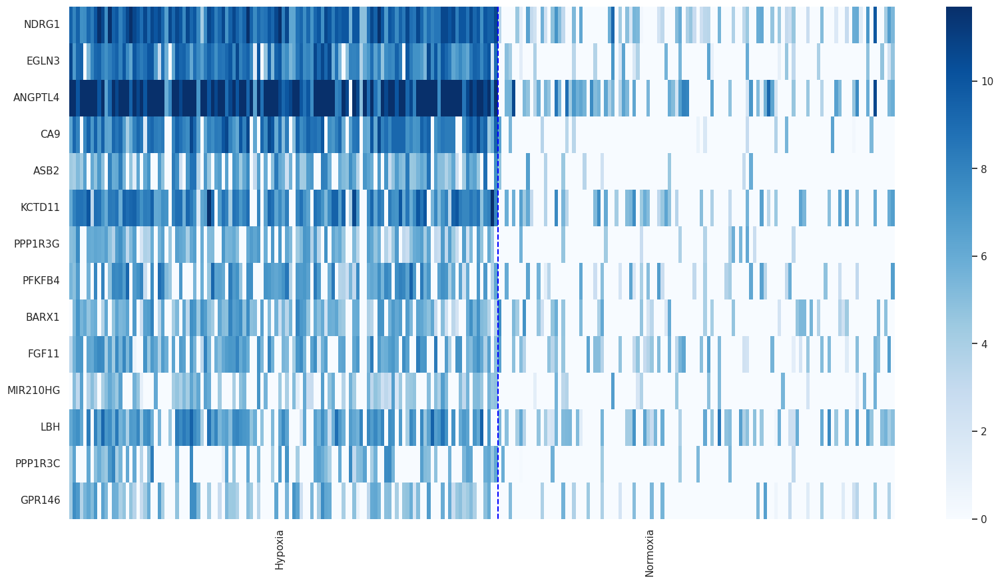

In [ ]:
plt.figure(figsize=(20,10))
sns.heatmap(df_grouped.loc[most_correlated[1:15].index], cmap='Blues')
plt.xticks([59.5, 164], ["Hypoxia", "Normoxia"])
plt.plot([df_hypo.shape[1],df_hypo.shape[1]], [0,14], color='Blue', 
              linestyle='dashed')

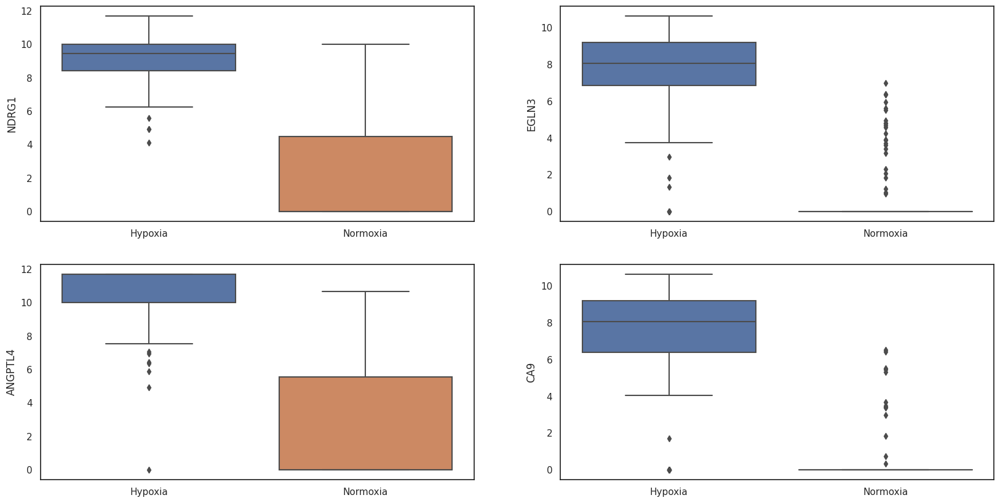

In [ ]:
fig,ax = plt.subplots(2, 2, figsize = (20,10))
k = 0
for i in range(2):
    for j in range(2):
       sns.boxplot([df_grouped_corr.iloc[k,:121], df_grouped_corr.iloc[k,121:]], ax = ax[i][j])
       ax[i,j].set_xticks([0,1],['Hypoxia','Normoxia'])
       ax[i,j].set_ylabel(df_grouped_corr.index[k]) 
       k+=1

##Correlation

In [ ]:
df_hcc_smart_filtered.shape

(19503, 227)

In [ ]:
## separation of hypoxic and normoxic cells

condition_hypo = np.array(['Hypoxia' in cell for cell in df_hcc_smart_filtered.columns])
condition_normo = np.array(['Normoxia' in cell for cell in df_hcc_smart_filtered.columns])
df_hcc_smart_filtered_hypo = df_hcc_smart_filtered[df_hcc_smart_filtered.columns[condition_hypo]]
df_hcc_smart_filtered_normo = df_hcc_smart_filtered[df_hcc_smart_filtered.columns[condition_normo]]
display(df_hcc_smart_filtered_hypo, df_hcc_smart_filtered_normo)

,output.STAR.PCRPlate1A2_Hypoxia_S104_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1A3_Hypoxia_S4_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1A4_Hypoxia_S8_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1A5_Hypoxia_S108_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1A6_Hypoxia_S11_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1B2_Hypoxia_S1_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1B3_Hypoxia_S5_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1B5_Hypoxia_S109_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1B6_Hypoxia_S12_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1C1_Hypoxia_S99_Aligned.sortedByCoord.out.bam,...,output.STAR.PCRPlate4E2_Hypoxia_S196_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4E3_Hypoxia_S227_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4F1_Hypoxia_S224_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4F2_Hypoxia_S197_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4F4_Hypoxia_S228_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4F5_Hypoxia_S229_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4G1_Hypoxia_S193_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4G2_Hypoxia_S198_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4G6_Hypoxia_S232_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4H2_Hypoxia_S199_Aligned.sortedByCoord.out.bam
CICP27,0,0,0,0,0,0,0,0,0,0,...,0,5,0,0,0,0,0,0,0,0
DDX11L17,0,0,1,0,0,8,2,0,0,0,...,0,0,0,0,0,0,0,0,0,0
WASH9P,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,1
OR4F29,0,0,0,1,0,2,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
MTND1P23,63,27,81,305,82,43,56,37,32,153,...,18,150,56,43,110,66,113,47,27,83
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
MT-TE,0,0,3,47,4,4,3,2,1,24,...,6,20,17,6,4,5,15,15,4,4
MT-CYB,4819,310,695,2885,1552,892,789,651,958,5288,...,1238,2119,728,498,881,1257,1429,808,999,2256
MT-TT,11,4,0,41,9,4,0,4,2,8,...,4,23,24,8,17,8,31,3,8,15
MT-TP,3,9,14,91,22,10,3,6,7,69,...,14,81,50,9,31,13,52,11,22,36


,output.STAR.PCRPlate1A10_Normoxia_S123_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1A12_Normoxia_S26_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1A7_Normoxia_S113_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1A8_Normoxia_S119_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1A9_Normoxia_S20_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1B11_Normoxia_S127_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1B12_Normoxia_S27_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1B7_Normoxia_S114_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1B9_Normoxia_S21_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1C10_Normoxia_S124_Aligned.sortedByCoord.out.bam,...,output.STAR.PCRPlate4F12_Normoxia_S242_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4F7_Normoxia_S203_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4F9_Normoxia_S235_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4G10_Normoxia_S209_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4G12_Normoxia_S243_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4G7_Normoxia_S204_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4H10_Normoxia_S210_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4H11_Normoxia_S214_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4H7_Normoxia_S205_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4H9_Normoxia_S236_Aligned.sortedByCoord.out.bam
CICP27,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
DDX11L17,0,0,0,0,1,1,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
WASH9P,0,0,1,0,0,0,0,1,0,0,...,0,0,0,1,0,0,1,0,0,0
OR4F29,2,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
MTND1P23,250,424,46,177,114,184,183,74,128,136,...,146,30,80,513,205,35,146,37,47,249
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
MT-TE,22,43,2,8,17,17,15,10,8,10,...,16,4,25,62,24,4,26,1,4,20
MT-CYB,4208,6491,366,1829,3387,7107,2384,5067,3695,3540,...,1995,664,1201,5870,1119,916,3719,984,981,2039
MT-TT,26,62,2,8,9,25,9,8,11,33,...,53,2,21,58,48,5,42,1,6,34
MT-TP,66,71,3,30,37,88,53,50,60,53,...,61,11,45,110,119,15,48,18,8,79


Text(219.44444444444446, 0.5, 'Cells')

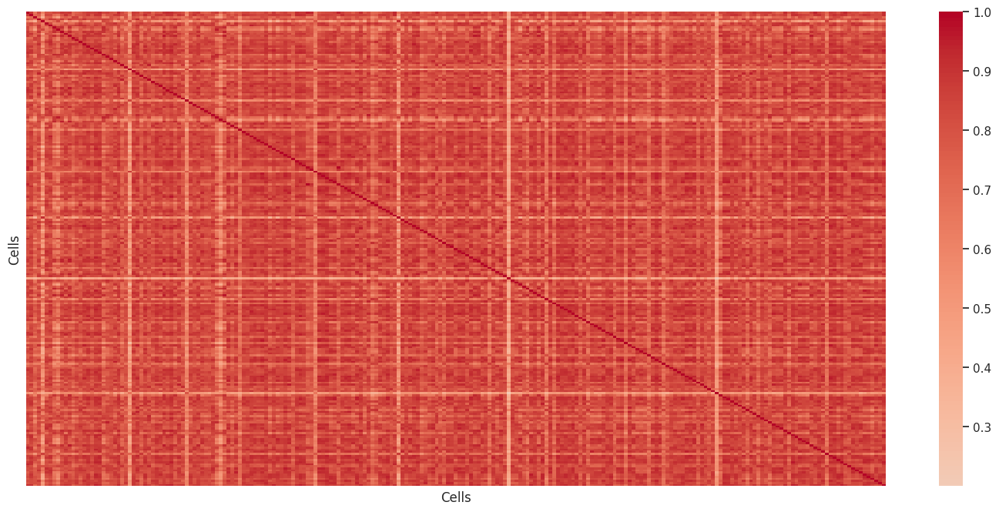

In [ ]:
## general correlation

plt.figure(figsize=(18,8))
c = df_hcc_smart_filtered.corr()
#midpoint = (c.values.max() - c.values.min()) /2 + c.values.min()
#sns.heatmap(c,cmap='coolwarm',annot=True, center=midpoint )
sns.heatmap(c,cmap='coolwarm', center=0, xticklabels=False, yticklabels=False)
plt.xlabel("Cells")
plt.ylabel("Cells")

Text(1089.8989898989896, 0.5, 'Normo cells')

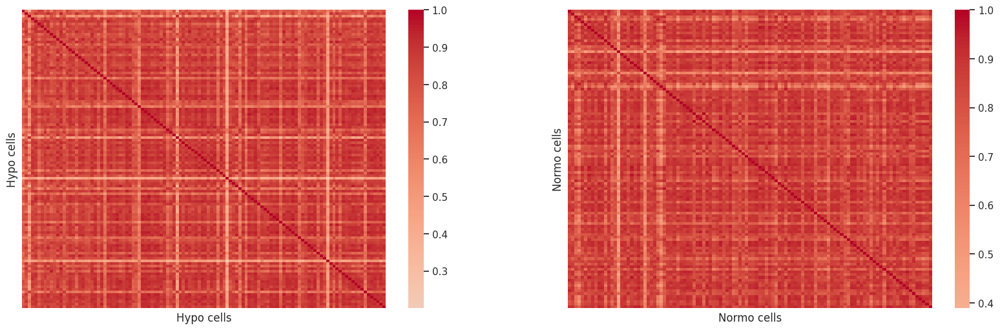

In [ ]:
## correlation normoxic-normoxic and hypoxic-hypoxic

fig, ax = plt.subplots(1, 2, figsize = (20,6))
c1= df_hcc_smart_filtered_hypo.corr()
c2= df_hcc_smart_filtered_normo.corr()
#midpoint = (c.values.max() - c.values.min()) /2 + c.values.min()
#sns.heatmap(c,cmap='coolwarm',annot=True, center=midpoint )
sns.heatmap(c1,cmap='coolwarm', center=0, ax = ax[0], xticklabels=False, yticklabels=False)
sns.heatmap(c2,cmap='coolwarm', center=0, ax = ax[1], xticklabels=False, yticklabels=False)
ax[0].set_xlabel("Hypo cells")
ax[0].set_ylabel("Hypo cells")
ax[1].set_xlabel("Normo cells")
ax[1].set_ylabel("Normo cells")

In [ ]:
## correlation whihch includes also hypoxic-normoxic 
## firstly I group the correlations computed previously based on the condition

corr_hypo = pd.DataFrame(c.columns[['Hypoxia' in cell for cell in df_hcc_smart_filtered.columns]])
corr_normo = pd.DataFrame(c.columns[['Normoxia' in cell for cell in df_hcc_smart_filtered.columns]])
grouped_corr = c.loc[pd.concat([corr_hypo, corr_normo])[0], pd.concat([corr_hypo, corr_normo])[0]]
grouped_corr

,output.STAR.PCRPlate1A2_Hypoxia_S104_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1A3_Hypoxia_S4_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1A4_Hypoxia_S8_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1A5_Hypoxia_S108_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1A6_Hypoxia_S11_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1B2_Hypoxia_S1_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1B3_Hypoxia_S5_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1B5_Hypoxia_S109_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1B6_Hypoxia_S12_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1C1_Hypoxia_S99_Aligned.sortedByCoord.out.bam,...,output.STAR.PCRPlate4F12_Normoxia_S242_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4F7_Normoxia_S203_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4F9_Normoxia_S235_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4G10_Normoxia_S209_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4G12_Normoxia_S243_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4G7_Normoxia_S204_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4H10_Normoxia_S210_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4H11_Normoxia_S214_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4H7_Normoxia_S205_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4H9_Normoxia_S236_Aligned.sortedByCoord.out.bam
output.STAR.PCRPlate1A2_Hypoxia_S104_Aligned.sortedByCoord.out.bam,1.000000,0.670507,0.382132,0.736205,0.757362,0.870132,0.860460,0.690555,0.809904,0.626057,...,0.726078,0.829057,0.766417,0.664677,0.632359,0.770539,0.814616,0.788036,0.817204,0.715216
output.STAR.PCRPlate1A3_Hypoxia_S4_Aligned.sortedByCoord.out.bam,0.670507,1.000000,0.736402,0.767274,0.893940,0.840555,0.838970,0.849370,0.915963,0.851515,...,0.782741,0.729296,0.815728,0.770785,0.825243,0.766560,0.772388,0.731109,0.805160,0.816401
output.STAR.PCRPlate1A4_Hypoxia_S8_Aligned.sortedByCoord.out.bam,0.382132,0.736402,1.000000,0.639195,0.651943,0.523114,0.518983,0.713488,0.613650,0.812407,...,0.570541,0.403781,0.529848,0.542897,0.798231,0.435366,0.427710,0.385943,0.480156,0.525049
output.STAR.PCRPlate1A5_Hypoxia_S108_Aligned.sortedByCoord.out.bam,0.736205,0.767274,0.639195,1.000000,0.841144,0.704587,0.807269,0.887254,0.787974,0.852854,...,0.872348,0.786788,0.825820,0.801433,0.825274,0.822634,0.805835,0.702003,0.769778,0.811312
output.STAR.PCRPlate1A6_Hypoxia_S11_Aligned.sortedByCoord.out.bam,0.757362,0.893940,0.651943,0.841144,1.000000,0.844445,0.892358,0.922975,0.907422,0.824855,...,0.853252,0.812687,0.873377,0.764379,0.812423,0.862457,0.829827,0.782737,0.819911,0.867351
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
output.STAR.PCRPlate4G7_Normoxia_S204_Aligned.sortedByCoord.out.bam,0.770539,0.766560,0.435366,0.822634,0.862457,0.760549,0.859218,0.808890,0.830735,0.711727,...,0.922976,0.937423,0.940059,0.818012,0.784286,1.000000,0.938243,0.899546,0.887221,0.920389
output.STAR.PCRPlate4H10_Normoxia_S210_Aligned.sortedByCoord.out.bam,0.814616,0.772388,0.427710,0.805835,0.829827,0.787185,0.862245,0.764959,0.845258,0.714249,...,0.924869,0.941223,0.925382,0.838919,0.786423,0.938243,1.000000,0.909800,0.921858,0.902324
output.STAR.PCRPlate4H11_Normoxia_S214_Aligned.sortedByCoord.out.bam,0.788036,0.731109,0.385943,0.702003,0.782737,0.779425,0.823187,0.692263,0.843634,0.636978,...,0.831105,0.917819,0.880129,0.746144,0.716294,0.899546,0.909800,1.000000,0.888484,0.848917
output.STAR.PCRPlate4H7_Normoxia_S205_Aligned.sortedByCoord.out.bam,0.817204,0.805160,0.480156,0.769778,0.819911,0.824491,0.892906,0.767114,0.863676,0.724450,...,0.860427,0.913694,0.883251,0.771507,0.769936,0.887221,0.921858,0.888484,1.000000,0.841843


Text(0.5, 1.0, 'Correlation Matrix')

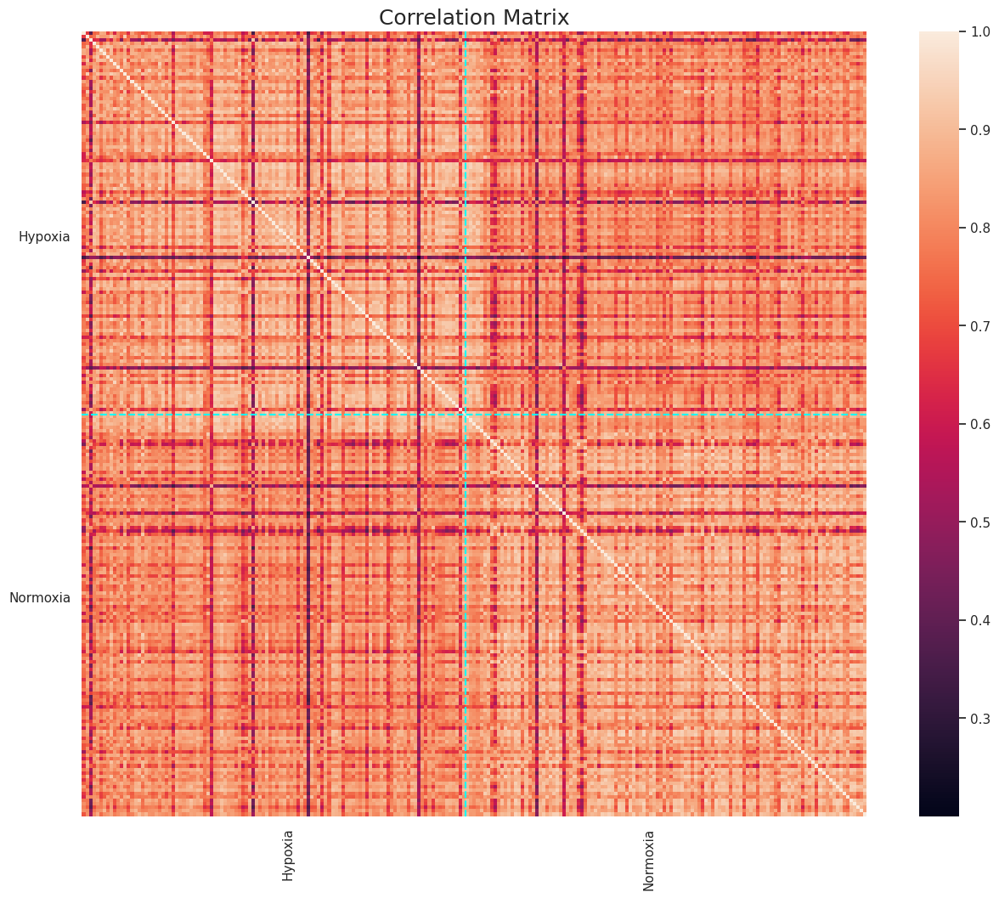

In [ ]:
## correlation matrix

f, ax = plt.subplots(figsize=(16, 12))
sns.heatmap(grouped_corr, vmax=1,
            cbar=True, square=True, fmt='.2f', annot_kws={'size': 10})
plt.yticks([59.5, 164], ["Hypoxia", "Normoxia"])
plt.plot([0,df_hcc_smart_filtered.shape[1]], [df_hcc_smart_filtered_normo.shape[1],df_hcc_smart_filtered_normo.shape[1]], color='cyan', 
              linestyle='dashed')
plt.plot([df_hcc_smart_filtered_normo.shape[1],df_hcc_smart_filtered_normo.shape[1]], [0,df_hcc_smart_filtered.shape[1]], color='cyan', 
              linestyle='dashed')
plt.xticks([59.5, 164], ["Hypoxia", "Normoxia"])
plt.title("Correlation Matrix", fontsize=18)

<Axes: >

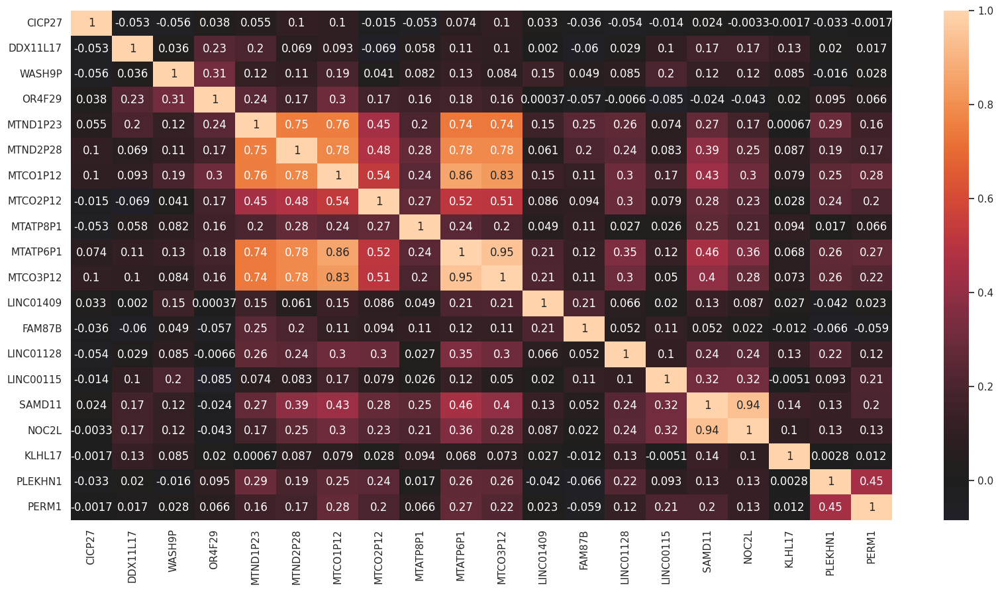

In [ ]:
## correlation between some of the genes plotted

plt.figure(figsize=(20,10))
c = df_hcc_smart_filtered.transpose().iloc[:,:20].corr()
#midpoint = (c.values.max() - c.values.min()) /2 + c.values.min()
#sns.heatmap(c,cmap='coolwarm',annot=True, center=midpoint )
sns.heatmap(c, center=0, annot=True)

In [ ]:
## trying to define an analytic correlation based on the prevalence of some genes in normoxic or hypoxic cells

hypo_sum = np.zeros(len(df_hcc_smart_filtered.transpose().columns))
normo_sum = np.zeros(len(df_hcc_smart_filtered.transpose().columns))
for i in range(len(df_hcc_smart_filtered.transpose().columns)):
    hypo_sum[i] = df_hcc_smart_filtered_hypo.loc[df_hcc_smart_filtered_hypo.transpose().columns[i]].sum()*111/227
    normo_sum[i] = df_hcc_smart_filtered_normo.loc[df_hcc_smart_filtered_normo.transpose().columns[i]].sum()*116/227
ratio_hypo = hypo_sum/(hypo_sum+normo_sum)
ratio_normo = normo_sum/(hypo_sum+normo_sum)
df_corr = pd.DataFrame({"Ratio_hypo":ratio_hypo, "Ratio_normo":ratio_normo}, index=df_hcc_smart_filtered.transpose().columns)
df_corr

,Ratio_hypo,Ratio_normo
CICP27,0.730546,0.269454
DDX11L17,0.693417,0.306583
WASH9P,0.498420,0.501580
OR4F29,0.814874,0.185126
MTND1P23,0.457993,0.542007
...,...,...
MT-TE,0.412511,0.587489
MT-CYB,0.458125,0.541875
MT-TT,0.531304,0.468696
MT-TP,0.471444,0.528556


<Axes: >

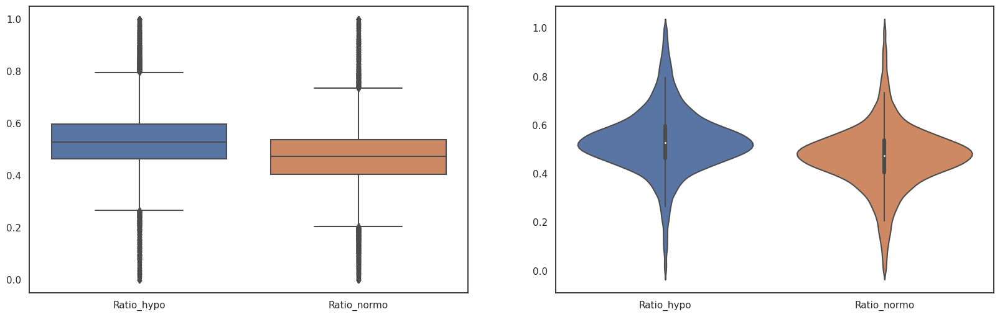

In [ ]:
## idk if this is useful, era carino

fig,ax = plt.subplots(1, 2, figsize = (20,6))
sns.boxplot(df_corr, ax=ax[0])
sns.violinplot(df_corr, ax=ax[1])

In [ ]:
## 50 most correlated genes to hypoxic or normoxic condition based on the last-computed metric

genes_hypo = df_corr.sort_values(by='Ratio_normo').iloc[:50,:]
genes_normo = df_corr.sort_values(by='Ratio_hypo').iloc[:50,:]
display(genes_normo,genes_hypo)

,Ratio_hypo,Ratio_normo
RPL36P16,0.000000,1.000000
HSPD1P15,0.000000,1.000000
SNORD46,0.000000,1.000000
LINC01752,0.000000,1.000000
OR6A2,0.000000,1.000000
RNU2-17P,0.000000,1.000000
KRT18P43,0.000000,1.000000
F2RL2,0.000000,1.000000
ICE2P1,0.000000,1.000000
AKNAD1,0.000000,1.000000


,Ratio_hypo,Ratio_normo
CCN4,1.000000,0.000000
MIR6811,1.000000,0.000000
EGLN3-AS1,1.000000,0.000000
ASS1P11,1.000000,0.000000
SNORD60,1.000000,0.000000
FZD10,1.000000,0.000000
LINC00898,1.000000,0.000000
SLC9C1,1.000000,0.000000
CCDC180,1.000000,0.000000
FAM238C,1.000000,0.000000


Text(0, 0.5, 'Gene expression')

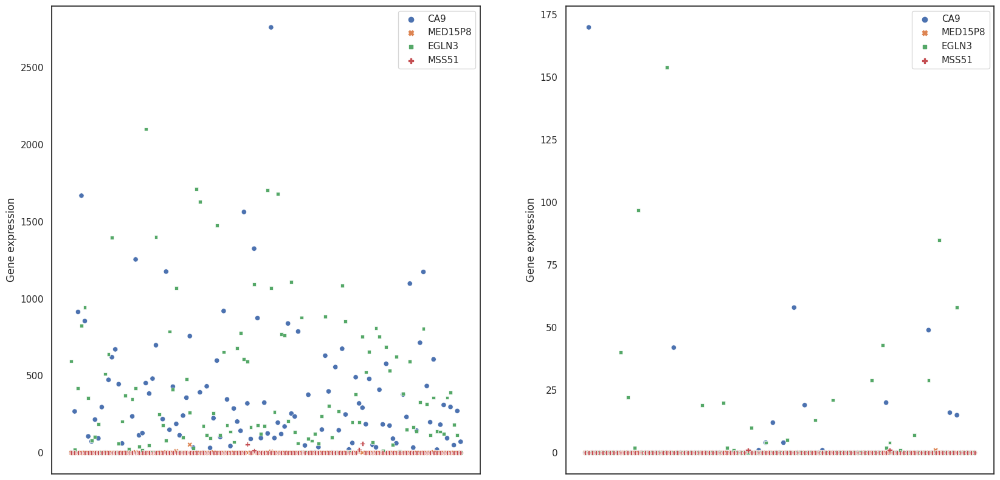

In [ ]:
## choosing one of these genes which show a strong "imbalance" and comparing the behaviour in normoxic and hypoxic cells, we can see, indeed, the difference in its expression

fig,ax = plt.subplots(1, 2, figsize = (20,10))
sns.scatterplot(df_hcc_smart_filtered_hypo.T[['CA9','MED15P8','EGLN3','MSS51']], ax=ax[0]).set(xticklabels=[])
sns.scatterplot(df_hcc_smart_filtered_normo.T[['CA9','MED15P8','EGLN3','MSS51']], ax=ax[1]).set(xticklabels=[])
ax[0].set_ylabel('Gene expression')
ax[1].set_ylabel('Gene expression')

In [ ]:
## actually computing the correlation with 'condition' as a categorical variable

cond = pd.DataFrame(['Hypoxia' in cell for cell in df_hcc_smart_filtered.columns])
cond.index = df_hcc_smart_filtered.columns
cond.columns = ['Hypo_condition']
data_cond = pd.concat([df_hcc_smart_filtered.transpose(), cond], axis = 1)
corr_genes = data_cond.corr()

In [ ]:
## ordering values, in order to see the ones that are more correlated with Hypoxia

most_correlated = pd.Series.sort_values((corr_genes["Hypo_condition"]), ascending=False)
most_correlated

Hypo_condition    1.000000
PGK1              0.649879
BNIP3             0.627936
DDIT4             0.626975
BHLHE40           0.603399
                    ...   
PNPT1            -0.392183
SLC25A33         -0.410212
PRMT3            -0.412071
IFRD1            -0.417443
NDUFAF4          -0.429491
Name: Hypo_condition, Length: 19504, dtype: float64

In [ ]:
df_grouped = pd.concat([df_hcc_smart_filtered_hypo, df_hcc_smart_filtered_normo], axis = 1)
df_grouped_corr = df_grouped.loc[most_correlated[1:15].index]
df_grouped_corr

,output.STAR.PCRPlate1A2_Hypoxia_S104_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1A3_Hypoxia_S4_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1A4_Hypoxia_S8_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1A5_Hypoxia_S108_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1A6_Hypoxia_S11_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1B2_Hypoxia_S1_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1B3_Hypoxia_S5_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1B5_Hypoxia_S109_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1B6_Hypoxia_S12_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1C1_Hypoxia_S99_Aligned.sortedByCoord.out.bam,...,output.STAR.PCRPlate4F12_Normoxia_S242_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4F7_Normoxia_S203_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4F9_Normoxia_S235_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4G10_Normoxia_S209_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4G12_Normoxia_S243_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4G7_Normoxia_S204_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4H10_Normoxia_S210_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4H11_Normoxia_S214_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4H7_Normoxia_S205_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4H9_Normoxia_S236_Aligned.sortedByCoord.out.bam
PGK1,5912,1512,2826,9057,10195,3606,2129,3035,1526,6613,...,1226,523,1217,2489,1183,509,1428,440,485,1654
BNIP3,1093,232,307,2367,1840,912,584,214,264,1447,...,19,71,171,98,0,19,94,17,19,56
DDIT4,14739,2719,7049,12634,19097,17913,5765,3003,1588,5893,...,314,60,250,0,283,824,90,63,96,49
BHLHE40,3310,64,544,1510,334,1231,577,490,524,1518,...,168,4,87,0,319,51,27,244,0,38
BNIP3L,1015,182,467,797,723,306,185,220,119,904,...,28,15,94,57,18,15,56,2,5,42
BNIP3P1,16,3,4,26,22,7,6,0,0,10,...,0,1,1,1,0,1,2,0,0,1
PDK1,152,74,46,811,119,126,50,150,59,224,...,65,12,34,8,38,14,13,2,6,15
ALDOC,480,126,1100,1190,1570,1112,11,726,165,1044,...,153,21,52,103,295,32,35,23,24,117
LDHA,24611,4925,7571,43081,25419,9838,7967,9223,6032,43191,...,9694,2293,10098,11749,5762,3176,8250,1670,3213,5566
P4HA1,1442,180,282,806,526,240,195,87,129,1428,...,94,39,290,289,243,9,214,33,64,139


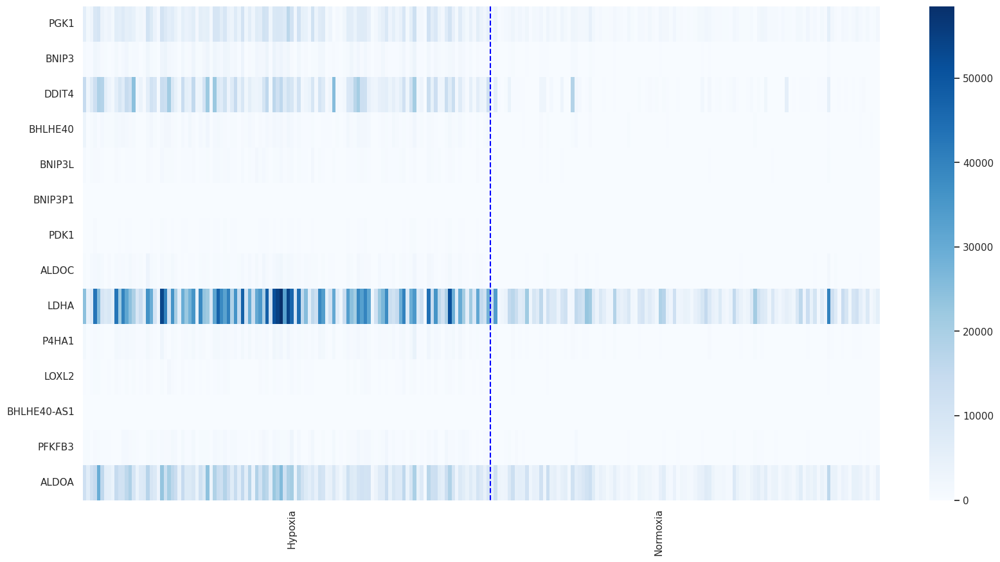

In [ ]:
plt.figure(figsize=(20,10))
sns.heatmap(df_grouped.loc[most_correlated[1:15].index], cmap='Blues')
plt.xticks([59.5, 164], ["Hypoxia", "Normoxia"])
plt.plot([df_hcc_smart_filtered_hypo.shape[1],df_hcc_smart_filtered_hypo.shape[1]], [0,14], color='Blue', 
              linestyle='dashed')

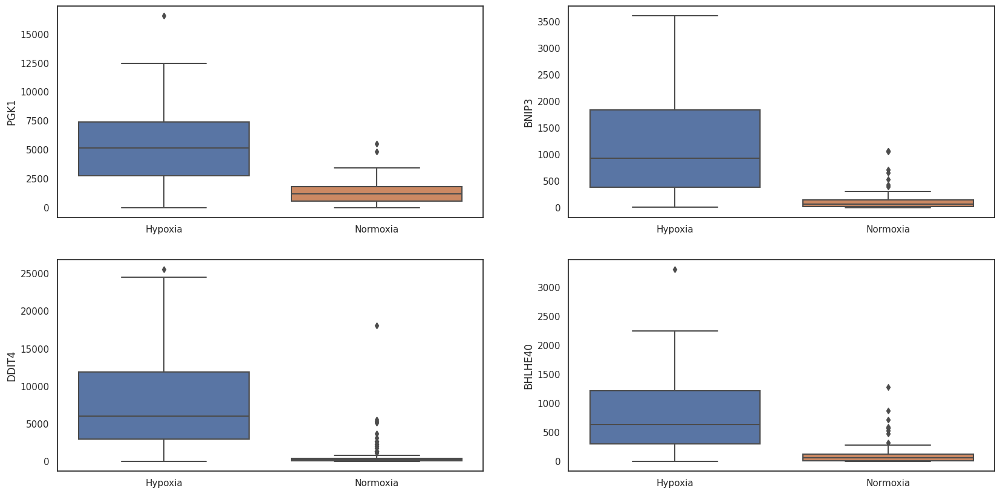

In [ ]:
fig,ax = plt.subplots(2, 2, figsize = (20,10))
k = 0
for i in range(2):
    for j in range(2):
       sns.boxplot([df_grouped_corr.iloc[k,:116], df_grouped_corr.iloc[k,116:]], ax = ax[i][j])
       ax[i,j].set_xticks([0,1],['Hypoxia','Normoxia'])
       ax[i,j].set_ylabel(df_grouped_corr.index[k]) 
       k+=1

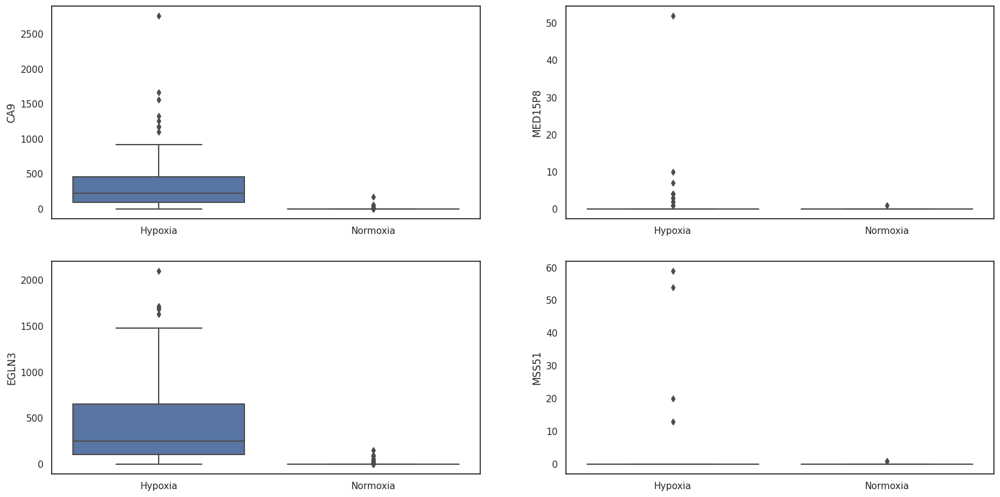

In [ ]:
## same thing but with my method
## hypo

fig,ax = plt.subplots(2, 2, figsize = (20,10))
k = 0
for i in range(2):
    for j in range(2):
       sns.boxplot([df_grouped.loc[genes_hypo.index[38+k]][:116], df_grouped.loc[genes_hypo.index[38+k]][116:]], ax = ax[i][j])
       ax[i,j].set_xticks([0,1],['Hypoxia','Normoxia'])
       ax[i,j].set_ylabel(genes_hypo.index[38+k])
       k+=1 

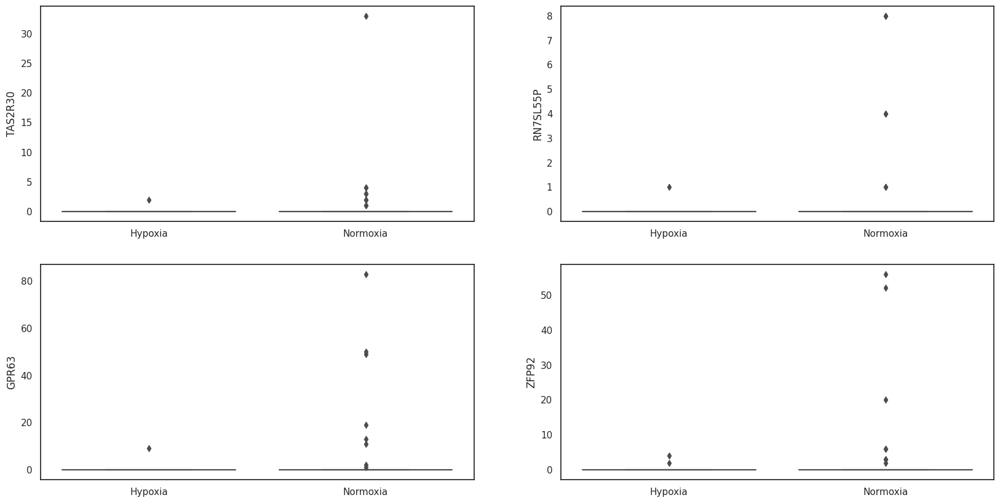

In [ ]:
## same thing but with my method
## normo

fig,ax = plt.subplots(2, 2, figsize = (20,10))
k = 0
for i in range(2):
    for j in range(2):
       sns.boxplot([df_grouped.loc[genes_normo.index[45+k]][:116], df_grouped.loc[genes_normo.index[45+k]][116:]], ax = ax[i][j])
       ax[i,j].set_xticks([0,1],['Hypoxia','Normoxia'])
       ax[i,j].set_ylabel(genes_normo.index[45+k])
       k+=1

## Another viewpoint - Grouping genes by name

In [ ]:
def check(start):
    return pd.Series((x.startswith(start) for x in df_hcc_smart_filtered.index), index=pd.Series(df_hcc_smart_filtered.index))

gene_types=set()
for x in df_hcc_smart_filtered.index:
    ind = next((i for i, c in enumerate(x) if (c.isdigit() or c=='-')), len(x))
    gene_types.add(x[0:ind])

df_gene_types=pd.DataFrame(columns=df_hcc_smart_filtered.columns)
for s in gene_types:
    df_gene_types.loc[s]=df_hcc_smart_filtered.loc[check(s)].sum()
df_gene_types

,output.STAR.PCRPlate1A10_Normoxia_S123_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1A12_Normoxia_S26_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1A2_Hypoxia_S104_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1A3_Hypoxia_S4_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1A4_Hypoxia_S8_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1A5_Hypoxia_S108_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1A6_Hypoxia_S11_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1A7_Normoxia_S113_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1A8_Normoxia_S119_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1A9_Normoxia_S20_Aligned.sortedByCoord.out.bam,...,output.STAR.PCRPlate4G12_Normoxia_S243_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4G1_Hypoxia_S193_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4G2_Hypoxia_S198_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4G6_Hypoxia_S232_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4G7_Normoxia_S204_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4H10_Normoxia_S210_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4H11_Normoxia_S214_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4H2_Hypoxia_S199_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4H7_Normoxia_S205_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4H9_Normoxia_S236_Aligned.sortedByCoord.out.bam
LRIG,12,83,25,19,0,43,325,48,0,0,...,87,4,39,24,103,34,13,0,42,14
PLAC,25,396,104,71,0,299,180,40,0,18,...,18,224,19,10,10,25,0,162,5,23
HARS,270,1005,1215,237,165,342,971,297,255,618,...,218,324,175,87,197,848,140,557,313,592
CRYM,0,0,0,0,0,0,0,2,0,0,...,0,0,0,0,0,0,0,0,0,0
VSIR,28,616,479,49,0,142,1007,162,212,31,...,144,634,66,104,64,204,0,98,33,46
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
CNTLN,0,24,0,2,0,0,4,0,7,0,...,29,0,4,0,0,13,0,0,0,20
RPP,1113,1755,948,253,141,1517,1222,354,740,515,...,797,836,363,184,238,1043,220,594,294,709
SOHLH,92,193,0,80,0,0,26,32,0,27,...,148,58,78,0,23,182,20,49,34,51
RNH,289,897,825,163,82,964,597,262,151,548,...,376,567,278,143,218,554,127,176,190,189


In [ ]:
condition_hypo = np.array(['Hypoxia' in cell for cell in df_gene_types.columns])
condition_normo = np.array(['Normoxia' in cell for cell in df_gene_types.columns])
df_gene_types_hypo = df_gene_types[df_gene_types.columns[condition_hypo]]
df_gene_types_normo = df_gene_types[df_gene_types.columns[condition_normo]]
display(df_gene_types_hypo,df_gene_types_normo)

,output.STAR.PCRPlate1A2_Hypoxia_S104_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1A3_Hypoxia_S4_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1A4_Hypoxia_S8_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1A5_Hypoxia_S108_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1A6_Hypoxia_S11_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1B2_Hypoxia_S1_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1B3_Hypoxia_S5_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1B5_Hypoxia_S109_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1B6_Hypoxia_S12_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1C1_Hypoxia_S99_Aligned.sortedByCoord.out.bam,...,output.STAR.PCRPlate4E2_Hypoxia_S196_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4E3_Hypoxia_S227_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4F1_Hypoxia_S224_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4F2_Hypoxia_S197_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4F4_Hypoxia_S228_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4F5_Hypoxia_S229_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4G1_Hypoxia_S193_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4G2_Hypoxia_S198_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4G6_Hypoxia_S232_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4H2_Hypoxia_S199_Aligned.sortedByCoord.out.bam
LRIG,25,19,0,43,325,0,22,32,0,0,...,72,150,59,18,65,48,4,39,24,0
PLAC,104,71,0,299,180,0,72,63,0,460,...,29,405,103,49,58,43,224,19,10,162
HARS,1215,237,165,342,971,463,300,188,160,386,...,108,533,266,568,438,197,324,175,87,557
CRYM,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
VSIR,479,49,0,142,1007,324,279,276,47,199,...,66,190,18,29,229,87,634,66,104,98
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
CNTLN,0,2,0,0,4,0,0,0,0,0,...,0,0,0,0,0,0,0,4,0,0
RPP,948,253,141,1517,1222,543,328,389,147,356,...,150,469,478,542,561,179,836,363,184,594
SOHLH,0,80,0,0,26,0,2,0,12,0,...,47,54,9,0,2,30,58,78,0,49
RNH,825,163,82,964,597,1007,222,218,127,214,...,118,426,305,150,195,88,567,278,143,176


,output.STAR.PCRPlate1A10_Normoxia_S123_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1A12_Normoxia_S26_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1A7_Normoxia_S113_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1A8_Normoxia_S119_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1A9_Normoxia_S20_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1B11_Normoxia_S127_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1B12_Normoxia_S27_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1B7_Normoxia_S114_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1B9_Normoxia_S21_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1C10_Normoxia_S124_Aligned.sortedByCoord.out.bam,...,output.STAR.PCRPlate4F12_Normoxia_S242_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4F7_Normoxia_S203_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4F9_Normoxia_S235_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4G10_Normoxia_S209_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4G12_Normoxia_S243_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4G7_Normoxia_S204_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4H10_Normoxia_S210_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4H11_Normoxia_S214_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4H7_Normoxia_S205_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4H9_Normoxia_S236_Aligned.sortedByCoord.out.bam
LRIG,12,83,48,0,0,0,1,1,64,147,...,42,20,21,35,87,103,34,13,42,14
PLAC,25,396,40,0,18,204,75,95,0,27,...,42,0,23,35,18,10,25,0,5,23
HARS,270,1005,297,255,618,442,1576,782,849,432,...,536,198,398,384,218,197,848,140,313,592
CRYM,0,0,2,0,0,0,0,0,0,0,...,0,0,2,0,0,0,0,0,0,0
VSIR,28,616,162,212,31,458,216,42,123,55,...,306,18,94,0,144,64,204,0,33,46
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
CNTLN,0,24,0,7,0,10,0,0,0,19,...,0,0,1,85,29,0,13,0,0,20
RPP,1113,1755,354,740,515,1545,1971,833,931,1158,...,781,255,799,2310,797,238,1043,220,294,709
SOHLH,92,193,32,0,27,268,184,324,0,118,...,99,8,143,83,148,23,182,20,34,51
RNH,289,897,262,151,548,375,249,636,483,706,...,152,126,237,208,376,218,554,127,190,189


In [ ]:
plt.figure(figsize=(18,8))
c = df_gene_types.corr()
corr_hypo = pd.DataFrame(c.columns[['Hypoxia' in cell for cell in df_gene_types.columns]])
corr_normo = pd.DataFrame(c.columns[['Normoxia' in cell for cell in df_gene_types.columns]])
grouped_corr = c.loc[pd.concat([corr_hypo, corr_normo])[0], pd.concat([corr_hypo, corr_normo])[0]]
grouped_corr

,output.STAR.PCRPlate1A2_Hypoxia_S104_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1A3_Hypoxia_S4_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1A4_Hypoxia_S8_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1A5_Hypoxia_S108_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1A6_Hypoxia_S11_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1B2_Hypoxia_S1_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1B3_Hypoxia_S5_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1B5_Hypoxia_S109_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1B6_Hypoxia_S12_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1C1_Hypoxia_S99_Aligned.sortedByCoord.out.bam,...,output.STAR.PCRPlate4F12_Normoxia_S242_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4F7_Normoxia_S203_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4F9_Normoxia_S235_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4G10_Normoxia_S209_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4G12_Normoxia_S243_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4G7_Normoxia_S204_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4H10_Normoxia_S210_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4H11_Normoxia_S214_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4H7_Normoxia_S205_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4H9_Normoxia_S236_Aligned.sortedByCoord.out.bam
output.STAR.PCRPlate1A2_Hypoxia_S104_Aligned.sortedByCoord.out.bam,1.000000,0.972867,0.892861,0.969844,0.980545,0.991701,0.986136,0.971607,0.986366,0.961825,...,0.975323,0.985857,0.981322,0.944561,0.974006,0.977284,0.983326,0.985299,0.985056,0.962805
output.STAR.PCRPlate1A3_Hypoxia_S4_Aligned.sortedByCoord.out.bam,0.972867,1.000000,0.940630,0.984884,0.992880,0.984103,0.989421,0.990882,0.994463,0.988069,...,0.987014,0.983292,0.989337,0.971674,0.990413,0.987185,0.986222,0.986879,0.989171,0.983508
output.STAR.PCRPlate1A4_Hypoxia_S8_Aligned.sortedByCoord.out.bam,0.892861,0.940630,1.000000,0.920721,0.930484,0.914901,0.909056,0.941000,0.929290,0.944530,...,0.907665,0.891624,0.907635,0.890291,0.931851,0.897903,0.898418,0.899705,0.902424,0.901065
output.STAR.PCRPlate1A5_Hypoxia_S108_Aligned.sortedByCoord.out.bam,0.969844,0.984884,0.920721,1.000000,0.985306,0.969513,0.985592,0.988396,0.985394,0.990562,...,0.993475,0.984772,0.988950,0.984885,0.990219,0.990532,0.989916,0.982241,0.984568,0.989470
output.STAR.PCRPlate1A6_Hypoxia_S11_Aligned.sortedByCoord.out.bam,0.980545,0.992880,0.930484,0.985306,1.000000,0.989190,0.992701,0.994485,0.994508,0.982642,...,0.987316,0.987248,0.990899,0.963823,0.987819,0.989354,0.987338,0.987653,0.987951,0.982000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
output.STAR.PCRPlate4G7_Normoxia_S204_Aligned.sortedByCoord.out.bam,0.977284,0.987185,0.897903,0.990532,0.989354,0.977849,0.992121,0.987009,0.988751,0.980324,...,0.997510,0.996218,0.997971,0.982055,0.992146,1.000000,0.997233,0.994120,0.994615,0.994622
output.STAR.PCRPlate4H10_Normoxia_S210_Aligned.sortedByCoord.out.bam,0.983326,0.986222,0.898418,0.989916,0.987338,0.981348,0.991409,0.984024,0.990022,0.980763,...,0.997712,0.996446,0.997544,0.981172,0.992874,0.997233,1.000000,0.995928,0.995549,0.991393
output.STAR.PCRPlate4H11_Normoxia_S214_Aligned.sortedByCoord.out.bam,0.985299,0.986879,0.899705,0.982241,0.987653,0.985725,0.989978,0.981120,0.991590,0.975569,...,0.992512,0.996054,0.995831,0.971948,0.990074,0.994120,0.995928,1.000000,0.995219,0.985347
output.STAR.PCRPlate4H7_Normoxia_S205_Aligned.sortedByCoord.out.bam,0.985056,0.989171,0.902424,0.984568,0.987951,0.984470,0.994893,0.984783,0.991451,0.978475,...,0.993151,0.995668,0.995651,0.974289,0.989282,0.994615,0.995549,0.995219,1.000000,0.987554


<Figure size 1800x800 with 0 Axes>

Text(0.5, 1.0, 'Correlation Matrix')

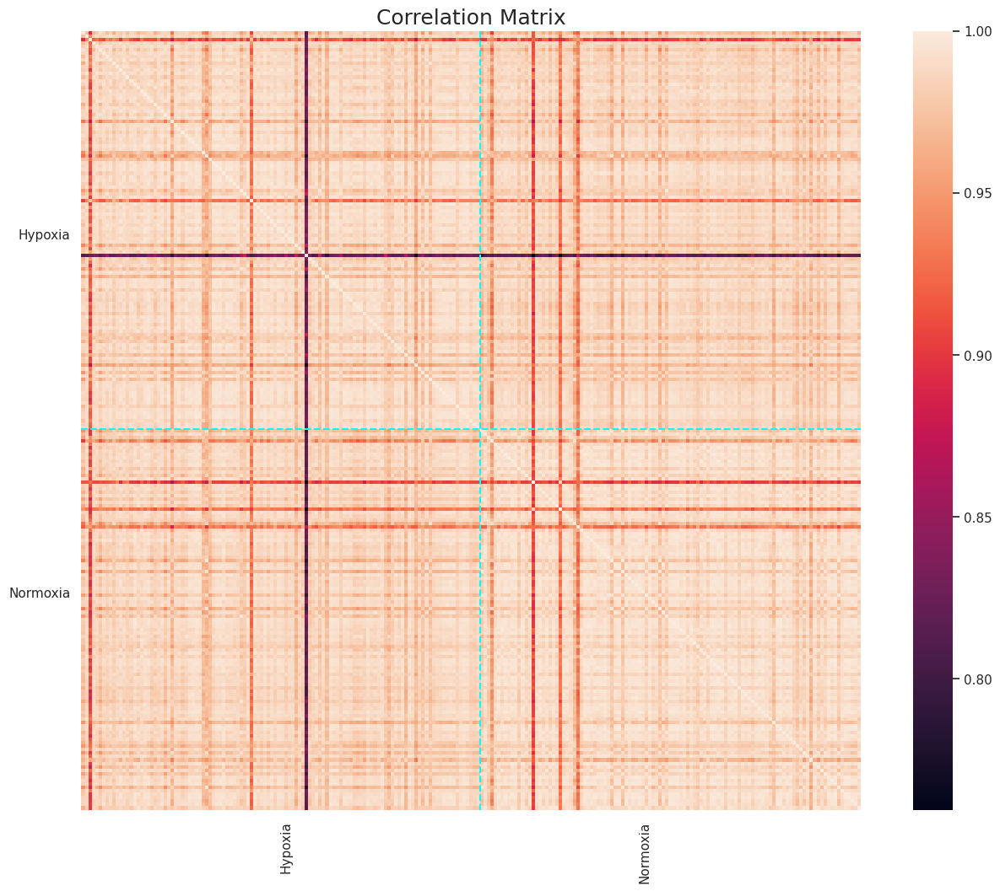

In [ ]:
f, ax = plt.subplots(figsize=(16, 12))
sns.heatmap(grouped_corr, vmax=1,
            cbar=True, square=True, fmt='.2f', annot_kws={'size': 10})
plt.yticks([59.5, 164], ["Hypoxia", "Normoxia"])
plt.plot([0,df_gene_types.shape[1]], [df_gene_types_hypo.shape[1],df_gene_types_hypo.shape[1]], color='cyan', 
              linestyle='dashed')
plt.plot([df_gene_types_hypo.shape[1],df_gene_types_hypo.shape[1]], [0,df_gene_types.shape[1]], color='cyan', 
              linestyle='dashed')
plt.xticks([59.5, 164], ["Hypoxia", "Normoxia"])
plt.title("Correlation Matrix", fontsize=18)

<Axes: >

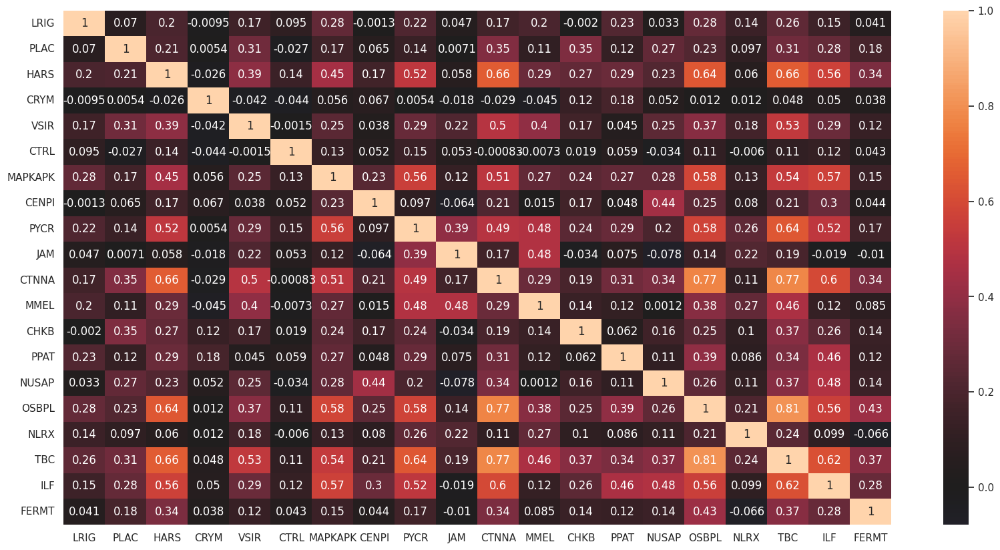

In [ ]:
plt.figure(figsize=(20,10))
c = df_gene_types.transpose().iloc[:,:20].corr()
#midpoint = (c.values.max() - c.values.min()) /2 + c.values.min()
#sns.heatmap(c,cmap='coolwarm',annot=True, center=midpoint )
sns.heatmap(c, center=0, annot=True)

In [ ]:
cond = pd.DataFrame(['Hypoxia' in cell for cell in df_gene_types.columns])
cond.index = df_gene_types.columns
cond.columns = ['Hypo_condition']
data_cond = pd.concat([df_gene_types.transpose(), cond], axis = 1)
corr_genes = data_cond.corr()

In [ ]:
most_correlated = pd.Series.sort_values((corr_genes["Hypo_condition"]), ascending=False)
most_correlated

Hypo_condition    1.000000
PGK               0.649855
BNIP              0.625924
DDIT              0.618800
DDI               0.611708
                    ...   
PTGDR            -0.363625
SRM              -0.365497
LTV              -0.382796
PNO              -0.389238
PNPT             -0.392260
Name: Hypo_condition, Length: 5638, dtype: float64

In [ ]:
df_grouped = pd.concat([df_gene_types_hypo, df_gene_types_normo], axis = 1)
df_grouped_corr = df_grouped.loc[most_correlated[1:15].index]
df_grouped_corr

,output.STAR.PCRPlate1A2_Hypoxia_S104_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1A3_Hypoxia_S4_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1A4_Hypoxia_S8_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1A5_Hypoxia_S108_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1A6_Hypoxia_S11_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1B2_Hypoxia_S1_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1B3_Hypoxia_S5_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1B5_Hypoxia_S109_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1B6_Hypoxia_S12_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate1C1_Hypoxia_S99_Aligned.sortedByCoord.out.bam,...,output.STAR.PCRPlate4F12_Normoxia_S242_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4F7_Normoxia_S203_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4F9_Normoxia_S235_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4G10_Normoxia_S209_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4G12_Normoxia_S243_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4G7_Normoxia_S204_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4H10_Normoxia_S210_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4H11_Normoxia_S214_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4H7_Normoxia_S205_Aligned.sortedByCoord.out.bam,output.STAR.PCRPlate4H9_Normoxia_S236_Aligned.sortedByCoord.out.bam
PGK,5917,1514,2829,9063,10210,3614,2131,3036,1528,6621,...,1230,523,1220,2492,1185,509,1431,440,485,1655
BNIP,2504,525,829,3440,2721,1225,877,456,420,2728,...,279,134,396,277,246,95,323,87,74,210
DDIT,14768,2780,7073,12840,19203,18012,5938,3014,1604,6276,...,399,62,321,79,361,839,139,137,100,155
DDI,14768,2799,7112,13056,19442,18134,5942,3060,1647,6537,...,774,118,650,211,842,891,544,205,190,325
BHLHE,3443,67,642,1576,385,1309,616,529,550,1567,...,185,7,92,20,374,52,29,250,0,40
EGLN,1603,279,670,1159,1925,555,228,202,283,146,...,250,45,131,0,404,67,214,67,142,91
ALDOC,480,126,1100,1190,1570,1112,11,726,165,1044,...,153,21,52,103,295,32,35,23,24,117
LDHA,24676,4943,7595,43185,25499,9874,7991,9253,6048,43310,...,9719,2310,10119,11774,5768,3181,8270,1676,3229,5586
PFKFB,543,505,380,1512,703,246,457,351,210,238,...,198,102,228,71,302,143,349,274,113,36
ALDOA,12194,6608,11691,14568,29553,15939,5749,5699,3712,14813,...,3150,1268,4616,4676,4068,1789,3913,1066,1647,4814


Text(0.5, 1.0, '15 mostly normo-correlated')

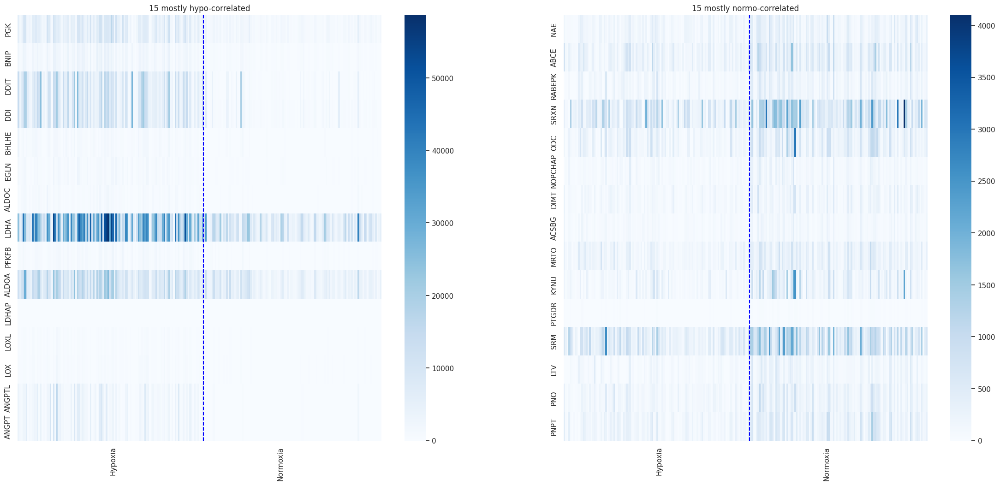

In [ ]:
fig,ax=plt.subplots(1,2,figsize=(28,12))
#plt.figure(figsize=(20,10))
sns.heatmap(df_grouped.loc[most_correlated[1:16].index], cmap='Blues',ax=ax[0])
sns.heatmap(df_grouped.loc[most_correlated[-15:].index], cmap='Blues',ax=ax[1])
ax[0].set_xticks([59.5, 164], ["Hypoxia", "Normoxia"])
ax[1].set_xticks([59.5, 164], ["Hypoxia", "Normoxia"])
ax[0].plot([df_gene_types_hypo.shape[1],df_gene_types_hypo.shape[1]], [0,15], color='Blue', 
              linestyle='dashed')
ax[1].plot([df_gene_types_hypo.shape[1],df_gene_types_hypo.shape[1]], [0,15], color='Blue', 
              linestyle='dashed')
ax[0].set_title('15 mostly hypo-correlated')
ax[1].set_title('15 mostly normo-correlated')

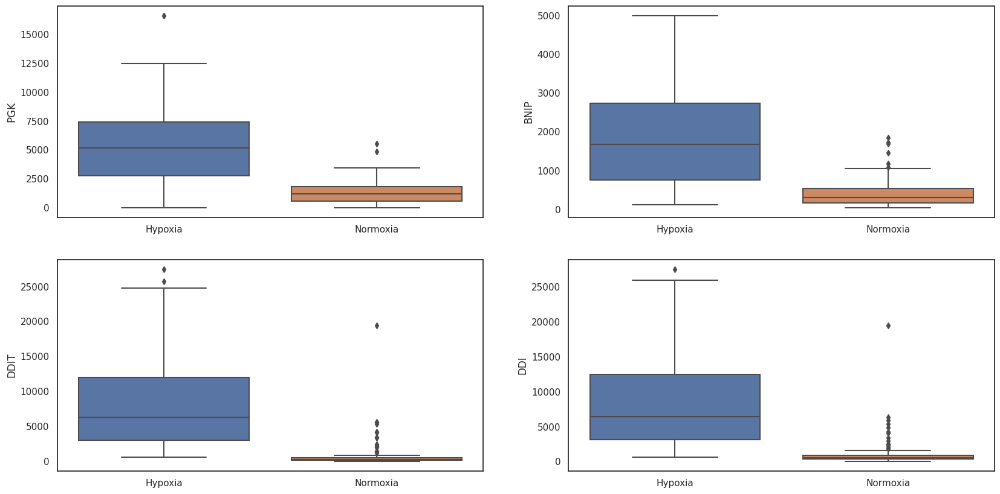

In [ ]:
fig,ax = plt.subplots(2, 2, figsize = (20,10))
k = 0
for i in range(2):
    for j in range(2):
       sns.boxplot([df_grouped_corr.iloc[k,:116], df_grouped_corr.iloc[k,116:]], ax = ax[i][j]) #116 is the shape (numb of hypoxic cells), so change it when changing the dataframe
       ax[i,j].set_xticks([0,1],['Hypoxia','Normoxia'])
       ax[i,j].set_ylabel(df_grouped_corr.index[k]) 
       k+=1

# Unsupervised Learning

In this section we will adopt unsupervised learning methods to further explore our data and find underlying patterns. 

### PCA

PCA (Principal Component Analysis) is a statistical procedure that uses orthogonal transformation to convert a set of observations of possibly correlated variables into a set of values of linearly uncorrelated variables known as principal components. The number of principal components is less than or equal to the number of original variables. 

We begin by rescaling our data in order to evaluate features on similar scales.

In [ ]:
from sklearn.preprocessing import StandardScaler
x = StandardScaler(with_mean=False).fit_transform(df_hcc_smart_train.T.apply(lambda x: np.log2(1+x)))

We apply PCA on our dataset.

Text(0, 0.5, 'Variance explained')

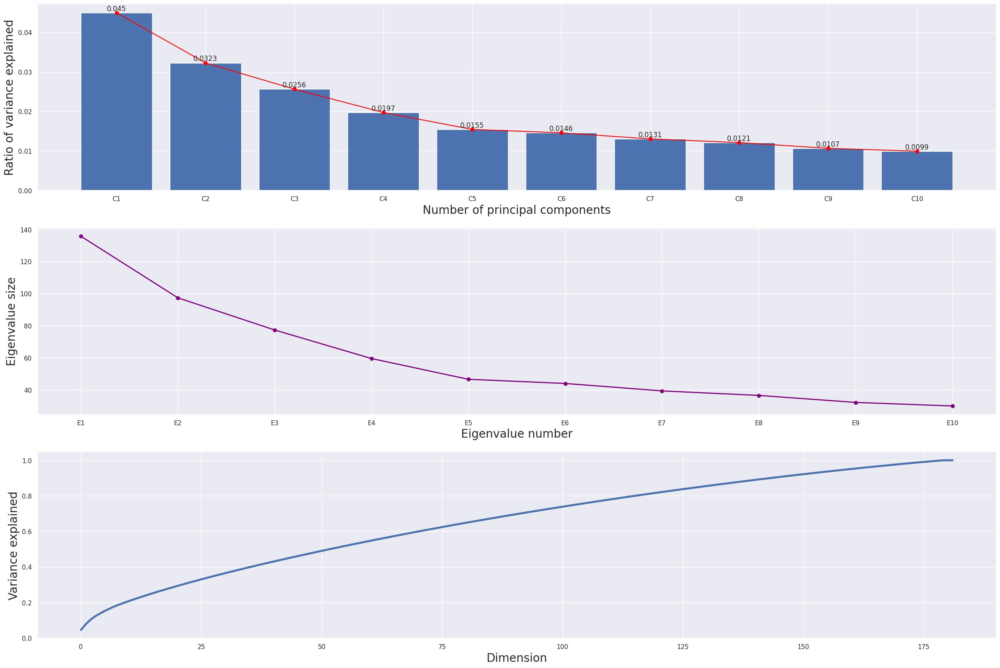

In [ ]:
from sklearn.decomposition import PCA

pca = PCA()
reduced = pca.fit_transform(x)
var_ratio = pca.explained_variance_ratio_
var_ratio_first = pca.explained_variance_ratio_[0:10]
lab0 = [f"C{i+1}" for i in range(10)]
fig,ax= plt.subplots(3,1,figsize=(30,20))

ax[0].bar(lab0,var_ratio_first)
rects = ax[0].patches
labels = var_ratio_first.round(4) 
for rect, label in zip(rects, labels):
    height = rect.get_height()
    ax[0].text(rect.get_x() + rect.get_width() / 2, height+0.0001, label,
            ha='center', va='bottom')
ax[0].plot([(rect.get_x() + rect.get_width() / 2) for rect in rects],var_ratio_first, color='Red', marker='o')
ax[0].set_xlabel('Number of principal components',fontsize=20)
ax[0].set_ylabel('Ratio of variance explained',fontsize=20)

lab1 = [f"E{i+1}" for i in range(10)]
ax[1].plot(lab1,pca.explained_variance_[0:10], marker='o',linewidth = 2,color='Purple')
ax[1].set_xlabel("Eigenvalue number",fontsize=20)
ax[1].set_ylabel("Eigenvalue size",fontsize=20)

cumulative = np.cumsum(var_ratio)
ax[2].plot(cumulative, linewidth = 3.5)
ax[2].set_xlabel('Dimension',fontsize=20)
ax[2].set_ylabel('Variance explained',fontsize=20)

We see that the first few components represent most of the variance of our dataset.

In [ ]:
pca = PCA(n_components=0.95)
red = pca.fit_transform(x)
red.shape

(182, 161)

Let's check the reconstruction mean square error of our PCA.

In [ ]:
from sklearn.metrics import mean_squared_error as mse
mse(pca.inverse_transform(red), x)

0.048833222597566665

In [ ]:
df_pca = pd.DataFrame(red, index=df_hcc_smart_train.columns, columns=[f'C{i+1}'for i in range(red.shape[1])])
df_pca

,C1,C2,C3,C4,C5,C6,C7,C8,C9,C10,...,C152,C153,C154,C155,C156,C157,C158,C159,C160,C161
output.STAR.PCRPlate1G12_Normoxia_S32_Aligned.sortedByCoord.out.bam,-2.837383,8.176826,-2.276625,5.715041,-4.280992,-8.950908,1.477321,-7.910201,6.059668,0.535211,...,1.176680,-1.415432,-1.548987,-0.769595,4.727009,-1.324649,-1.722088,1.632482,1.938879,-2.410463
output.STAR.PCRPlate1G1_Hypoxia_S102_Aligned.sortedByCoord.out.bam,5.495977,-12.768012,-3.005883,-10.713463,13.021329,-2.462059,-1.919142,-1.757633,0.615019,-3.869392,...,2.351690,-0.447678,6.130519,1.937219,-2.678231,2.638314,3.423988,-0.062363,2.503671,-2.651288
output.STAR.PCRPlate1G2_Hypoxia_S2_Aligned.sortedByCoord.out.bam,-0.924635,-5.456201,9.433591,-9.074497,5.357246,-3.236207,-4.258730,2.693919,-1.109246,-1.974924,...,-7.386146,1.656083,1.368029,0.933376,-2.355688,0.193482,2.603446,1.009994,-0.240994,-0.047020
output.STAR.PCRPlate1G3_Hypoxia_S7_Aligned.sortedByCoord.out.bam,2.862781,-10.080809,-7.009500,-1.695630,4.038668,-4.579361,2.026551,-1.487929,4.511024,8.698714,...,-0.645534,2.068330,-1.092031,2.731243,0.905786,-1.646639,1.358096,-0.539780,1.328168,1.287631
output.STAR.PCRPlate1G4_Hypoxia_S107_Aligned.sortedByCoord.out.bam,6.506928,0.384659,19.163531,-9.344595,-0.788865,-3.079751,5.243221,1.159407,-2.200784,-2.628923,...,-10.001156,-4.642193,-1.774366,-4.382179,0.224667,5.836415,3.904856,-1.170407,-5.156202,-5.725523
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
output.STAR.PCRPlate4H10_Normoxia_S210_Aligned.sortedByCoord.out.bam,-7.245707,-2.300265,-10.029292,5.086482,-2.583548,-1.532220,-4.036843,-4.444968,-3.145571,2.436943,...,-2.436257,-1.824985,-0.057904,-5.287038,4.436508,1.509687,0.805091,-0.013245,4.490840,2.748642
output.STAR.PCRPlate4H11_Normoxia_S214_Aligned.sortedByCoord.out.bam,-14.116134,-5.799054,-4.086392,11.018897,5.135416,-3.310325,-17.503442,4.968237,6.236285,-4.873069,...,0.030264,-0.758430,-0.547155,-2.374603,1.238258,0.532078,2.497170,2.019960,2.131375,1.229040
output.STAR.PCRPlate4H2_Hypoxia_S199_Aligned.sortedByCoord.out.bam,-5.989040,-8.419868,7.797179,-0.572046,-1.219821,-2.557698,-7.960108,0.372637,-2.767324,1.006812,...,0.858013,0.112174,0.863056,5.796647,2.520063,2.135834,1.534455,4.476253,0.273478,-7.478379
output.STAR.PCRPlate4H7_Normoxia_S205_Aligned.sortedByCoord.out.bam,-6.682577,3.897496,-3.926339,-0.738135,-2.280136,-4.562404,-3.262556,-2.794395,-4.485668,1.003560,...,2.311056,-0.599116,2.385715,1.753388,-1.415110,0.928432,1.118625,-3.201386,6.275250,-0.644585


We split our genes into hypoxic and normoxic.

In [ ]:
condition_hypo = np.array(['Hypoxia' in cell for cell in df_hcc_smart_train.columns])
condition_normo = np.array(['Normoxia' in cell for cell in df_hcc_smart_train.columns])

We want to visually check the separation of our data classes in the first two components of the PCA.

Text(0, 0.5, 'PC2')

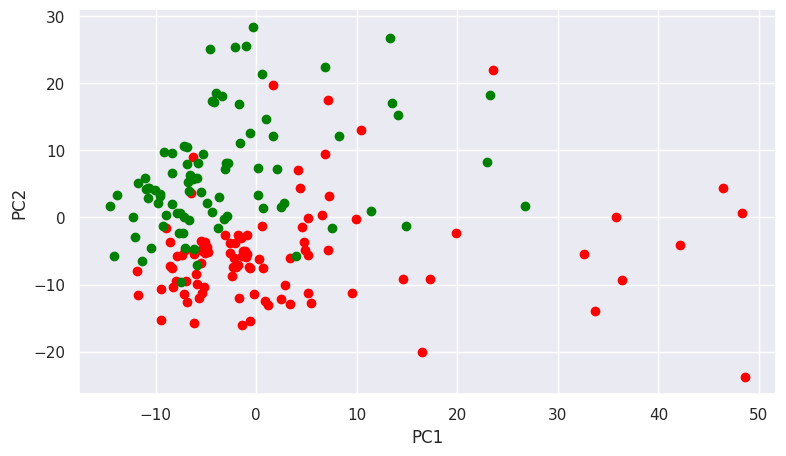

In [ ]:
#scatter for the first 2 components

hypo2 = df_pca[condition_hypo].iloc[:,:2]
normo2 = df_pca[condition_normo].iloc[:,:2]

fig,ax = plt.subplots(figsize=(9,5))
ax.scatter(hypo2.iloc[:, 0], hypo2.iloc[:, 1], color='red')
ax.scatter(normo2.iloc[:, 0], normo2.iloc[:, 1], color='green')
ax.set_xlabel('PC1')
ax.set_ylabel('PC2')

Repeat the graph, but in the three main components.

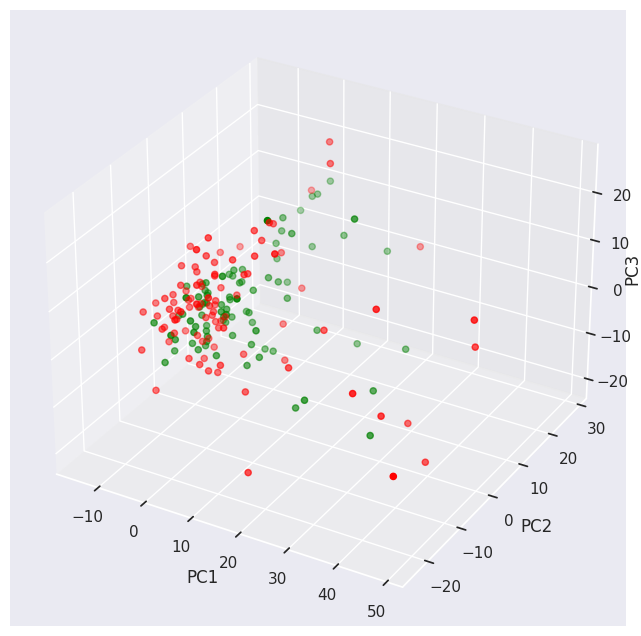

In [ ]:
#scatter of the first 3 components

hypo3 = df_pca[condition_hypo].iloc[:,:3]
normo3 = df_pca[condition_normo].iloc[:,:3]

fig = plt.figure(figsize=(10,8))
ax = fig.add_subplot(projection='3d')

ax.scatter(hypo3.iloc[:, 0], hypo3.iloc[:, 1], hypo3.iloc[:, 2], color='red')
ax.scatter(normo3.iloc[:, 0], normo3.iloc[:, 1], normo3.iloc[:, 2], color='green')
ax.set_xlabel('PC1')
ax.set_ylabel('PC2')
ax.set_zlabel('PC3',rotation=90)
ax.zaxis.labelpad=-3

### Other forms of dimensionality reduction

#### t-SNE

The first one we decided to try is t-SNE. In simple terms, PCA works on retaining only global variance, and thus retaining local variance was the motivation behind t-SNE.
t-SNE is a nonlinear dimensionality reduction technique that is well suited for embedding high dimension data into lower dimensional data (2D or 3D) for data visualization.

STEPS: 

1. t-SNE constructs a probability distribution on pairs in higher dimensions such that similar objects are assigned a higher probability and dissimilar objects are assigned lower probability.

2. Then, t-SNE replicates the same probability distribution on lower dimensions iteratively till the Kullback-Leibler divergence is minimized.

In [ ]:
# t-SNE 2 components

from sklearn.manifold import TSNE
pca = PCA(n_components=2)
red = pca.fit_transform(x)
def tsne_pca_rs(c,r):
    tsne = TSNE(n_components=c, init='random', random_state = r)
    red_tsne = tsne.fit_transform(red)
    df_tsne = pd.DataFrame(red_tsne, index=df_hcc_smart_train.columns, columns=[f'T{i+1}'for i in range(c)])
    return df_tsne

Since our dataset, as we could see during PCA, is not regularly separable, our results change a lot based on which random state we give to the function. So, we decided to iteratively compute a score (which we defined as the silhouette score when trying to group the point found by t-SNE in two clusters with KMeans algorithm) on different random states, and then find the best random state, i.e. the one that maximizes that score.

In [ ]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
# computing the best random state to initialize tsne

silhouette_scores = []
for i in range(20,50):
    df_tsne = tsne_pca_rs(2,i)
    k_kmeans = KMeans(n_clusters=2, n_init=100, random_state=42).fit(df_tsne)
    silhouette_scores.append(silhouette_score(x, k_kmeans.labels_))
    best_ind_2 = silhouette_scores.index(max(silhouette_scores))
print(max(silhouette_scores), "Random state:", best_ind_2)

0.01710095513731582 Random state: 13


Text(0, 0.5, 't-SNE2')

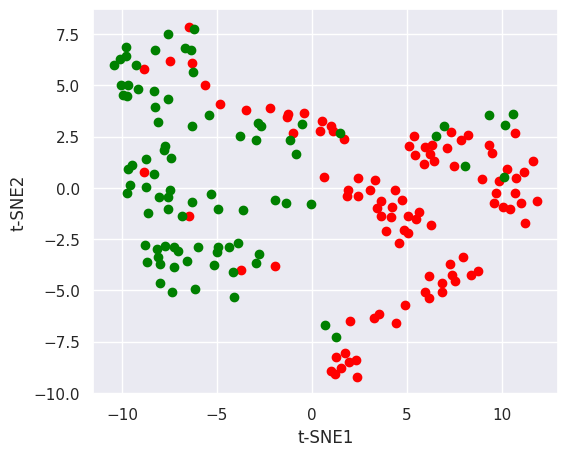

In [ ]:
fig,ax = plt.subplots(figsize=(6,5))

#plotting tsne with the best random state found

df_tsne = tsne_pca_rs(2,20+best_ind_2)
hypo2 = df_tsne[condition_hypo].iloc[:,:2]
normo2 = df_tsne[condition_normo].iloc[:,:2]
ax.scatter(hypo2.iloc[:, 0], hypo2.iloc[:, 1], color='red')
ax.scatter(normo2.iloc[:, 0], normo2.iloc[:, 1], color='green')
ax.set_xlabel('t-SNE1')
ax.set_ylabel('t-SNE2')

In [ ]:
#same in 3 dimensions

silhouette_scores = []
for i in range(20,50):
    df_tsne = tsne_pca_rs(3,i)
    k_kmeans = KMeans(n_clusters=2, n_init=100, random_state=42).fit(df_tsne)
    silhouette_scores.append(silhouette_score(x, k_kmeans.labels_))
    best_ind_3 = silhouette_scores.index(max(silhouette_scores))
print(max(silhouette_scores), "Random state:", best_ind_3)


0.018436362015922535 Random state: 6


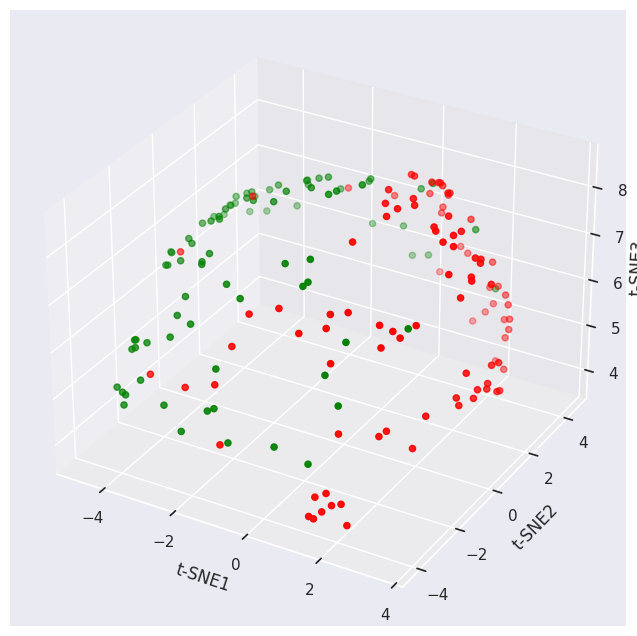

In [ ]:
#scatter of the first 3 components
#1,37,51
df_tsne = tsne_pca_rs(3,20+best_ind_3)
fig = plt.figure(figsize=(20,8))
ax = fig.add_subplot(1,1,1,projection='3d')
hypo3 = df_tsne[condition_hypo].iloc[:,:3]
normo3 = df_tsne[condition_normo].iloc[:,:3]
ax.scatter(hypo3.iloc[:, 0], hypo3.iloc[:, 1], hypo3.iloc[:, 2], color='red')
ax.scatter(normo3.iloc[:, 0], normo3.iloc[:, 1], normo3.iloc[:, 2], color='green')
ax.set_xlabel('t-SNE1')
ax.set_ylabel('t-SNE2')
ax.set_zlabel('t-SNE3',rotation=90)
ax.zaxis.labelpad=-0.7


#### UMAP

As a last method we tried UMAP. UMAP, at its core, works very similarly to t-SNE - both use graph layout algorithms to arrange data in low-dimensional space. In the simplest sense, UMAP constructs a high dimensional graph representation of the data then optimizes a low-dimensional graph to be as structurally similar as possible.

In [ ]:
#pip install umap-learn

In [ ]:
#umap dimensionality reduction

import umap.umap_ as umap

um = umap.UMAP(n_components = 2)
red_um = um.fit_transform(x)

In [ ]:
df_umap = pd.DataFrame(red_um, index=df_hcc_smart_train.columns, columns=[f'C{i+1}'for i in range(red_um.shape[1])])
df_umap

,C1,C2
output.STAR.PCRPlate1G12_Normoxia_S32_Aligned.sortedByCoord.out.bam,8.358377,5.297237
output.STAR.PCRPlate1G1_Hypoxia_S102_Aligned.sortedByCoord.out.bam,8.439142,7.905765
output.STAR.PCRPlate1G2_Hypoxia_S2_Aligned.sortedByCoord.out.bam,8.318515,8.369409
output.STAR.PCRPlate1G3_Hypoxia_S7_Aligned.sortedByCoord.out.bam,10.553017,7.684495
output.STAR.PCRPlate1G4_Hypoxia_S107_Aligned.sortedByCoord.out.bam,8.265095,9.097548
...,...,...
output.STAR.PCRPlate4H10_Normoxia_S210_Aligned.sortedByCoord.out.bam,9.131741,6.417980
output.STAR.PCRPlate4H11_Normoxia_S214_Aligned.sortedByCoord.out.bam,10.259719,5.940604
output.STAR.PCRPlate4H2_Hypoxia_S199_Aligned.sortedByCoord.out.bam,9.253693,7.081880
output.STAR.PCRPlate4H7_Normoxia_S205_Aligned.sortedByCoord.out.bam,9.412083,6.363140


Text(0, 0.5, 'Umap-C2')

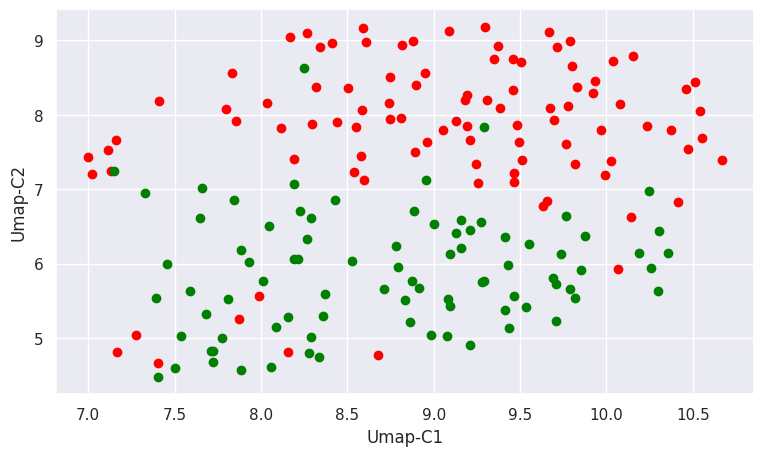

In [ ]:
hypo_um = df_umap[condition_hypo].iloc[:,:2]
normo_um = df_umap[condition_normo].iloc[:,:2]

fig,ax = plt.subplots(figsize=(9,5))
ax.scatter(hypo_um.iloc[:, 0], hypo_um.iloc[:, 1], color='red')
ax.scatter(normo_um.iloc[:, 0], normo_um.iloc[:, 1], color='green')
ax.set_xlabel('Umap-C1')
ax.set_ylabel('Umap-C2')

In [ ]:
# umap 3 components

um = umap.UMAP(n_components = 3)
red_um = um.fit_transform(x)

In [ ]:
df_umap = pd.DataFrame(red_um, index=df_hcc_smart_train.columns, columns=[f'C{i+1}'for i in range(red_um.shape[1])])
df_umap

,C1,C2,C3
output.STAR.PCRPlate1G12_Normoxia_S32_Aligned.sortedByCoord.out.bam,6.151119,4.622397,2.197438
output.STAR.PCRPlate1G1_Hypoxia_S102_Aligned.sortedByCoord.out.bam,3.737686,5.196613,3.810413
output.STAR.PCRPlate1G2_Hypoxia_S2_Aligned.sortedByCoord.out.bam,4.463982,4.535545,4.862823
output.STAR.PCRPlate1G3_Hypoxia_S7_Aligned.sortedByCoord.out.bam,4.649630,5.014355,4.380430
output.STAR.PCRPlate1G4_Hypoxia_S107_Aligned.sortedByCoord.out.bam,5.439667,4.689739,5.005015
...,...,...,...
output.STAR.PCRPlate4H10_Normoxia_S210_Aligned.sortedByCoord.out.bam,4.878123,4.479662,2.865003
output.STAR.PCRPlate4H11_Normoxia_S214_Aligned.sortedByCoord.out.bam,4.544313,4.418033,2.332796
output.STAR.PCRPlate4H2_Hypoxia_S199_Aligned.sortedByCoord.out.bam,5.060170,4.111310,3.748123
output.STAR.PCRPlate4H7_Normoxia_S205_Aligned.sortedByCoord.out.bam,4.975882,4.846450,2.661264


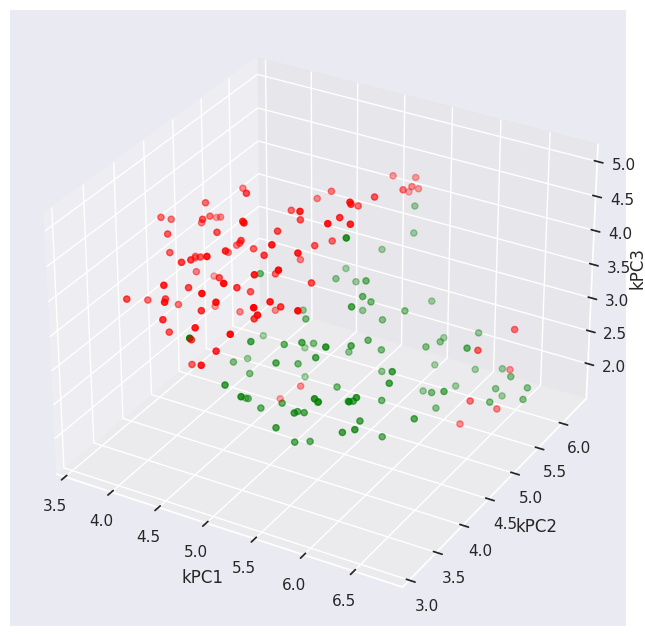

In [ ]:
hypo_um = df_umap[condition_hypo].iloc[:,:3]
normo_um = df_umap[condition_normo].iloc[:,:3]

fig = plt.figure(figsize=(10,8))
ax = fig.add_subplot(projection='3d')

ax.scatter(hypo_um.iloc[:, 0], hypo_um.iloc[:, 1], hypo_um.iloc[:, 2], color='red')
ax.scatter(normo_um.iloc[:, 0], normo_um.iloc[:, 1], normo_um.iloc[:, 2], color='green')
ax.set_xlabel('kPC1')
ax.set_ylabel('kPC2')
ax.set_zlabel('kPC3',rotation=90)
ax.zaxis.labelpad=-0.7

### Agglomerative clustering

Now we try agglomerative clustering to better visualize the data. We plot the cells profiles across genes using the log-transformed and PCA-reduced train data which is better for identifying important patterns. First, we visualize the results using dendograms (ward, complete, average, and single linkage methods).

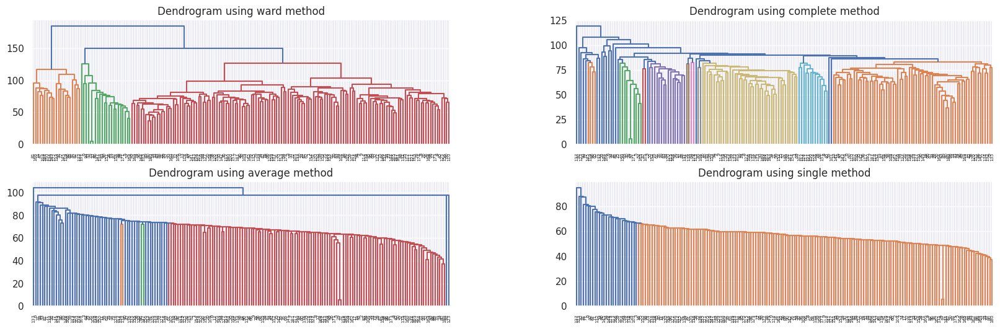

In [ ]:

from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import scipy.cluster.hierarchy as shc

sys.setrecursionlimit(10000)

fig, ax = plt.subplots( 2, 2, figsize = (20,6))
sns.set_style("white")
fig.subplots_adjust(hspace=0.3, wspace=0.3)

models = ["ward","complete","average","single"]

for i, model in enumerate(models):
    row = i // 2
    col = i % 2
    ax[row][col].set_title(f"Dendrogram using {model} method")
    clusters = shc.linkage(df_pca, method=model, metric="euclidean")
    shc.dendrogram(Z=clusters, ax=ax[row][col])


The single and average linkage clustering don't show any clear clusters, they just merged the cells together one by one. Instead, complete and ward linkage found some visible clusters. Especially those found by ward seem particularly clean.                                                                      Single and average linkage methods are more sensitive to noise and outliers which could lead to a chaining effect. Moreover, these methods can struggle with clusters of different shapes (non-convex) and densities, while complete and ward linkage methods are better suited for handling such cases. 

The number of clusters can be roughly deduced from the first dendogram plotted above but we want to precisely determine the optimal number of clusters for a given dataset in order to achieve the best clustering results. To do so we use the elbow method and silhouette method.

The elbow method involves plotting the explained variation (within-cluster sum of squares) as a function of the number of clusters. As the number of clusters increases, the explained variation typically decreases. The optimal number of clusters is chosen at the point where the rate of decrease sharply rises. The idea is to find a balance between minimizing the within-cluster sum of squares and not overfitting the data with too many clusters.

The within cluster sum of squares for 1 clusters is 519337.06
The within cluster sum of squares for 2 clusters is 501244.33
The within cluster sum of squares for 3 clusters is 493657.51
The within cluster sum of squares for 4 clusters is 483825.87
The within cluster sum of squares for 5 clusters is 481968.04
The within cluster sum of squares for 6 clusters is 473842.52
The within cluster sum of squares for 7 clusters is 469760.43
The within cluster sum of squares for 8 clusters is 473666.22
The within cluster sum of squares for 9 clusters is 461903.21
The within cluster sum of squares for 10 clusters is 459085.73


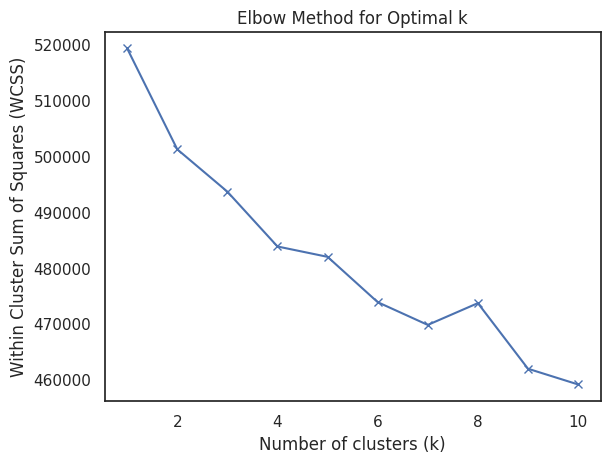

In [ ]:
from sklearn.cluster import KMeans
import scipy.cluster.hierarchy as hier
from sklearn.mixture import GaussianMixture

wcss = {} 
for i in range(1,11):
  kmeans = KMeans(n_clusters=i, random_state=0, n_init = 10 ).fit(df_pca)
  #Sum of squared distances of samples to their closest cluster center.
  wcss[i] = (kmeans.inertia_)
  print(f'The within cluster sum of squares for {i} clusters is {wcss[i]:.2f}')

plt.plot(list(wcss.keys()), list(wcss.values()), 'bx-')
plt.xlabel('Number of clusters (k)')
plt.ylabel('Within Cluster Sum of Squares (WCSS)')
plt.title('Elbow Method for Optimal k')
plt.show()

From the visualization, we can see that the biggest decrease in within cluster sum of squares happens at 2 clusters, and there is a relatively large decrease from 2 to 3 clusters. 

As described before, the silhouette method is a technique used in cluster analysis to assess the quality of clustering results, specifically how well the data points within a cluster are grouped and separated from other clusters. It is a measure of cohesion and separation that provides a single score, the silhouette coefficient, to evaluate the clustering performance. A high positive silhouette score indicates that the data point is well-matched to its own cluster and poorly matched to neighboring clusters, suggesting a good clustering. 


The silhouette score for 2 clusters is 0.122
The silhouette score for 3 clusters is 0.016
The silhouette score for 4 clusters is 0.009
The silhouette score for 5 clusters is -0.027
The silhouette score for 6 clusters is -0.002
The silhouette score for 7 clusters is -0.012
The silhouette score for 8 clusters is -0.005
The silhouette score for 9 clusters is -0.007
The silhouette score for 10 clusters is 0.005


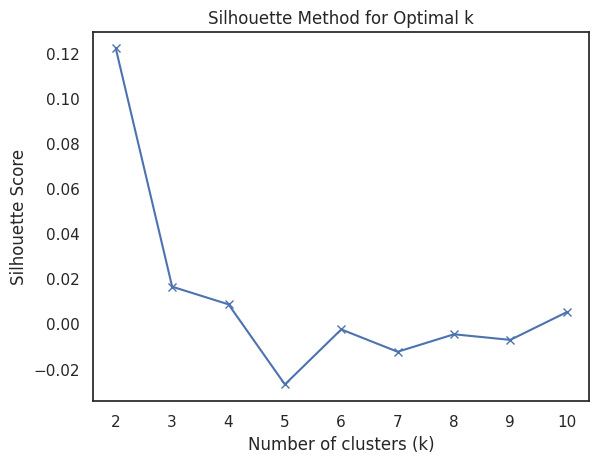

In [ ]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

s_score = {} 

for i in range(2, 11):
    # Fit kmeans clustering model for each cluster number
    kmeans = KMeans(n_clusters=i, random_state=0, n_init=10).fit(df_pca)

    classes = kmeans.predict(df_pca)
    # Calculate Silhouette score
    s_score[i] = (silhouette_score(df_pca, classes)) 
    print(f'The silhouette score for {i} clusters is {s_score[i]:.3f}')

plt.plot(list(s_score.keys()), list(s_score.values()), 'bx-')
plt.xlabel('Number of clusters (k)')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Method for Optimal k')
plt.show()


From the visualization, we can see that the model with 2 clusters has the highest value of Silhouette score, and the model with 3 clusters has the 2nd highest value, so we get the consistent result that there are 2 or 3 clusters.

Next, using the optimal number of clusters found before, we show the clusters using agglomerative clustering, k means and spectral clustering both in 2D and 3D.

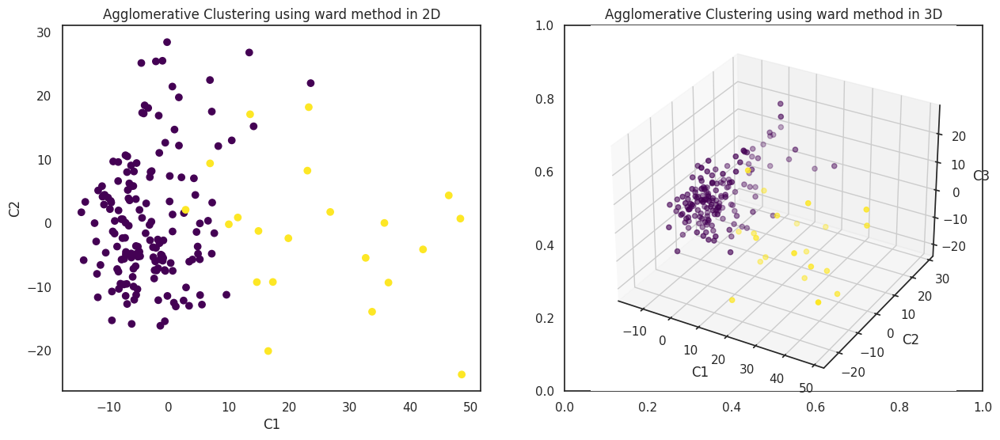

In [ ]:

from sklearn.cluster import AgglomerativeClustering
from scipy.spatial.distance import pdist, squareform
from mpl_toolkits.mplot3d import Axes3D

# Choose the optimal number of clusters 
n_clusters = 2

# Choose the linkage method based on the dendrogram
linkage_method = "ward"

# Initialize and fit the Agglomerative Clustering model
agg_clustering = AgglomerativeClustering(n_clusters=n_clusters, metric='euclidean', linkage=linkage_method)
cluster_labels = agg_clustering.fit_predict(df_pca)

# Create subplots for 2D and 3D visualizations
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))

# Visualize the clusters in 2D
ax1.scatter(df_pca['C1'], df_pca['C2'], c=cluster_labels, cmap='viridis')
ax1.set_xlabel('C1')
ax1.set_ylabel('C2')
ax1.set_title(f'Agglomerative Clustering using {linkage_method} method in 2D')

# Visualize the clusters in 3D
ax2 = fig.add_subplot(122, projection='3d')
ax2.scatter(df_pca['C1'], df_pca['C2'], df_pca['C3'], c=cluster_labels, cmap='viridis')
ax2.set_xlabel('C1')
ax2.set_ylabel('C2')
ax2.set_zlabel('C3')
ax2.set_title(f'Agglomerative Clustering using {linkage_method} method in 3D')

plt.show()


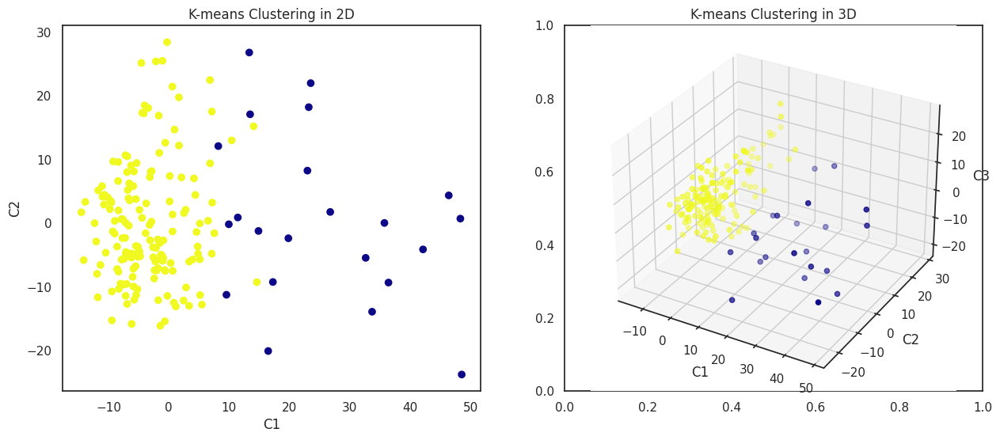

In [ ]:

from sklearn.cluster import KMeans

from mpl_toolkits.mplot3d import Axes3D

# Choose the optimal number of clusters 
n_clusters = 2

# Initialize and fit the KMeans model
kmeans = KMeans(n_clusters=n_clusters, random_state=0, n_init=10)
kmeans.fit(df_pca)

# Get the cluster labels
cluster_labels = kmeans.labels_

# Create subplots for 2D and 3D visualizations
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))

# Visualize the clusters in 2D
ax1.scatter(df_pca['C1'], df_pca['C2'], c=cluster_labels, cmap='plasma')
ax1.set_xlabel('C1')
ax1.set_ylabel('C2')
ax1.set_title('K-means Clustering in 2D')

# Visualize the clusters in 3D
ax2 = fig.add_subplot(122, projection='3d')
ax2.scatter(df_pca['C1'], df_pca['C2'], df_pca['C3'], c=cluster_labels, cmap='plasma')
ax2.set_xlabel('C1')
ax2.set_ylabel('C2')
ax2.set_zlabel('C3')
ax2.set_title('K-means Clustering in 3D')

plt.show()


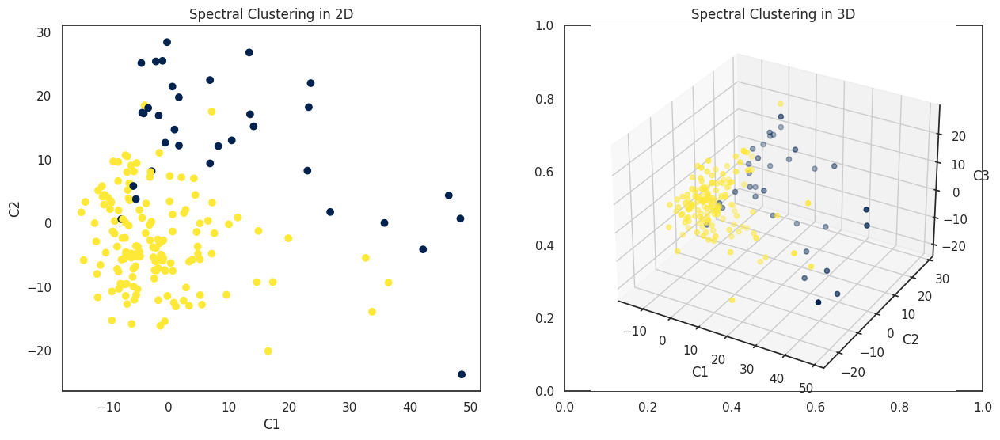

In [ ]:

from sklearn.cluster import SpectralClustering
from mpl_toolkits.mplot3d import Axes3D

# Choose the optimal number of clusters
n_clusters = 2

# Initialize and fit the Spectral Clustering model
spectral_clustering = SpectralClustering(n_clusters=n_clusters, affinity='nearest_neighbors', random_state=0)
cluster_labels = spectral_clustering.fit_predict(df_pca)

# Create subplots for 2D and 3D visualizations
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))

# Visualize the clusters in 2D
ax1.scatter(df_pca['C1'], df_pca['C2'], c=cluster_labels, cmap='cividis')
ax1.set_xlabel('C1')
ax1.set_ylabel('C2')
ax1.set_title('Spectral Clustering in 2D')

# Visualize the clusters in 3D
ax2 = fig.add_subplot(122, projection='3d')
ax2.scatter(df_pca['C1'], df_pca['C2'], df_pca['C3'], c=cluster_labels, cmap='cividis')
ax2.set_xlabel('C1')
ax2.set_ylabel('C2')
ax2.set_zlabel('C3')
ax2.set_title('Spectral Clustering in 3D')

plt.show()


The clustering of the cells profiles across genes is approximately the same using all the three methods used above therefore we can deduce that these are accurate plots to achieve the best clustering results.

Now we will use the correlation-based distance to cluster the data. This distance is commonly used in gene expression data analysis because it provides a measure of the similarity between gene expression patterns across different samples. To do so we consider the train dataframe without transposing it, therefore considering the gene expressions across cells. First we log-transform the data and decrease the dimension of the cells using PCA as we did before.

In [ ]:
from sklearn.preprocessing import StandardScaler

x = StandardScaler(with_mean=False).fit_transform(df_hcc_smart_train.apply(lambda x: np.log2(1+x)))
pca = PCA(n_components=0.95)
red = pca.fit_transform(x)
red.shape


(3000, 110)

In [ ]:
df_pca_corr = pd.DataFrame(red, index=df_hcc_smart_train.T.columns, columns=[f'C{i}' for i in range(110)])
df_pca_corr

,C0,C1,C2,C3,C4,C5,C6,C7,C8,C9,...,C100,C101,C102,C103,C104,C105,C106,C107,C108,C109
DDIT4,32.224402,5.806736,6.433385,-3.402004,-3.870499,0.647127,1.081253,1.328827,-0.640981,-1.775323,...,0.120619,-0.536889,0.232900,0.494464,0.354195,-0.106043,-0.449316,0.066290,0.244249,-0.355333
ANGPTL4,19.250937,6.586392,10.705339,-3.859996,-4.754099,2.623865,3.590621,-0.902558,-1.996680,-1.472576,...,-0.308341,-0.960824,1.122656,-0.329939,-1.424828,-0.350618,0.110653,-0.074115,0.322549,-0.522139
CALML5,4.992276,5.136425,-5.291888,-0.934305,-2.164917,3.838124,0.802021,-1.914341,-0.746133,-3.130692,...,0.525716,1.438411,0.954592,-1.175647,1.172699,-1.107154,1.425035,-0.462492,-0.385589,-0.000607
KRT14,18.832142,3.086883,-0.780937,4.705460,2.909566,-0.217971,3.342236,-1.137717,-0.095063,-0.945978,...,0.964694,-0.361281,0.453322,0.052814,-2.113413,0.107482,-0.318716,0.233978,0.664943,0.705137
CCNB1,22.823480,-6.207292,-3.580959,0.024403,-5.963377,-3.720301,0.236877,-2.920957,-0.478117,-0.315614,...,-0.054828,0.163579,-0.481779,-0.087390,-0.521102,-0.121705,0.891348,-0.187524,-0.498695,-0.921378
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
LINC02693,8.228787,-1.749804,1.179943,-0.072512,4.494502,-1.739871,-1.373133,1.197728,-1.501281,0.494197,...,-1.603223,-0.019876,-0.946293,-0.052157,0.124770,0.203911,1.024092,0.519004,0.067514,-0.950818
OR8B9P,-7.564615,-0.400582,0.049364,0.505579,-0.330853,0.313866,0.070692,-0.090373,0.095013,-0.088387,...,-0.008067,-0.066041,0.041735,0.086768,0.038217,-0.089290,0.077699,0.155937,0.008184,0.099816
NEAT1,14.833854,2.646344,1.030553,1.719790,-0.998696,-0.132431,-0.667090,0.516478,0.319373,-0.208477,...,-0.192845,-0.525458,-0.056257,0.160390,-0.080433,0.759745,-0.175143,-0.146081,-0.291019,-0.356126
ZDHHC23,-2.060455,-0.641728,0.376975,-1.074919,1.656703,0.786407,-0.455017,1.313058,0.223238,0.838614,...,1.035804,0.279640,0.949719,2.793696,0.020711,0.005798,0.590601,-0.634652,0.898132,0.181939


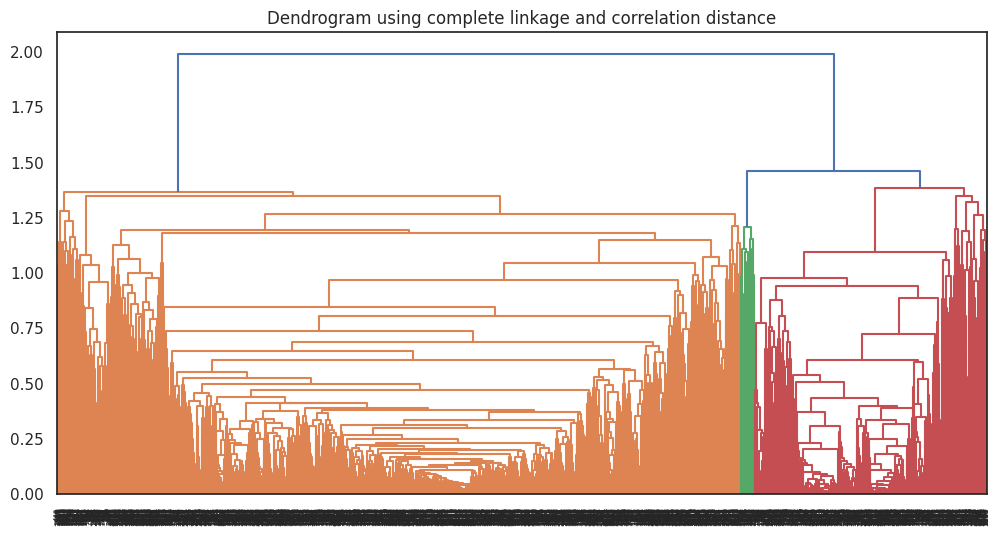

In [ ]:

import scipy.cluster.hierarchy as shc
from scipy.spatial.distance import pdist
sys.setrecursionlimit(10000)

plt.figure(figsize=(12, 6))
# Calculate the distance matrix using the correlation as distance measure
corr_distance_matrix = pdist(df_pca_corr, metric='correlation')

# Compute the linkage matrix using the precomputed distance matrix and the average linkage method
clusters = shc.linkage(corr_distance_matrix, method='complete', metric='precomputed')

# Plot the dendrogram
plt.title("Dendrogram using complete linkage and correlation distance")
shc.dendrogram(Z=clusters) 
plt.show()

This approach is used for analyzing gene expression data, as it captures the similarity between gene expression patterns across different samples. The hierarchical clustering shown above reveals relationships between the samples based on these patterns. This method found some visible clusters. 

Next, we apply the same techniques as before to find the optimal number of clusters.

The within cluster sum of squares for 1 clusters is 518916.19
The within cluster sum of squares for 2 clusters is 179619.25
The within cluster sum of squares for 3 clusters is 143420.54
The within cluster sum of squares for 4 clusters is 130907.26
The within cluster sum of squares for 5 clusters is 123635.65
The within cluster sum of squares for 6 clusters is 119624.28
The within cluster sum of squares for 7 clusters is 116555.70
The within cluster sum of squares for 8 clusters is 113864.91
The within cluster sum of squares for 9 clusters is 112120.08
The within cluster sum of squares for 10 clusters is 110726.81


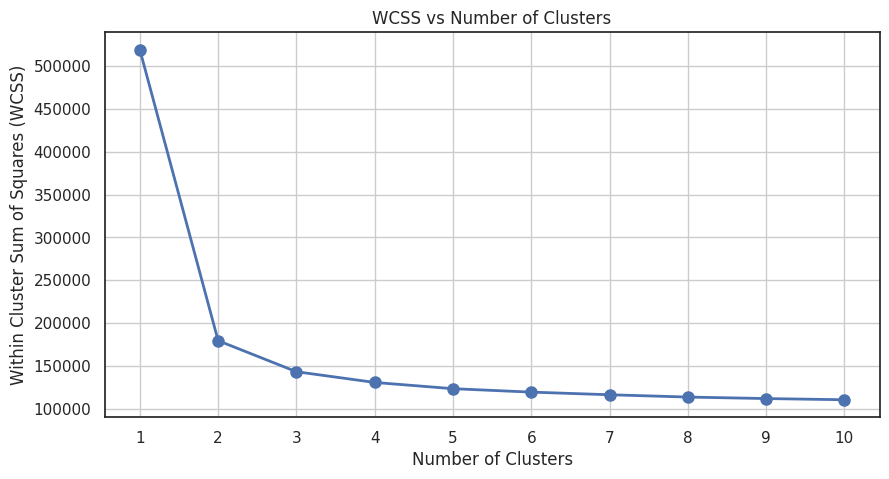

In [ ]:
from sklearn.cluster import KMeans
import scipy.cluster.hierarchy as hier
from sklearn.mixture import GaussianMixture
from sklearn.metrics import silhouette_score


wcss = {} 
for i in range(1,11):

  kmeans = KMeans(n_clusters=i, random_state=0, n_init = 10).fit(df_pca_corr)
  #Sum of squared distances of samples to their closest cluster center.
  wcss[i] = (kmeans.inertia_)
  print(f'The within cluster sum of squares for {i} clusters is {wcss[i]:.2f}')

x = list(wcss.keys())
y = list(wcss.values())

plt.figure(figsize=(10, 5))
plt.plot(x, y, marker='o', linestyle='-', linewidth=2, markersize=8)
plt.xlabel('Number of Clusters')
plt.ylabel('Within Cluster Sum of Squares (WCSS)')
plt.title('WCSS vs Number of Clusters')
plt.xticks(x)
plt.grid(True)
plt.show()



We can see that the biggest decrease in within cluster sum of squares happens at 2 clusters so we choose 2 as our number of clusters. 

The silhouette score for 2 clusters is 0.656
The silhouette score for 3 clusters is 0.567
The silhouette score for 4 clusters is 0.487
The silhouette score for 5 clusters is 0.373
The silhouette score for 6 clusters is 0.330
The silhouette score for 7 clusters is 0.332
The silhouette score for 8 clusters is 0.261
The silhouette score for 9 clusters is 0.267
The silhouette score for 10 clusters is 0.261


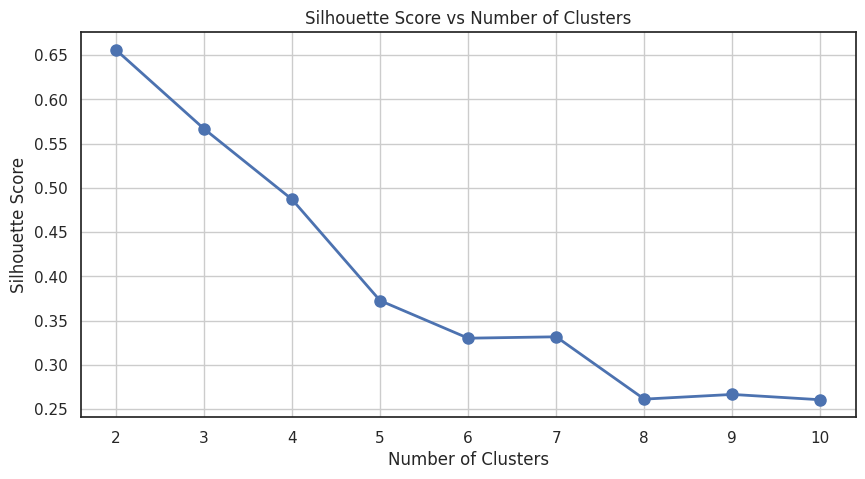

In [ ]:

s_score = {} 

for i in range(2,11): # Note that the minimum number of clusters is 2
  # Fit kmeans clustering model for each cluster number
  kmeans = KMeans(n_clusters=i, random_state=0, n_init = 10).fit(df_pca_corr)

  classes = kmeans.predict(df_pca_corr)
 
  s_score[i] = (silhouette_score(df_pca_corr, classes)) 

  print(f'The silhouette score for {i} clusters is {s_score[i]:.3f}') 

x = list(s_score.keys())
y = list(s_score.values())

# Create the plot
plt.figure(figsize=(10, 5))
plt.plot(x, y, marker='o', linestyle='-', linewidth=2, markersize=8)
plt.xlabel('Number of Clusters')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Score vs Number of Clusters')
plt.xticks(x)
plt.grid(True)
plt.show()


As before, we can see that the model with 2 clusters has the highest value of Silhouette score, and the model with 3 clusters has the 2nd highest value, so we get the consistent result that there are 2 or 3 clusters.


Now we actually use this results and cluster the data.

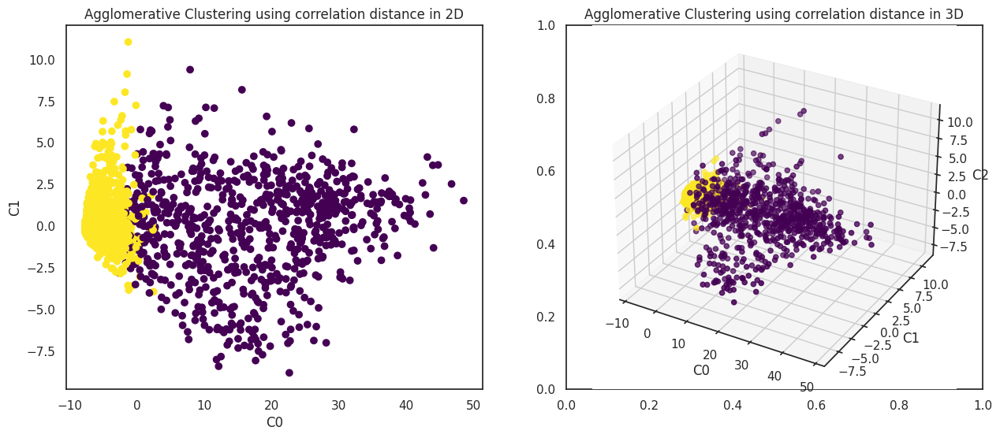

In [ ]:

from sklearn.cluster import AgglomerativeClustering

from scipy.spatial.distance import pdist, squareform


# Choose the optimal number of clusters 
n_clusters = 2

# Choose the linkage method based on the dendrogram
linkage_method = "complete"
corr_distance_matrix = pdist(df_pca_corr, metric='correlation')
square_corr_distance_matrix = squareform(corr_distance_matrix)

# Initialize and fit the Agglomerative Clustering model
agg_clustering = AgglomerativeClustering(n_clusters=n_clusters, metric='precomputed', linkage=linkage_method)
cluster_labels = agg_clustering.fit_predict(square_corr_distance_matrix)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))

# Visualize the clusters in 2D
ax1.scatter(df_pca_corr['C0'], df_pca_corr['C1'], c=cluster_labels, cmap='viridis')
ax1.set_xlabel('C0')
ax1.set_ylabel('C1')
ax1.set_title(f'Agglomerative Clustering using correlation distance in 2D')


# Visualize the clusters in 3D
ax2 = fig.add_subplot(122, projection='3d')
ax2.scatter(df_pca_corr['C0'], df_pca_corr['C1'], df_pca_corr['C2'], c=cluster_labels, cmap='viridis')
ax2.set_xlabel('C0')
ax2.set_ylabel('C1')
ax2.set_zlabel('C2')
ax2.set_title(f'Agglomerative Clustering using correlation distance in 3D')
plt.show()



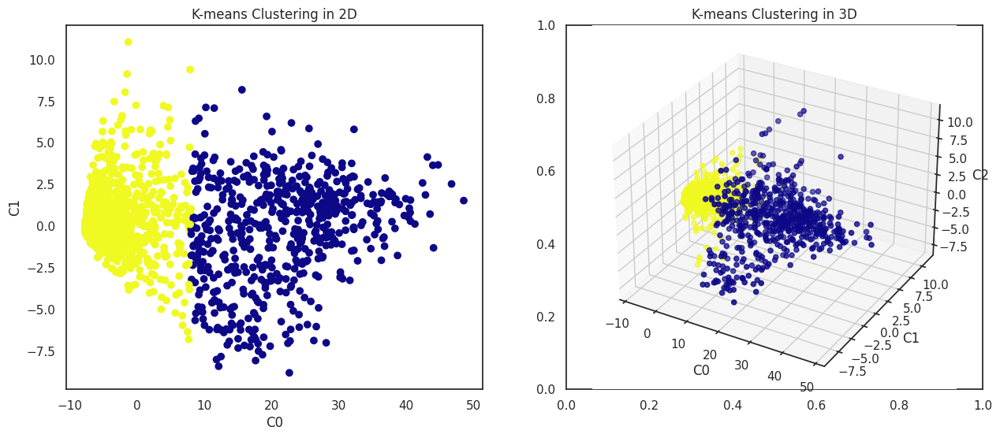

In [ ]:

from sklearn.cluster import KMeans
from mpl_toolkits.mplot3d import Axes3D

# Choose the optimal number of clusters 
n_clusters = 2

# Initialize and fit the KMeans model
kmeans = KMeans(n_clusters=n_clusters, random_state=0, n_init=10)
kmeans.fit(df_pca_corr)

# Get the cluster labels
cluster_labels = kmeans.labels_

# Create subplots for 2D and 3D visualizations
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))

# Visualize the clusters in 2D
ax1.scatter(df_pca_corr['C0'], df_pca_corr['C1'], c=cluster_labels, cmap='plasma')
ax1.set_xlabel('C0')
ax1.set_ylabel('C1')
ax1.set_title('K-means Clustering in 2D')

# Visualize the clusters in 3D
ax2 = fig.add_subplot(122, projection='3d')
ax2.scatter(df_pca_corr['C0'], df_pca_corr['C1'], df_pca_corr['C2'], c=cluster_labels, cmap='plasma')
ax2.set_xlabel('C0')
ax2.set_ylabel('C1')
ax2.set_zlabel('C2')
ax2.set_title('K-means Clustering in 3D')

plt.show()


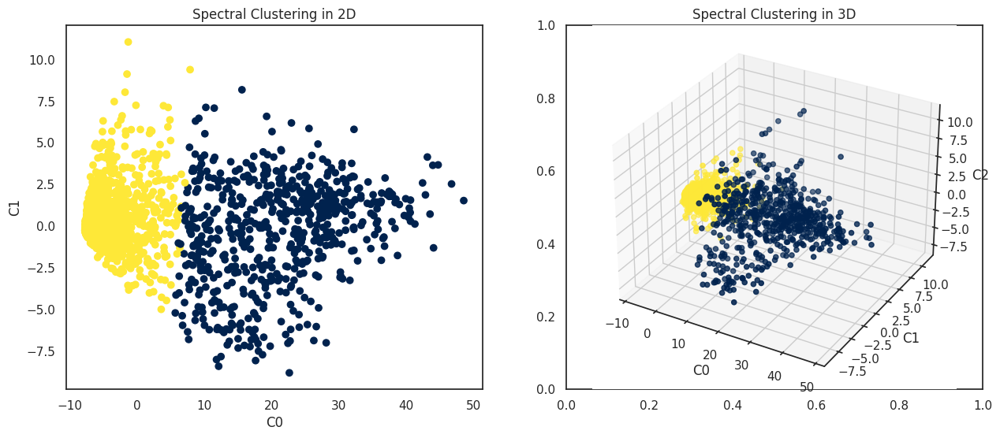

In [ ]:

from sklearn.cluster import SpectralClustering

from mpl_toolkits.mplot3d import Axes3D

# Choose the optimal number of clusters
n_clusters = 2

# Initialize and fit the Spectral Clustering model
spectral_clustering = SpectralClustering(n_clusters=n_clusters, affinity='nearest_neighbors', random_state=0)
cluster_labels = spectral_clustering.fit_predict(df_pca_corr)

# Create subplots for 2D and 3D visualizations
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))

# Visualize the clusters in 2D
ax1.scatter(df_pca_corr['C0'], df_pca_corr['C1'], c=cluster_labels, cmap='cividis')
ax1.set_xlabel('C0')
ax1.set_ylabel('C1')
ax1.set_title('Spectral Clustering in 2D')

# Visualize the clusters in 3D
ax2 = fig.add_subplot(122, projection='3d')
ax2.scatter(df_pca_corr['C0'], df_pca_corr['C1'], df_pca_corr['C2'], c=cluster_labels, cmap='cividis')
ax2.set_xlabel('C0')
ax2.set_ylabel('C1')
ax2.set_zlabel('C2')
ax2.set_title('Spectral Clustering in 3D')

plt.show()


The clustering of the gene expression across cells using correlation-based distance to cluster the data is approximately the same using all the three methods described before; therefore we can deduce that these are accurate plots to achieve the best clustering results.

#### Heatmap visualization

We now use agglomerative clustering to cluster genes and cells and reorder them in a way that data points that are the most similar to each other are grouped together.

In [ ]:
from sklearn.cluster import AgglomerativeClustering

df = df_hcc_smart_train.transpose()

cluster_cells = AgglomerativeClustering().fit(df)
cluster_genes =  AgglomerativeClustering().fit(df.T)

def order(children):
    n_samples = children.shape[0] + 1
    order = []

    stack = [children[-1]]

    while stack:
        root = stack.pop()

        if root[1] >= n_samples:
            stack.append(children[root[1]-n_samples])
        else:
            order.append(root[1])
        
        if root[0] >= n_samples:
            stack.append(children[root[0]-n_samples])
        else:
            order.append(root[0])

    return order

ordered_cells = order(cluster_cells.children_)
ordered_genes =  order(cluster_genes.children_)
ordered_df = df.iloc[ordered_cells, ordered_genes]

In order to make a better visualization, we apply a normalization technique known as "feature scaling". We divide each value in our dataframe by the maximum value in its column, which effectively scales the values to fall within the range of [0,1]. This is especially useful to place data on a similar scale and easily visualize it and interpret it.

In [ ]:
# Feature scaling
norm = ordered_df.div(ordered_df.max(axis=0), axis=1)
len(norm.index)

182

We proceed by showing the heatmap relative to gene expressions in cells.

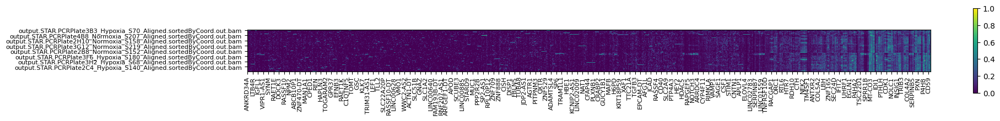

In [ ]:
plt.style.use('default')

fig = plt.figure(figsize=(20, 20))

subset = norm.loc[norm.index, norm.columns]

plt.imshow(subset, cmap='viridis') 

plt.yticks(np.arange(0, len(subset.index), 23), subset.index[::23], fontsize=8)
plt.xticks(np.arange(0, len(subset.columns), 23), subset.columns[::23], rotation=90, fontsize=8)

plt.colorbar(shrink=0.1)

plt.show()


From the plot we can gather that a big part of genes at the end of the map show high gene expression. To better visualize this group we can reduce the size of the map focusing on those genes.

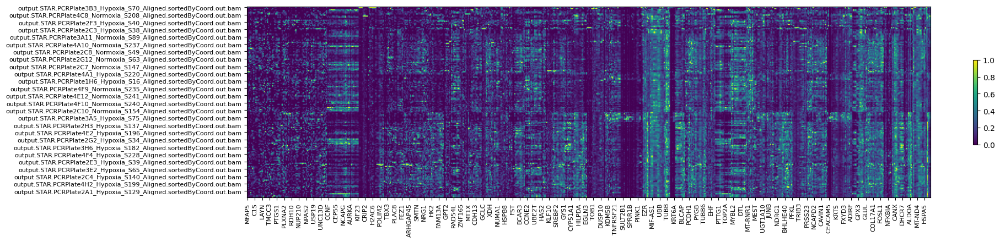

In [ ]:
plt.style.use('default')

fig = plt.figure(figsize=(20, 20))

subset = norm.iloc[:,2350:]

plt.imshow(subset, cmap='viridis') 

plt.yticks(np.arange(0, len(subset.index), 7), subset.index[::7], fontsize=8)
plt.xticks(np.arange(0, len(subset.columns), 7), subset.columns[::7], rotation=90, fontsize=8)

plt.colorbar(shrink=0.1)

plt.show()


# Supervised Learning

In this section, we will begin by identifying the most critical features in our dataset. Following this, we will construct a roster of classifiers using three variations of the dataset: the complete dataset, a version reduced through Principal Component Analysis (PCA), and a version that only includes the most important features. The classifiers we will employ include Random Forest, Gradient Boosting, Logistic Regression, k-Nearest Neighbors (k-NN), Support Vector Machines (SVM), and XGBoost. Subsequently, we will build an ensemble to create predictions based on the best performing models that we found.

## Useful functions

Two useful functions for cross-validation and evaluation in the case of full dataset or dataset reduced with PCA. (We expect the full model to overfit).

In [ ]:
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import GridSearchCV

'''
Comment to understand this function:

est: untrained model you are using (ex. KNN, SVC etc.)
params: parameters you want to train the model on
x_train, y_train are there just in case we want to use different datasets
random = True (default) uses RandomizedSearch
random = False uses GridSearch
'''

def cross_val(est, params, x_train, y_train, random=True, scoring='neg_log_loss'):
    if random:
        clf = RandomizedSearchCV(est, params,scoring=scoring,random_state=0,n_iter=50,cv=5,n_jobs=-1)
    else:
        clf = GridSearchCV(est, params,scoring=scoring,verbose=0,n_jobs=-1)
    clf.fit(x_train, y_train)
    best_score = clf.best_score_
    best_params = clf.best_params_
    print(best_score)
    print(best_params)
    return clf.best_estimator_

In [ ]:
from sklearn.base import clone
from sklearn.metrics import accuracy_score, roc_auc_score, log_loss, classification_report, confusion_matrix, precision_recall_curve, average_precision_score, auc, roc_curve
from sklearn.metrics import RocCurveDisplay as RCD

'''
Comment to understand this function:

model: best model returned from cross val (which contains the model with the best parameters found)
x_train, y_train, x_test, y_test are there just in case we want to use different datasets
'''

def evaluation(model,x_train,y_train,x_test,y_test):
    best=clone(model)
    best.fit(x_train,y_train)
    y_pred = best.predict(x_test)

    #scores
    y_class_prob = best.predict_proba(x_test)

    acc = accuracy_score(y_test,y_pred)
    print('Accuracy score:', acc)
    lss = log_loss(y_test,y_class_prob)
    print('Log loss:', lss)
    roc_auc = roc_auc_score(y_test,y_class_prob[:,1])
    print('Roc-auc score:',roc_auc)
    f_1 = classification_report(y_test, y_pred, output_dict=True)['macro avg']['f1-score']
    print('Average f1-score:',f_1)
    print(classification_report(y_test, y_pred))

    fig,ax = plt.subplots(1,2,figsize=(18,5))

    #fpr-tpr

    RCD.from_estimator(best, x_test, y_test,ax=ax[0])
    ax[0].set_title('ROC curve')

    # confusion matrix

    matrix = confusion_matrix(y_test, y_pred)
    sns.heatmap(matrix, annot=True, fmt="d",ax=ax[1])
    ax[1].set_title('Confusion Matrix')
    ax[1].set_xlabel('Predicted')
    ax[1].set_ylabel('True')
    
    return acc,lss,roc_auc,f_1

Two useful functions for the case of feature selection 

In [ ]:
def cross_val_genes(est, params, x_train, y_train, random=True,scoring='neg_log_loss', tot_genes=102):
    if random:
        clf = RandomizedSearchCV(est, params,scoring=scoring,random_state=0,n_iter=50,cv=5,n_jobs=-1)
    else:
        clf = GridSearchCV(est, params,scoring=scoring,verbose=0,n_jobs=-1)

    best_score = -np.inf
    best_number = 0
    best_clf = None

    for i in range(10,tot_genes+1,26):
        red_x_train =  x_train[important_genes[:i]]
        clf.fit(red_x_train, y_train)
        score = clf.best_score_
        if score>best_score:
            best_score = score
            best_number = i
            best_clf = clf.best_estimator_
            
    genes_selected = important_genes[:best_number]
    best_params = best_clf.get_params()
    print('Score:',best_score)
    print('Parameters:',best_params)
    print('Genes selected:',genes_selected)
    return best_clf, genes_selected

In [ ]:
def evaluation_genes(model,genes,x_train,y_train,x_test,y_test):
    x_train_red = x_train[genes]
    x_test_red = x_test[genes]
    best=clone(model)
    best.fit(x_train_red,y_train)
    y_pred = best.predict(x_test_red)

    #scores
    y_class_prob = best.predict_proba(x_test_red)

    acc = accuracy_score(y_test,y_pred)
    print('Accuracy score:', acc)
    lss = log_loss(y_test,y_class_prob)
    print('Log loss:', lss)
    roc_auc = roc_auc_score(y_test,y_class_prob[:,1])
    print('Roc-auc score:',roc_auc)
    f_1 = classification_report(y_test, y_pred, output_dict=True)['macro avg']['f1-score']
    print('Average f1-score:',f_1)
    print(classification_report(y_test, y_pred))

    fig,ax = plt.subplots(1,2,figsize=(18,5))

    #fpr-tpr

    RCD.from_estimator(best, x_test_red, y_test,ax=ax[0])
    ax[0].set_title('ROC curve')

    # confusion matrix

    matrix = confusion_matrix(y_test, y_pred)
    sns.heatmap(matrix, annot=True, fmt="d",ax=ax[1])
    ax[1].set_title('Confusion Matrix')
    ax[1].set_xlabel('Predicted')
    ax[1].set_ylabel('True')
    
    return acc,lss,roc_auc,f_1

In [ ]:
# generating a learning curve to visualize bias and variance

from sklearn.model_selection import learning_curve

def plot_learning_curve(model,scoring='accuracy'):
    train_sizes, train_scores, test_scores = learning_curve(model, X, y, cv=5, scoring=scoring, n_jobs=-1, train_sizes=np.linspace(0.1, 1.0, 10), verbose=0)
    train_mean = np.mean(train_scores, axis=1)
    train_std = np.std(train_scores, axis=1)

    test_mean = np.mean(test_scores, axis=1)
    test_std = np.std(test_scores, axis=1)

    plt.plot(train_sizes, train_mean, label='Training score')
    plt.plot(train_sizes, test_mean, label='Cross-validation score')

    plt.fill_between(train_sizes, train_mean - train_std, train_mean + train_std, color="#DDDDDD")
    plt.fill_between(train_sizes, test_mean - test_std, test_mean + test_std, color="#DDDDDD")

    plt.title('Learning Curve')
    plt.xlabel('Training Size')
    plt.ylabel('Accuracy Score')
    plt.legend(loc='best')
    plt.grid()
    plt.show()

Functions to find the average performance among different splits of test and train data given the small nature of our dataset.

In [ ]:
def short_evaluation(model,x_train,y_train,x_test,y_test):
    best=clone(model)
    best.fit(x_train,y_train)
    y_pred = best.predict(x_test)

    #scores
    y_class_prob = best.predict_proba(x_test)

    acc = accuracy_score(y_test,y_pred)
    lss = log_loss(y_test,y_class_prob)
    roc_auc = roc_auc_score(y_test,y_class_prob[:,1])
    f_1 = classification_report(y_test, y_pred, output_dict=True)['macro avg']['f1-score']

    return acc,lss,roc_auc,f_1

def average_performance(model, data, labels, n):
    acc, lss, roc_auc, f_1 = [], [], [], []
    values = [random.randint(0,10000) for j in range(n)]
    for i in values:
        xtrain, xtest, ytrain, ytest = train_test_split(data, labels, test_size=0.25, random_state=i)
        ev = short_evaluation(model, xtrain, ytrain, xtest, ytest)
        acc.append(ev[0])
        lss.append(ev[1])
        roc_auc.append(ev[2])
        f_1.append(ev[3])
    print('Maximum and minimum accuracy:', max(acc), ' ', min(acc))
    print('Average Accuracy score:', np.mean(acc))
    print('Average Log loss:',np.mean(lss))
    print('Average Roc-auc score:', np.mean(roc_auc))
    print('Average f1-score:', np.mean(f_1))
    return min(acc), max(acc), np.mean(acc), np.mean(lss), np.mean(roc_auc), np.mean(f_1)

## Train-test split

We create an array of entries of boolean values to determine wheter a cell belongs to the 'Hypo' class. This will be used for labelling our data.

We create a validation set: a portion of the data used to evaluate the performance of a model during training. It is typically used to tune the hyperparameters of the model (e.g., learning rate, regularization strength, etc.) to improve its performance on unseen data.

During training, the model is trained on the training set, and its performance is evaluated on the validation set. The model's parameters are then adjusted based on the validation set performance. This process is repeated until the model's performance on the validation set is satisfactory.

In [ ]:
from sklearn.model_selection import train_test_split
X = df_hcc_smart_train.T
y = np.array([int('Hypo' in name) for name in X.index])

# Split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)


## Feature importance with Random forests

Random Forests is a robust machine learning algorithm that is primarily used for classification and regression tasks. It operates by constructing a multitude of decision trees at training time and outputting the class that is the mode of the classes (classification) or mean prediction (regression) of the individual trees. This process effectively creates a 'forest' of different decision models which work together to create an aggregate prediction.

One of the main strengths of Random Forests is its ability to perform feature selection. Each individual tree in the Random Forest is trained on a random subset of the features, and the importance of each feature can be evaluated by measuring how much the tree nodes that use that feature reduce impurity across all trees in the forest. Therefore, Random Forests are good for feature selection because they provide an in-built mechanism to determine feature importance.

Random Forests have several advantages. They are very flexible and can handle both categorical and numerical data, as well as missing data. They are also less likely to overfit than single decision trees because they average the results over many trees. Furthermore, they are quite robust to the inclusion of irrelevant or redundant features because of their feature selection capabilities.

However, Random Forests also have some disadvantages. They can be computationally intensive and require more resources and time to train and predict, especially with large datasets or a large number of trees. They are also considered a black-box model with complex structures, making them harder to interpret compared to simpler models like linear regression or single decision trees. Additionally, although they are less likely to overfit than single decision trees, they can still overfit if the number of trees is not set correctly.







Before running a random forest algorithm on our data to find the features relative importance, we compute cross-validation to select the most optimal hyperparameters for the random forest.

WARNING: Very time-consuming code ahead - skip if not necessary

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import ExtraTreesClassifier

# Define the parameter values that should be searched
n_estimators = [100, 500, 1000, 5000, 10000]
max_features = ['sqrt']
max_samples = [0.5, 0.6, 0.7, 0.8]
bootstrap = [True]
max_depth = [None, 250, 500, 750]
criterion = ['gini', 'entropy', 'log_loss']
min_samples_split = [2, 3, 4, 5]
min_samples_leaf = [1, 2, 3, 4]
bootstrap = [True]

param_distributions = dict(n_estimators=n_estimators, max_samples=max_samples, bootstrap=bootstrap, 
                  max_features=max_features, max_depth=max_depth, criterion=criterion, 
                  min_samples_split=min_samples_split, min_samples_leaf=min_samples_leaf)

# Instantiate the grid
et = ExtraTreesClassifier(n_jobs=-1)
random_search = RandomizedSearchCV(et, param_distributions=param_distributions, n_iter=50, cv=3, random_state=42, n_jobs=-1)

# Fit the grid with data
random_search.fit(X_train, y_train)

# View the complete results
print(random_search.cv_results_)

# Print the best score and parameters
print("Best score: ", random_search.best_score_)
print("Best parameters: ", random_search.best_params_)


{'mean_fit_time': array([ 0.95654058,  1.82098333, 10.49235574, 10.57808892, 23.88554279,
        1.0512658 ,  3.47476443,  0.39637351,  1.40529005, 10.56039858,
        2.31513158,  0.24004372,  0.20509712,  0.19879913,  1.76579229,
       20.59701006,  0.8982927 , 20.89816729,  2.35936197,  0.94849499,
       21.64931369, 11.10233132,  0.92484514,  0.20646946,  2.20207906,
        0.20860179, 19.95299323,  9.78909874,  1.85167734,  0.94415744,
        0.88849441, 10.3033421 ,  0.20342271,  1.1829261 , 20.59260352,
        0.99349141, 10.64913551,  9.75010721,  0.9906249 , 20.68697381,
        0.91386676, 10.64040494, 19.88493578, 20.77440135, 20.17079083,
        0.19580086, 21.14466071,  1.84665775,  1.79652381,  0.94589361]), 'std_fit_time': array([4.41467583e-02, 1.43490403e-02, 1.97852811e-01, 1.41534014e-01,
       3.32479772e+00, 1.98556083e-02, 1.19814676e+00, 9.01120176e-02,
       7.08029352e-01, 1.37640695e-01, 1.80991458e-01, 2.66077909e-02,
       1.40479315e-03, 3.427652

We can now run our random forests classifier with the newly found parameters.

In [ ]:
# Get the best parameters
best_params = random_search.best_params_

# Create a new classifier with these parameters
et_clf_best = ExtraTreesClassifier(n_estimators=best_params['n_estimators'], 
                                   max_samples=best_params['max_samples'], 
                                   bootstrap=best_params['bootstrap'],
                                   max_features=best_params['max_features'],
                                   criterion=best_params['criterion'],
                                   min_samples_split=best_params['min_samples_split'],
                                   min_samples_leaf=best_params['min_samples_leaf'],
                                   max_depth=best_params['max_depth'],
                                   n_jobs=-1)

# Fit the classifier to the training data
et_clf_best.fit(X_train, y_train)


ExtraTreesClassifier(bootstrap=True, max_depth=500, max_samples=0.6,
                     min_samples_leaf=2, min_samples_split=3, n_estimators=500,
                     n_jobs=-1)

We plot the relative importance of all features in order to have a look at its distribution

Text(0.5, 1.0, 'Feature Importance using Extra Trees')

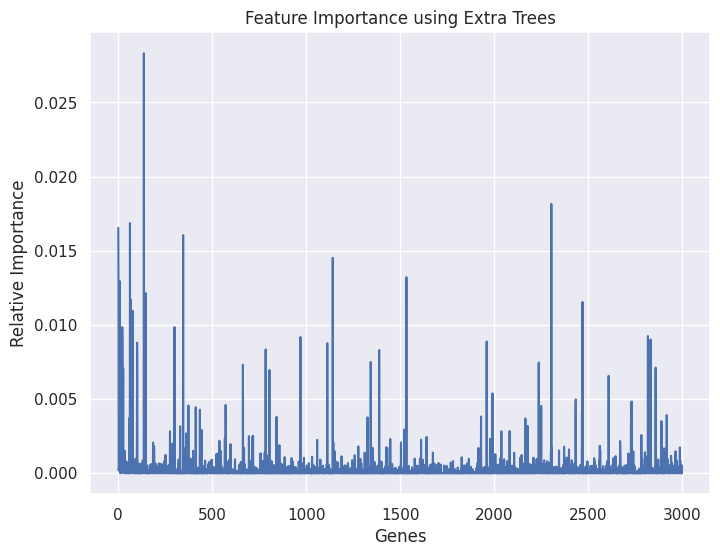

In [ ]:
# Plotting the results of Feature Importance
fig = plt.figure(figsize=(8, 6))
plt.plot(et_clf_best.feature_importances_)
plt.ylabel('Relative Importance')
plt.xlabel('Genes')
plt.title('Feature Importance using Extra Trees')

We want to find the names of the top 10 genes by importance.

In [ ]:
# Get feature importances
importances = et_clf_best.feature_importances_

# Create a pandas DataFrame from the importances
importance_df = pd.DataFrame({'feature': X_train.columns, 'importance': importances})

# Sort the DataFrame by importance in descending order
importance_df = importance_df.sort_values('importance', ascending=False)

# Get the sorted feature names
important_genes = importance_df['feature'].tolist()

# Print the top 10 features
print('Top 15 genes:', important_genes[:15])


Top 15 genes: ['PGK1', 'BNIP3L', 'BNIP3', 'DDIT4', 'LDHA', 'P4HA1', 'ALDOA', 'NDRG1', 'ANGPTL4', 'LOXL2', 'BHLHE40', 'EGLN1', 'ALDOC', 'PFKFB3', 'EGLN3']


## Random Forest

Random Forest is a powerful classification tool that uses ensemble learning to generate multiple decision trees, averaging their results to improve prediction accuracy and control overfitting. 

### FULL

In [ ]:
from sklearn.pipeline import Pipeline
from sklearn.ensemble import RandomForestClassifier

rf = RandomForestClassifier(random_state=0)

In [ ]:
rf_param = {   
    'n_estimators': [100, 500, 1000, 5000, 10000],          
    'max_features': ['sqrt'], 
    'max_samples': [0.5, 0.6, 0.7, 0.8],
    'max_depth' : [None, 250, 500, 750],               
    'criterion' :['gini', 'entropy', 'log_loss'],
    'min_samples_split': [2, 3, 4, 5],
    'min_samples_leaf': [1, 2, 3, 4],
    'bootstrap': [True]
    }

-0.19695728648962202
{'n_estimators': 5000, 'min_samples_split': 2, 'min_samples_leaf': 2, 'max_samples': 0.8, 'max_features': 'sqrt', 'max_depth': 250, 'criterion': 'log_loss', 'bootstrap': True}
Accuracy score: 1.0
Log loss: 0.16480075268601724
Roc-auc score: 1.0
Average f1-score: 1.0
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        18
           1       1.00      1.00      1.00        28

    accuracy                           1.00        46
   macro avg       1.00      1.00      1.00        46
weighted avg       1.00      1.00      1.00        46



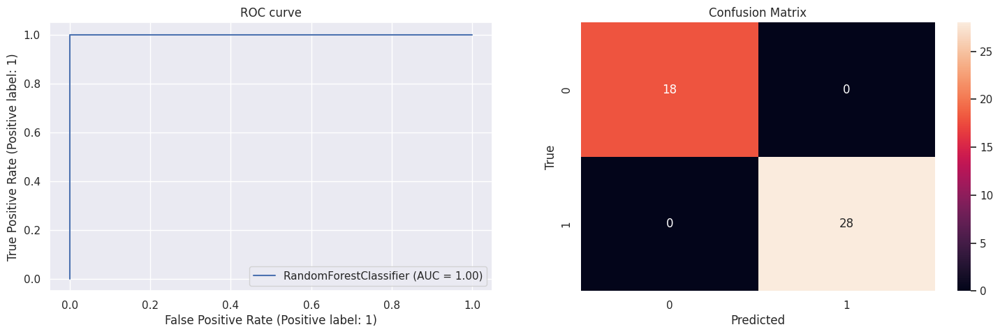

In [ ]:
rf_best = cross_val(rf, rf_param, X_train, y_train, random=True)
rf_eval = evaluation(rf_best, X_train, y_train, X_test, y_test)

In [ ]:
rf_avg = average_performance(rf_best, X, y, 10)

Maximum and minimum accuracy: 1.0   0.9565217391304348
Average Accuracy score: 0.9826086956521738
Average Log loss: 0.18450316456922305
Average Roc-auc score: 0.9971281625744102
Average f1-score: 0.982382017402205


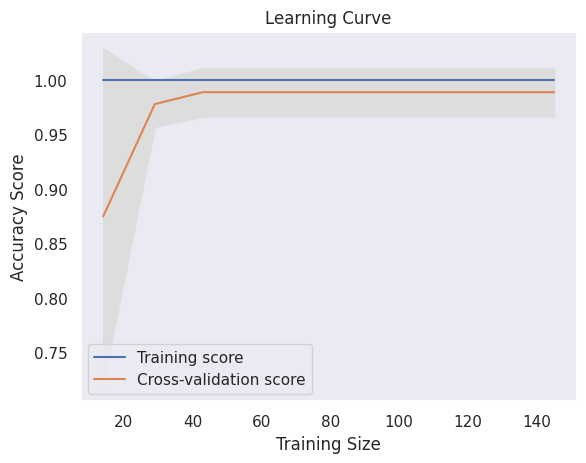

In [ ]:
plot_learning_curve(rf_best)

### PCA

A pipeline in sklearn is a means to streamline the workflow by chaining multiple processing steps (like scaling, PCA, model fitting) together, ensuring that procedures are executed in the correct order. It simplifies code and helps in reproducibility, but its linear sequence may not suit all types of workflows and large pipelines can be computationally intensive.

Here, we adopt a pipeline to execute scaling, PCA and random forest on our training set.

In [ ]:
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.pipeline import Pipeline

rf_pipe = Pipeline([
    ('scaler', StandardScaler(with_mean=False)),
    ('pca', PCA()),
    ('rf', RandomForestClassifier(random_state=0))])

In [ ]:
rf_pipe_param = {
    'pca__n_components': [n for n in range(10,109)],   
    'rf__n_estimators': [100, 500, 1000, 5000, 10000],          
    'rf__max_features': ['sqrt'], 
    'rf__max_samples': [0.5, 0.6, 0.7, 0.8],
    'rf__max_depth' : [None, 250, 500, 750],               
    'rf__criterion' :['gini', 'entropy', 'log_loss'],
    'rf__min_samples_split': [2, 3, 4, 5],
    'rf__min_samples_leaf': [1, 2, 3, 4],
    'rf__bootstrap': [True]
    }

-0.33484134692572315
{'rf__n_estimators': 1000, 'rf__min_samples_split': 5, 'rf__min_samples_leaf': 2, 'rf__max_samples': 0.7, 'rf__max_features': 'sqrt', 'rf__max_depth': None, 'rf__criterion': 'gini', 'rf__bootstrap': True, 'pca__n_components': 12}
Accuracy score: 0.9130434782608695
Log loss: 0.2792485281005638
Roc-auc score: 0.992063492063492
Average f1-score: 0.9103313840155945
              precision    recall  f1-score   support

           0       0.85      0.94      0.89        18
           1       0.96      0.89      0.93        28

    accuracy                           0.91        46
   macro avg       0.91      0.92      0.91        46
weighted avg       0.92      0.91      0.91        46



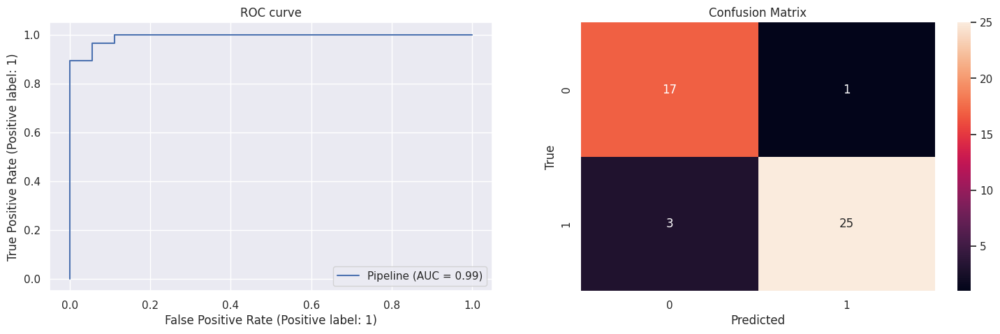

In [ ]:
rf_pipe_best = cross_val(rf_pipe, rf_pipe_param, X_train, y_train,random=True)
rf_pipe_eval = evaluation(rf_pipe_best, X_train, y_train, X_test, y_test)

In [ ]:
rf_pipe_avg = average_performance(rf_pipe_best, X, y, 10)

Maximum and minimum accuracy: 0.9347826086956522   0.8478260869565217
Average Accuracy score: 0.8956521739130435
Average Log loss: 0.2994299422259144
Average Roc-auc score: 0.9775687830687829
Average f1-score: 0.893927590891559


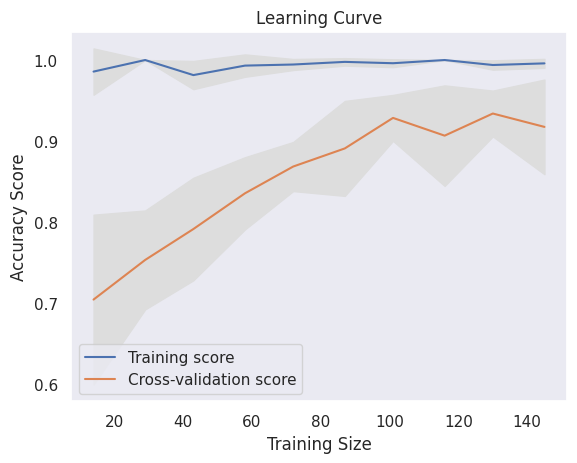

In [ ]:
plot_learning_curve(rf_pipe_best)

### Important genes

Score: -0.10496734186836451
Parameters: {'bootstrap': True, 'ccp_alpha': 0.0, 'class_weight': None, 'criterion': 'entropy', 'max_depth': 250, 'max_features': 'sqrt', 'max_leaf_nodes': None, 'max_samples': 0.7, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 4, 'min_weight_fraction_leaf': 0.0, 'n_estimators': 500, 'n_jobs': None, 'oob_score': False, 'random_state': 0, 'verbose': 0, 'warm_start': False}
Genes selected: ['PGK1', 'BNIP3L', 'BNIP3', 'DDIT4', 'LDHA', 'P4HA1', 'ALDOA', 'NDRG1', 'ANGPTL4', 'LOXL2', 'BHLHE40', 'EGLN1', 'ALDOC', 'PFKFB3', 'EGLN3', 'PPP1R3G', 'ERO1A', 'FUT11', 'PLOD2', 'KCTD11', 'EIF5', 'CA9', 'ASB2', 'GPI', 'SLC6A8', 'MOB3A', 'ENO2', 'FOSL2', 'FAM162A', 'PLIN2', 'PFKFB4', 'FAM13A', 'SLC2A1', 'HES1', 'KRT19', 'SCD']
Accuracy score: 1.0
Log loss: 0.0534879522467358
Roc-auc score: 1.0
Average f1-score: 1.0
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        18
           1       1.00   

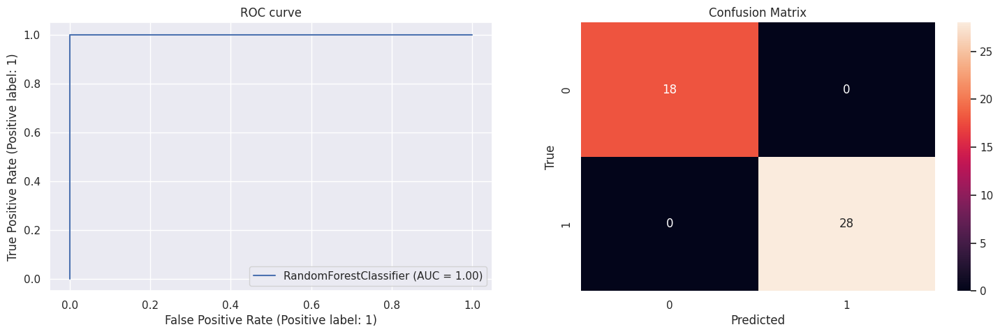

In [ ]:
rf_genes_best, rf_genes = cross_val_genes(rf, rf_param, X_train, y_train, random=True)
rf_genes_eval = evaluation_genes(rf_genes_best,rf_genes, X_train, y_train, X_test, y_test)

In [ ]:
rf_genes_avg = average_performance(rf_genes_best, X, y, 10)

Maximum and minimum accuracy: 1.0   0.9782608695652174
Average Accuracy score: 0.9934782608695653
Average Log loss: 0.1746006179132637
Average Roc-auc score: 0.999430735930736
Average f1-score: 0.9932542876448054


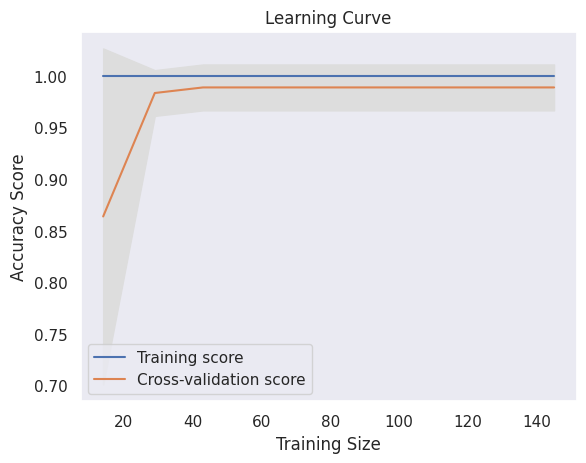

In [ ]:
plot_learning_curve(rf_genes_best)

## Logistic Regression

Logistic regression is a statistical model used in machine learning and statistics for predicting the probability of a binary outcome. It is a type of regression analysis where the dependent variable (outcome) is categorical, typically binary - meaning it has two possible outcomes such as yes/no, true/false, success/failure, etc.. In this section uses logistic regression as a classifier.

In [ ]:
from sklearn.linear_model import LogisticRegression

### FULL

In this section we adopt logistic regression without applying any PCA algorithm on the dataset.

/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_search.py:305: UserWarning: The total space of parameters 28 is smaller than n_iter=50. Running 28 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(


-0.01137503248972728
{'penalty': 'l1', 'fit_intercept': False, 'C': 10}
Accuracy score: 1.0
Log loss: 0.003191431582517606
Roc-auc score: 1.0
Average f1-score: 1.0
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        18
           1       1.00      1.00      1.00        28

    accuracy                           1.00        46
   macro avg       1.00      1.00      1.00        46
weighted avg       1.00      1.00      1.00        46



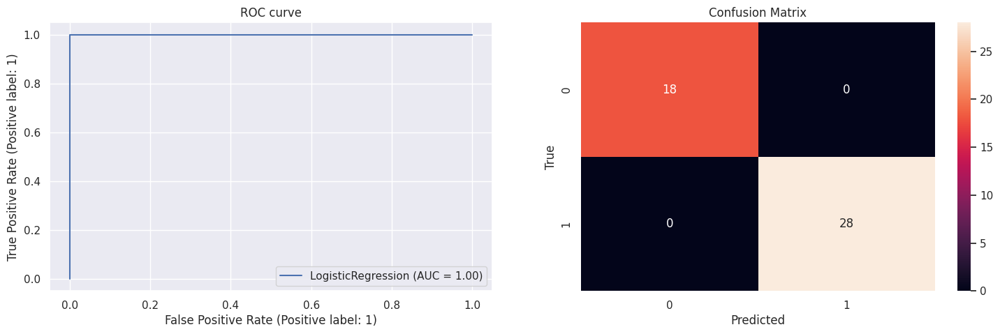

In [ ]:
lr = LogisticRegression(max_iter=10000,solver='liblinear',random_state=0)

lr_param = {
    'C': [0.001, 0.01, 0.1, 1, 10, 100, 1000],
    'penalty': ['l1', 'l2'], 
    'fit_intercept': [True, False]
}

lr_best = cross_val(lr, lr_param, X_train, y_train, random=True)
lr_eval = evaluation(lr_best, X_train, y_train, X_test, y_test)

In [ ]:
lr_avg = average_performance(lr_best, X, y, 10)

Maximum and minimum accuracy: 1.0   0.9565217391304348
Average Accuracy score: 0.9847826086956522
Average Log loss: 0.058074096374262474
Average Roc-auc score: 0.9977218341939513
Average f1-score: 0.9840829318656266


The observations indicate a satisfactory outcome. The model has an average accuracy of 99%, a remarkably good level, complemented by a minimal log loss. The performance of the model is further corroborated by the results of cross-validation.

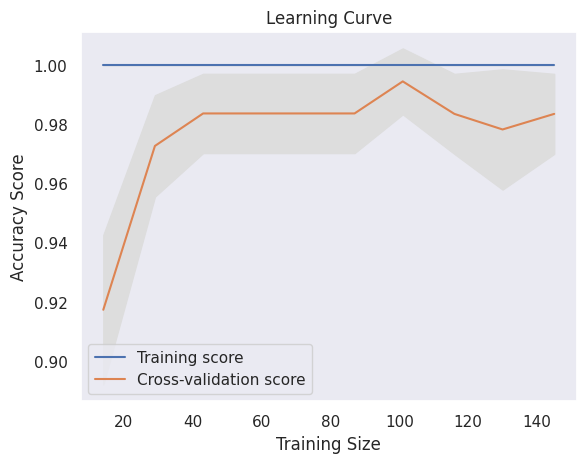

In [ ]:
plot_learning_curve(lr_best)

Unfortunately, the graph depicted above indicates a tendency towards minimal overfitting within the data, signifying a suboptimal generalization of the model when encountering new data.

### PCA

Here, a pipeline is used to first standardize the data, perform PCA for dimensionality reduction, and then apply logistic regression. Again, the parameters are optimized with a random search.

-0.13420027585988492
{'pca__n_components': 87, 'classifier__penalty': 'l2', 'classifier__C': 0.1}
Accuracy score: 1.0
Log loss: 0.053204130694428774
Roc-auc score: 1.0
Average f1-score: 1.0
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        18
           1       1.00      1.00      1.00        28

    accuracy                           1.00        46
   macro avg       1.00      1.00      1.00        46
weighted avg       1.00      1.00      1.00        46



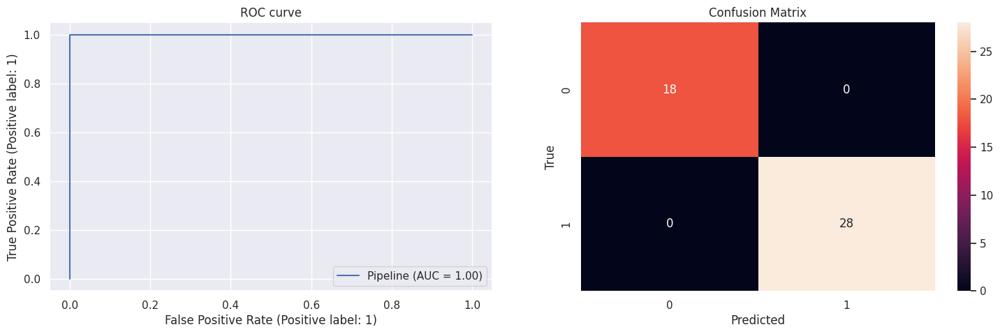

In [ ]:
# random search
lr_pipe = Pipeline([
    ('scaler', StandardScaler(with_mean = False)),
    ('pca', PCA()),
    ('classifier', LogisticRegression(solver='liblinear', max_iter=10000,random_state=0))
])

lr_pipe_param = { 
    'pca__n_components': [n for n in range(10,109)],
    'classifier__C': [0.001, 0.01, 0.1, 1, 10, 100, 1000],
    'classifier__penalty': ['l1', 'l2']
}

lr_pipe_best = cross_val(lr_pipe, lr_pipe_param, X_train, y_train, random=True)
lr_pipe_eval = evaluation(lr_pipe_best, X_train, y_train, X_test, y_test)

In [ ]:
lr_pipe_avg = average_performance(lr_pipe_best, X, y, 10)

Maximum and minimum accuracy: 0.9782608695652174   0.8913043478260869
Average Accuracy score: 0.9565217391304348
Average Log loss: 0.14535595981536645
Average Roc-auc score: 0.9880250278923279
Average f1-score: 0.956021737973022


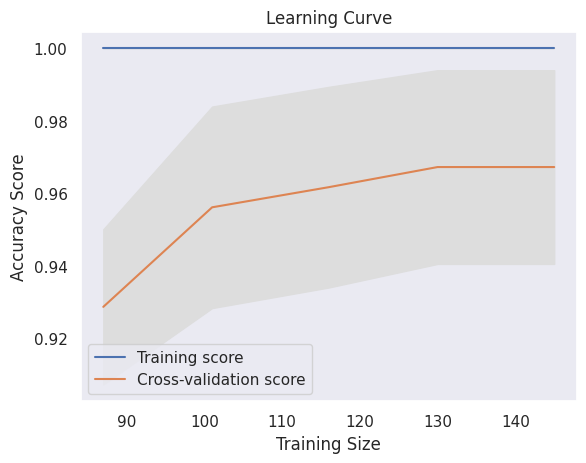

In [ ]:
plot_learning_curve(lr_pipe_best) 

The application of Logistic Regression in conjunction with Principal Component Analysis for dimensionality reduction did not yield satisfactory results for our dataset. Upon examination of the learning curve, it was evident that the model was underfitting the data. This unsatisfactory performance could potentially be due to the limited size of our dataset.

### Important genes

Now, we try building a classifier on the most important genes, instead of the principal components.

/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_search.py:305: UserWarning: The total space of parameters 28 is smaller than n_iter=50. Running 28 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_search.py:305: UserWarning: The total space of parameters 28 is smaller than n_iter=50. Running 28 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_search.py:305: UserWarning: The total space of parameters 28 is smaller than n_iter=50. Running 28 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_search.py:305: UserWarning: The total space of parameters 28 is smaller than n_iter=50. Running 28 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(


Score: -0.11193890519979799
Parameters: {'C': 1000, 'class_weight': None, 'dual': False, 'fit_intercept': True, 'intercept_scaling': 1, 'l1_ratio': None, 'max_iter': 10000, 'multi_class': 'auto', 'n_jobs': None, 'penalty': 'l1', 'random_state': 0, 'solver': 'liblinear', 'tol': 0.0001, 'verbose': 0, 'warm_start': False}
Genes selected: ['PGK1', 'BNIP3L', 'BNIP3', 'DDIT4', 'LDHA', 'P4HA1', 'ALDOA', 'NDRG1', 'ANGPTL4', 'LOXL2', 'BHLHE40', 'EGLN1', 'ALDOC', 'PFKFB3', 'EGLN3', 'PPP1R3G', 'ERO1A', 'FUT11', 'PLOD2', 'KCTD11', 'EIF5', 'CA9', 'ASB2', 'GPI', 'SLC6A8', 'MOB3A', 'ENO2', 'FOSL2', 'FAM162A', 'PLIN2', 'PFKFB4', 'FAM13A', 'SLC2A1', 'HES1', 'KRT19', 'SCD', 'TPBG', 'LDHB', 'MIF-AS1', 'LBH', 'STC2', 'PLAC8', 'TMEM45A', 'TMBIM1', 'ARRDC3', 'C4orf3', 'P4HA2', 'BLCAP', 'DLK2', 'SNX33', 'FAM83A', 'GYS1', 'KDM3A', 'PAM', 'SLC7A11', 'PPARG', 'ADM', 'ZFP36', 'DHCR7', 'HSP90B1', 'INSIG1', 'KDM5B']
Accuracy score: 1.0
Log loss: 0.0012325161599812324
Roc-auc score: 1.0
Average f1-score: 1.0
      

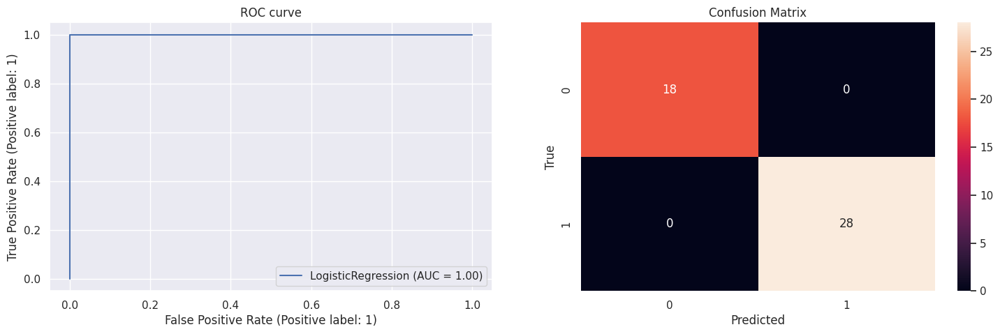

In [ ]:
lr_genes_best, lr_genes = cross_val_genes(lr, lr_param, X_train, y_train, random=True)
lr_genes_eval = evaluation_genes(lr_genes_best,lr_genes, X_train, y_train, X_test, y_test)

In [ ]:
lr_genes_avg = average_performance(lr_genes_best, X, y, 10)

Maximum and minimum accuracy: 1.0   0.9347826086956522
Average Accuracy score: 0.9608695652173914
Average Log loss: 0.1585776774535784
Average Roc-auc score: 0.9880287860214235
Average f1-score: 0.9597806392920845


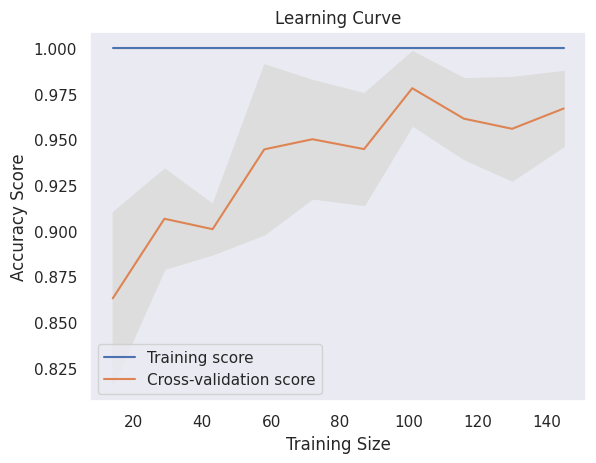

In [ ]:
plot_learning_curve(lr_genes_best)

## KNN

K-Nearest Neighbors (KNN) is a type of instance-based learning algorithm used in machine learning for both regression and classification problems. However, it is most commonly used in classification problems in the industry. We will try applying it to create a classification tool for our dataset. 

### FULL

Once again, we first implement the model without any PCA.

In [ ]:
from sklearn.neighbors import KNeighborsClassifier

-0.16891261638762245
{'weights': 'uniform', 'p': 1, 'n_neighbors': 13, 'metric': 'euclidean', 'leaf_size': 48, 'algorithm': 'kd_tree'}
Accuracy score: 0.9782608695652174
Log loss: 0.10314914118527634
Roc-auc score: 1.0
Average f1-score: 0.9773955773955774
              precision    recall  f1-score   support

           0       0.95      1.00      0.97        18
           1       1.00      0.96      0.98        28

    accuracy                           0.98        46
   macro avg       0.97      0.98      0.98        46
weighted avg       0.98      0.98      0.98        46



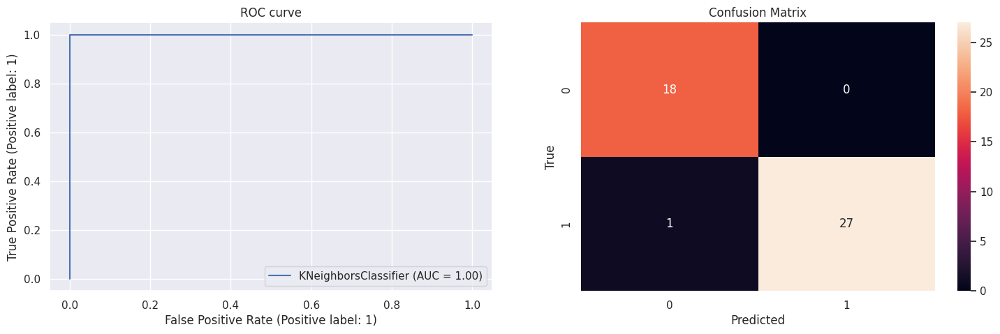

In [ ]:
knn = KNeighborsClassifier(n_jobs=-1)
knn_param = {
    'n_neighbors': list(range(1, 31)),
    'weights': ['uniform', 'distance'],
    'algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute'],
    'leaf_size': list(range(1,51)),
    'p': [1,2],
    'metric': ['euclidean', 'manhattan', 'chebyshev', 'minkowski']
}

knn_best = cross_val(knn, knn_param, X_train, y_train, random=True)
knn_eval = evaluation(knn_best, X_train, y_train, X_test, y_test)

In [ ]:
knn_avg = average_performance(knn_best, X, y, 10)

Maximum and minimum accuracy: 0.9782608695652174   0.8913043478260869
Average Accuracy score: 0.9413043478260871
Average Log loss: 0.29535180293486707
Average Roc-auc score: 0.9903609195385512
Average f1-score: 0.9405998346789117


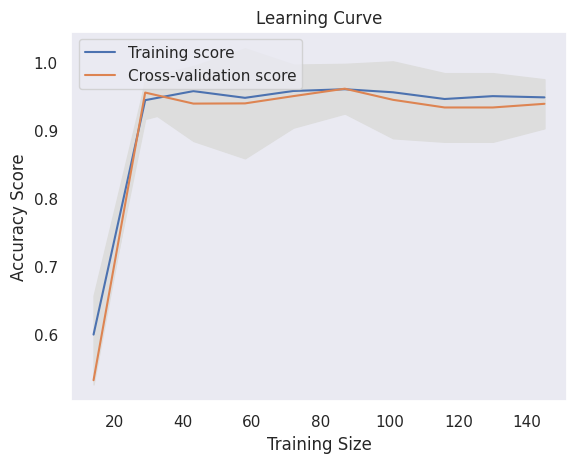

In [ ]:
plot_learning_curve(knn_best)

### PCA

We repeat the analysis by applying PCA first.

-0.17426053684061846
{'knn__weights': 'distance', 'knn__p': 1, 'knn__n_neighbors': 7, 'knn__metric': 'euclidean', 'knn__leaf_size': 15, 'knn__algorithm': 'ball_tree', 'PCA__n_components': 16}
Accuracy score: 0.9565217391304348
Log loss: 0.11278922973049704
Roc-auc score: 0.9900793650793651
Average f1-score: 0.9551656920077973
              precision    recall  f1-score   support

           0       0.90      1.00      0.95        18
           1       1.00      0.93      0.96        28

    accuracy                           0.96        46
   macro avg       0.95      0.96      0.96        46
weighted avg       0.96      0.96      0.96        46



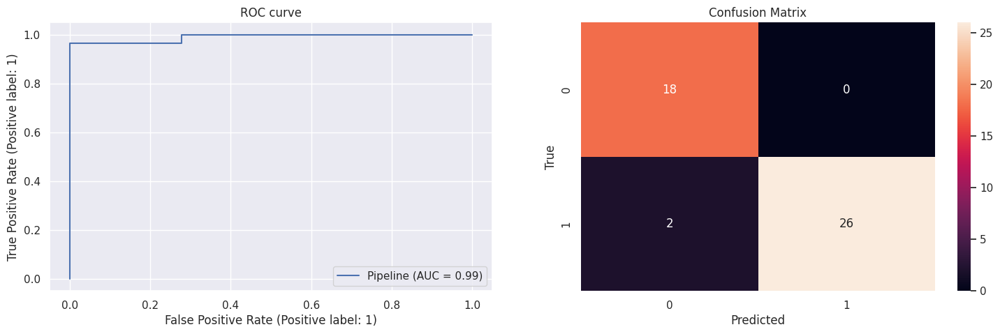

In [ ]:
knn_pipe = Pipeline([('SC', StandardScaler(with_mean=False)),('PCA', PCA()), ('knn', KNeighborsClassifier(n_jobs=-1))])
knn_pipe_param = {'PCA__n_components':[n for n in range(10,109)],
                  'knn__n_neighbors': list(range(1, 31)),
                  'knn__weights': ['uniform', 'distance'],
                  'knn__algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute'],
                  'knn__leaf_size': list(range(1,51)),
                  'knn__p': [1,2],
                  'knn__metric': ['euclidean', 'manhattan', 'chebyshev', 'minkowski']
                   }

knn_pipe_best = cross_val(knn_pipe,knn_pipe_param,X_train,y_train,random=True)
knn_pipe_eval = evaluation(knn_pipe_best,X_train,y_train,X_test,y_test)

In [ ]:
knn_pipe_avg = average_performance(knn_pipe_best, X, y, 10)

Maximum and minimum accuracy: 0.9782608695652174   0.8913043478260869
Average Accuracy score: 0.9260869565217392
Average Log loss: 0.16939697575212034
Average Roc-auc score: 0.98683109099368
Average f1-score: 0.9254550597453941


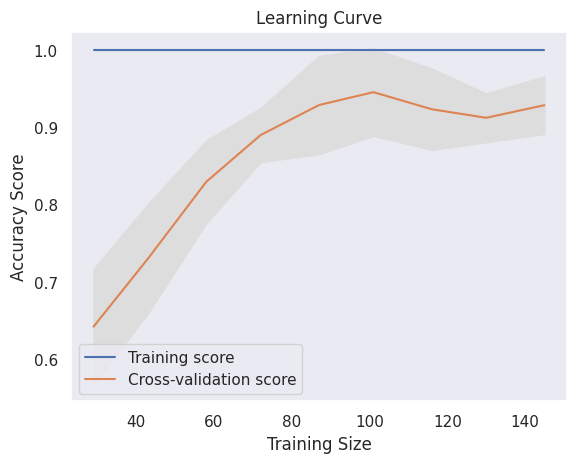

In [ ]:
plot_learning_curve(knn_pipe_best)

### Important genes

Now, we try building a classifier on the most important genes, instead of the principal components.

Score: -0.4054803358805378
Parameters: {'algorithm': 'ball_tree', 'leaf_size': 38, 'metric': 'manhattan', 'metric_params': None, 'n_jobs': -1, 'n_neighbors': 29, 'p': 1, 'weights': 'distance'}
Genes selected: ['PGK1', 'BNIP3L', 'BNIP3', 'DDIT4', 'LDHA', 'P4HA1', 'ALDOA', 'NDRG1', 'ANGPTL4', 'LOXL2', 'BHLHE40', 'EGLN1', 'ALDOC', 'PFKFB3', 'EGLN3', 'PPP1R3G', 'ERO1A', 'FUT11', 'PLOD2', 'KCTD11', 'EIF5', 'CA9', 'ASB2', 'GPI', 'SLC6A8', 'MOB3A', 'ENO2', 'FOSL2', 'FAM162A', 'PLIN2', 'PFKFB4', 'FAM13A', 'SLC2A1', 'HES1', 'KRT19', 'SCD', 'TPBG', 'LDHB', 'MIF-AS1', 'LBH', 'STC2', 'PLAC8', 'TMEM45A', 'TMBIM1', 'ARRDC3', 'C4orf3', 'P4HA2', 'BLCAP', 'DLK2', 'SNX33', 'FAM83A', 'GYS1', 'KDM3A', 'PAM', 'SLC7A11', 'PPARG', 'ADM', 'ZFP36', 'DHCR7', 'HSP90B1', 'INSIG1', 'KDM5B', 'MT1X', 'DHCR24', 'KYNU', 'HK2', 'MIF', 'TUBA1A', 'IDI1', 'ZNF473', 'RIMKLA', 'TSC22D1', 'IGFBP3', 'SEMA4B', 'PCSK9', 'HILPDA', 'SRM', 'LIMCH1', 'AHNAK2', 'SQLE', 'HERPUD1', 'TMSB10', 'PPP1R3C', 'PRSS8', 'STC1', 'DUSP6', 'KANK3

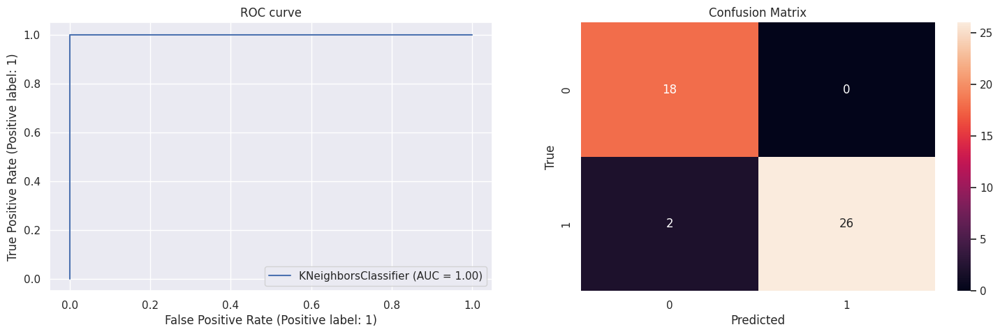

In [ ]:
knn_genes_best, knn_genes = cross_val_genes(knn, knn_param, X_train, y_train, random=True )
knn_genes_eval = evaluation_genes(knn_genes_best,knn_genes, X_train, y_train, X_test, y_test)

In [ ]:
knn_genes_avg = average_performance(knn_genes_best, X, y, 10)

Maximum and minimum accuracy: 1.0   0.8478260869565217
Average Accuracy score: 0.9260869565217391
Average Log loss: 0.4412667058065806
Average Roc-auc score: 0.9795209995318691
Average f1-score: 0.9252108314807673


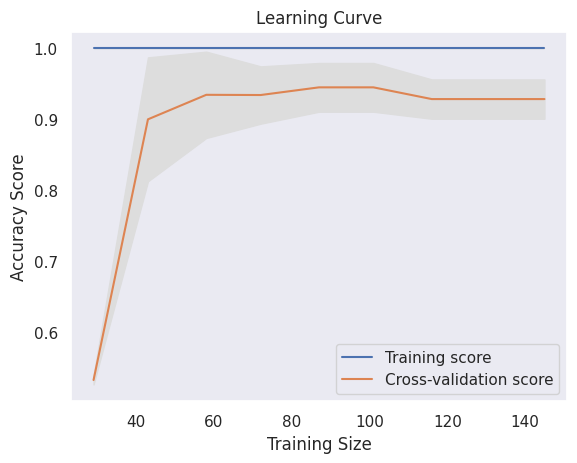

In [ ]:
plot_learning_curve(knn_genes_best)

## SVM

Support Vector Machine (SVM) is a powerful supervised machine learning algorithm used mainly for classification, and also for regression. It is especially well-suited for classification of complex but small- or medium-sized datasets.

In [ ]:
from sklearn.svm import SVC

### FULL

Again, we first apply the algorithm without any PCA.

-0.08723082564893518
{'C': 5.360100791068176, 'kernel': 'rbf'}
Accuracy score: 1.0
Log loss: 0.03251690673335217
Roc-auc score: 1.0
Average f1-score: 1.0
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        18
           1       1.00      1.00      1.00        28

    accuracy                           1.00        46
   macro avg       1.00      1.00      1.00        46
weighted avg       1.00      1.00      1.00        46



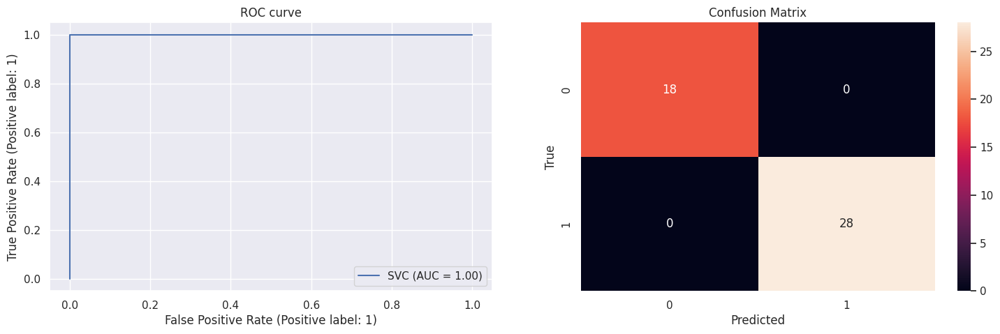

In [ ]:
from scipy.stats import expon

svm = SVC(random_state=0, probability=True)
svm_param = {'kernel':['rbf', 'poly','linear','sigmoid'], 
             'C': expon(scale=1)}

svm_best = cross_val(svm,svm_param,X_train,y_train,random=True)
svm_eval = evaluation(svm_best,X_train,y_train,X_test,y_test)

In [ ]:
svm_avg = average_performance(svm_best, X, y, 10)

Maximum and minimum accuracy: 1.0   0.9347826086956522
Average Accuracy score: 0.9739130434782608
Average Log loss: 0.07483382344595915
Average Roc-auc score: 0.9976725389515625
Average f1-score: 0.9731370786275451


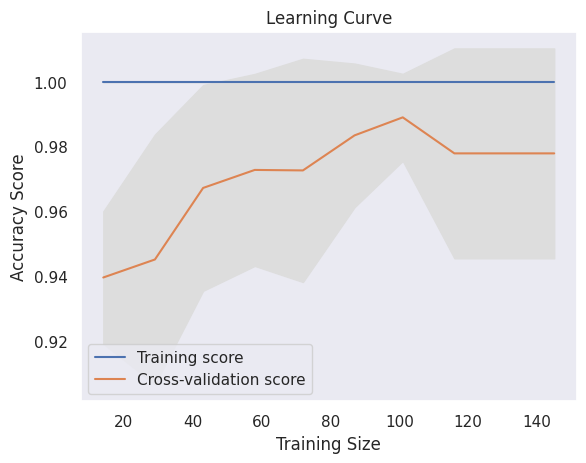

In [ ]:
plot_learning_curve(svm_best)

### PCA

We repeat the previous steps, but apply PCA first.

-0.11561011130136667
{'PCA__n_components': 72, 'SVC__C': 0.5348843862443556, 'SVC__kernel': 'sigmoid'}
Accuracy score: 1.0
Log loss: 0.06226465442188389
Roc-auc score: 1.0
Average f1-score: 1.0
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        18
           1       1.00      1.00      1.00        28

    accuracy                           1.00        46
   macro avg       1.00      1.00      1.00        46
weighted avg       1.00      1.00      1.00        46



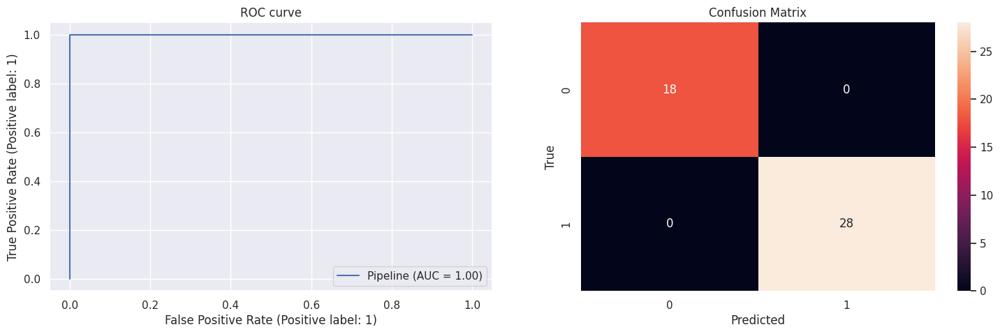

In [ ]:
from scipy.stats import expon

svm_pipe = Pipeline([('SC', StandardScaler(with_mean=False)),('PCA', PCA()), ('SVC', SVC(random_state=0, probability=True))])
svm_pipe_param = {'PCA__n_components':[n for n in range(10,109)],
                   'SVC__kernel':['rbf', 'poly','linear','sigmoid'], 
                   'SVC__C': expon(scale=1)
                   }

svm_pipe_best = cross_val(svm_pipe,svm_pipe_param,X_train,y_train,random=True)
svm_pipe_eval = evaluation(svm_pipe_best,X_train,y_train,X_test,y_test)

In [ ]:
svm_pipe_avg = average_performance(svm_pipe_best, X, y, 10)

Maximum and minimum accuracy: 1.0   0.9347826086956522
Average Accuracy score: 0.9760869565217393
Average Log loss: 0.0948474069939682
Average Roc-auc score: 0.9948378022473884
Average f1-score: 0.9755304629691199


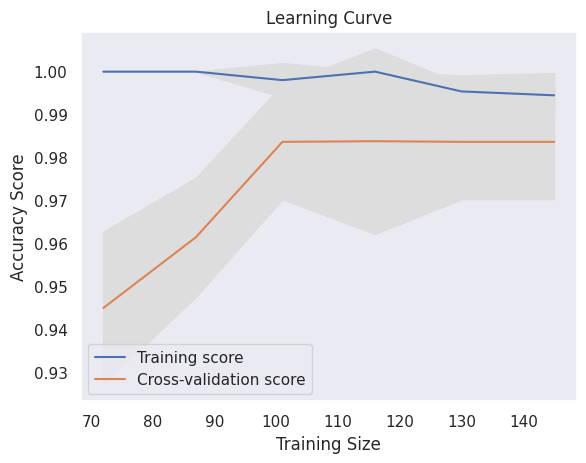

In [ ]:
plot_learning_curve(svm_pipe_best)

### Important genes

Now, we try building a classifier on the most important genes, instead of the principal components.

Score: -0.10904834775738319
Parameters: {'C': 5.360100791068176, 'break_ties': False, 'cache_size': 200, 'class_weight': None, 'coef0': 0.0, 'decision_function_shape': 'ovr', 'degree': 3, 'gamma': 'scale', 'kernel': 'rbf', 'max_iter': -1, 'probability': True, 'random_state': 0, 'shrinking': True, 'tol': 0.001, 'verbose': False}
Genes selected: ['PGK1', 'BNIP3L', 'BNIP3', 'DDIT4', 'LDHA', 'P4HA1', 'ALDOA', 'NDRG1', 'ANGPTL4', 'LOXL2', 'BHLHE40', 'EGLN1', 'ALDOC', 'PFKFB3', 'EGLN3', 'PPP1R3G', 'ERO1A', 'FUT11', 'PLOD2', 'KCTD11', 'EIF5', 'CA9', 'ASB2', 'GPI', 'SLC6A8', 'MOB3A', 'ENO2', 'FOSL2', 'FAM162A', 'PLIN2', 'PFKFB4', 'FAM13A', 'SLC2A1', 'HES1', 'KRT19', 'SCD', 'TPBG', 'LDHB', 'MIF-AS1', 'LBH', 'STC2', 'PLAC8', 'TMEM45A', 'TMBIM1', 'ARRDC3', 'C4orf3', 'P4HA2', 'BLCAP', 'DLK2', 'SNX33', 'FAM83A', 'GYS1', 'KDM3A', 'PAM', 'SLC7A11', 'PPARG', 'ADM', 'ZFP36', 'DHCR7', 'HSP90B1', 'INSIG1', 'KDM5B', 'MT1X', 'DHCR24', 'KYNU', 'HK2', 'MIF', 'TUBA1A', 'IDI1', 'ZNF473', 'RIMKLA', 'TSC22D1', '

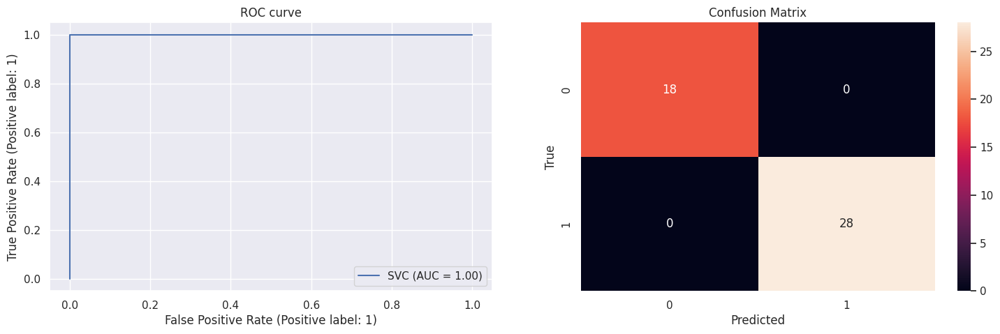

In [ ]:
svm_genes_best, svm_genes = cross_val_genes(svm, svm_param, X_train, y_train, random=True)
svm_genes_eval = evaluation_genes(svm_genes_best,svm_genes, X_train, y_train, X_test, y_test)

In [ ]:
svm_genes_avg = average_performance(svm_genes_best, X, y, 10)

Maximum and minimum accuracy: 1.0   0.9130434782608695
Average Accuracy score: 0.9804347826086955
Average Log loss: 0.06599656572169052
Average Roc-auc score: 0.9989748140635564
Average f1-score: 0.9794784741858109


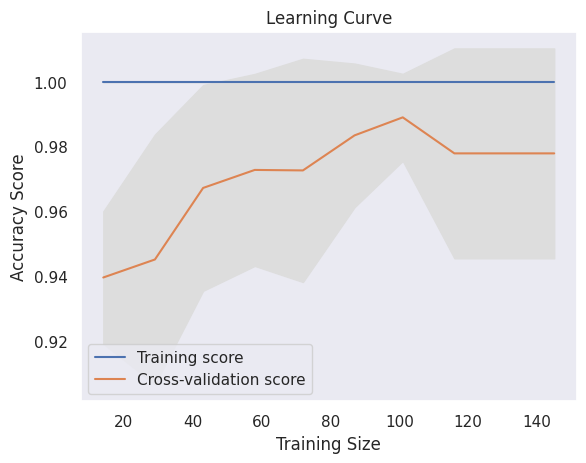

In [ ]:
plot_learning_curve(svm_genes_best)

## XGBoost

Gradient Boosting is a machine learning algorithm that combines multiple weak predictive models (typically decision trees) to create a stronger predictive model. It is an ensemble method where each subsequent model is trained to correct the mistakes made by the previous models in the ensemble.

Gradient Boosting is appreciated for its high predictive accuracy and flexibility to handle different data types. It provides measures of feature importance, allowing us to identify the most influential features in our dataset.

Despite its advantages, Gradient Boosing brings also some cons. It is indeed prone to overfitting if the number of estimators (trees) is set too high or if the data contains noisy or irrelevant features. Proper hyperparameter tuning and regularization techniques can help mitigate this issue. In addition, it is computationally intensive and time consuming (for this reason, there are optimized implementations, such as XGBoost and LightGBM, which provide faster performance.) 



In [ ]:
from xgboost import XGBClassifier

### FULL

Before moving on to running the classifier, we must handle the parameters it should deal with. In particular, to work with the Gradient Boost classifier, we must select values for its hyperparameters. 
We will use random search, since it significantly reduces the computational burden of the operation

In [ ]:
from scipy.stats import randint, uniform

# Define the model
xgb = XGBClassifier()

xgb_param = {
    'n_estimators': [10, 100, 500],  
    'subsample': [0.5, 0.75, 1],
    'learning_rate': [0.001, 0.01, 0.1],
    'min_child_weight': [0.1, 0.25, 0.5],
    'max_depth' : [None, 1000, 2500, 5000],
    'colsample_bytree': [0.25, 0.5, 0.75],
    'colsample_bylevel': [0.1, 0.185, 0.25],
    'colsample_bynode': [0.25, 0.5, 0.75]
    }

-0.06034932372603532
{'subsample': 1, 'n_estimators': 500, 'min_child_weight': 0.1, 'max_depth': 2500, 'learning_rate': 0.1, 'colsample_bytree': 0.25, 'colsample_bynode': 0.75, 'colsample_bylevel': 0.1}
Accuracy score: 1.0
Log loss: 0.01322256865232421
Roc-auc score: 1.0
Average f1-score: 1.0
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        18
           1       1.00      1.00      1.00        28

    accuracy                           1.00        46
   macro avg       1.00      1.00      1.00        46
weighted avg       1.00      1.00      1.00        46



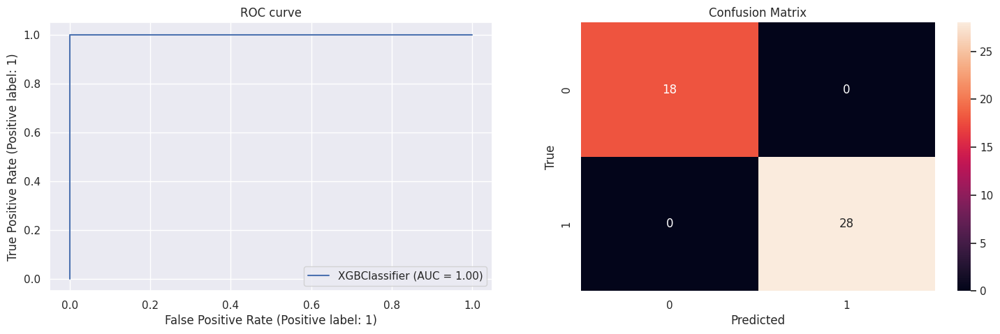

In [ ]:
xgb_best = cross_val(xgb, xgb_param, X_train, y_train, random=True)
xgb_eval = evaluation(xgb_best, X_train, y_train, X_test, y_test)

In [ ]:
xgb_avg = average_performance(xgb_best, X, y, 10)

Maximum and minimum accuracy: 1.0   0.9565217391304348
Average Accuracy score: 0.9826086956521738
Average Log loss: 0.07086879029457328
Average Roc-auc score: 0.9979019602709119
Average f1-score: 0.981555829842525


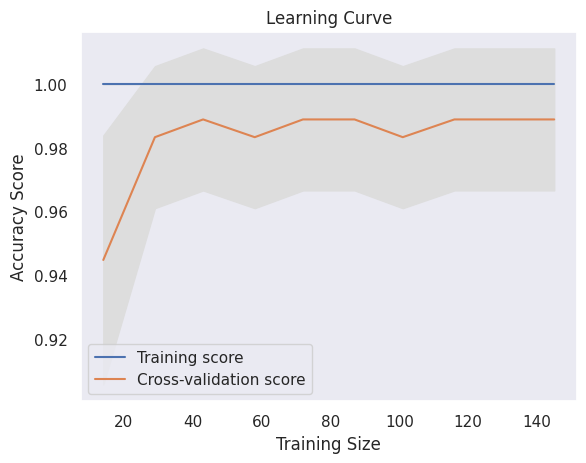

In [ ]:
plot_learning_curve(xgb_best)

### PCA

We now apply XGBoost on our dataset, but first apply scaling and PCA by pipelining.

In [ ]:
xgb_pipe = Pipeline([
    ('scaler', StandardScaler(with_mean=False)),
    ('pca', PCA()),
    ('xgb', XGBClassifier())])

In [ ]:
xgb_pipe_param = {
    'pca__n_components': [10, 11, 12, 13, 14, 15],
    'xgb__n_estimators': randint(2500,5000),  
    'xgb__subsample': [0.5, 0.125, 0.25],
    'xgb__learning_rate': [ 0.05, 0.1, 0.25],
    'xgb__min_child_weight': [0.005, 0.01, 0.025],
    'xgb__max_depth' : [None, 1000, 1250, 2500],
    'xgb__colsample_bytree': [0.75, 0.8, 0.875, 0.95],
    'xgb__colsample_bylevel': [0.1, 0.185, 0.25, 0.35, 0.5],
    'xgb__colsample_bynode': [0.25, 0.375, 0.5, 0.625, 0.75]
    }

-0.1506611069740494
{'pca__n_components': 13, 'xgb__colsample_bylevel': 0.1, 'xgb__colsample_bynode': 0.625, 'xgb__colsample_bytree': 0.75, 'xgb__learning_rate': 0.1, 'xgb__max_depth': 1250, 'xgb__min_child_weight': 0.01, 'xgb__n_estimators': 3644, 'xgb__subsample': 0.5}
Accuracy score: 0.9565217391304348
Log loss: 0.1739957431345491
Roc-auc score: 0.992063492063492
Average f1-score: 0.9551656920077973
              precision    recall  f1-score   support

           0       0.90      1.00      0.95        18
           1       1.00      0.93      0.96        28

    accuracy                           0.96        46
   macro avg       0.95      0.96      0.96        46
weighted avg       0.96      0.96      0.96        46



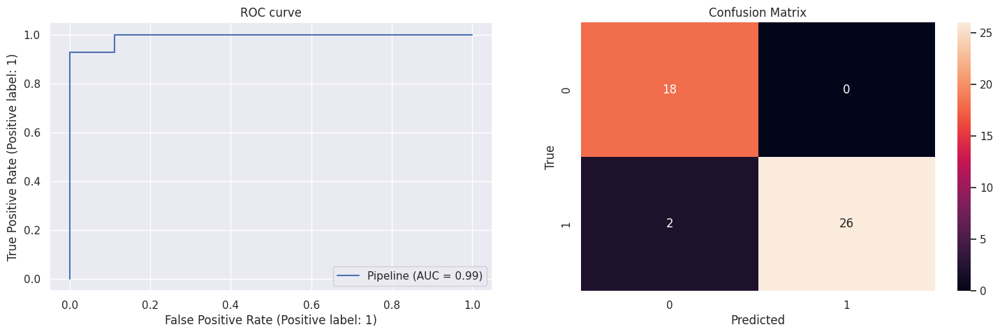

In [ ]:
xgb_pipe_best = cross_val(xgb_pipe, xgb_pipe_param, X_train, y_train, random=True)
pipe_xgb_eval = evaluation(xgb_pipe_best, X_train, y_train, X_test, y_test)

In [ ]:
xgb_pipe_avg = average_performance(xgb_pipe_best, X, y, 10)

Maximum and minimum accuracy: 0.9782608695652174   0.9130434782608695
Average Accuracy score: 0.9456521739130433
Average Log loss: 0.13788672579745526
Average Roc-auc score: 0.9916034411922879
Average f1-score: 0.9443782608506618


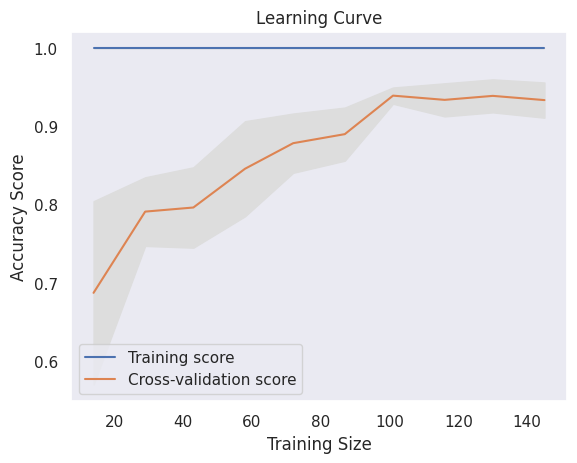

In [ ]:
plot_learning_curve(xgb_pipe_best)

### Important genes

Now, we try building a classifier on the most important genes, instead of the principal components.

Score: -0.06315041328452534
Parameters: {'objective': 'binary:logistic', 'use_label_encoder': None, 'base_score': None, 'booster': None, 'callbacks': None, 'colsample_bylevel': 0.185, 'colsample_bynode': 0.25, 'colsample_bytree': 0.25, 'early_stopping_rounds': None, 'enable_categorical': False, 'eval_metric': None, 'feature_types': None, 'gamma': None, 'gpu_id': None, 'grow_policy': None, 'importance_type': None, 'interaction_constraints': None, 'learning_rate': 0.1, 'max_bin': None, 'max_cat_threshold': None, 'max_cat_to_onehot': None, 'max_delta_step': None, 'max_depth': 5000, 'max_leaves': None, 'min_child_weight': 0.1, 'missing': nan, 'monotone_constraints': None, 'n_estimators': 500, 'n_jobs': None, 'num_parallel_tree': None, 'predictor': None, 'random_state': None, 'reg_alpha': None, 'reg_lambda': None, 'sampling_method': None, 'scale_pos_weight': None, 'subsample': 0.5, 'tree_method': None, 'validate_parameters': None, 'verbosity': None}
Genes selected: ['PGK1', 'BNIP3L', 'BNIP3

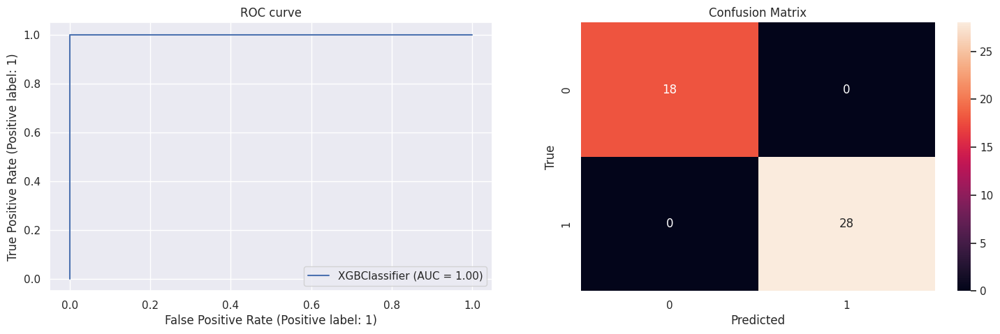

In [ ]:
xgb_genes_best, xgb_genes = cross_val_genes(xgb, xgb_param, X_train, y_train, random=True)
xgb_genes_eval = evaluation_genes(xgb_genes_best,xgb_genes, X_train, y_train, X_test, y_test)

In [ ]:
xgb_genes_avg = average_performance(xgb_genes_best, X, y, 10)

Maximum and minimum accuracy: 1.0   0.9565217391304348
Average Accuracy score: 0.9782608695652174
Average Log loss: 0.08310781486550725
Average Roc-auc score: 0.9948237595737595
Average f1-score: 0.97799155298513


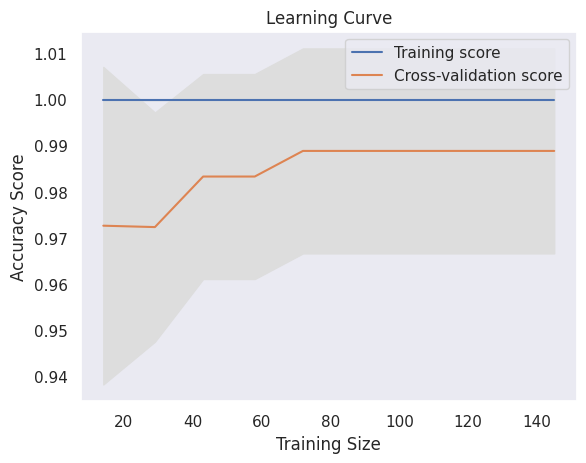

In [ ]:
plot_learning_curve(xgb_genes_best)

## Comparison of all the models

In this sections, we compare briefly the performances of all models.

In [ ]:
final_scores = {
    'RF' : rf_avg,
    'RF + PCA' : rf_pipe_avg,
    'RF + genes' : rf_genes_avg,
    'LR' : lr_avg,
    'LR + PCA' : lr_pipe_avg,
    'LR + genes' : lr_genes_avg,
    'KNN' : knn_avg,
    'KNN + PCA' : knn_pipe_avg,
    'KNN + genes' : knn_genes_avg,
    'SVM' : svm_avg,
    'SVM + PCA' : svm_pipe_avg,
    'SVM + genes' : svm_genes_avg,
    'XGB' : xgb_avg,
    'XGB + PCA' : xgb_pipe_avg,
    'XGB + genes' : xgb_genes_avg
}

df_comparison_final = pd.DataFrame(final_scores, index=['Min accuracy', 'Max accuracy', 'Avg Accuracy','Avg Log loss','Avg Roc-auc score','Avg f1-score'])
df_comparison_final

,RF,RF + PCA,RF + genes,LR,LR + PCA,LR + genes,KNN,KNN + PCA,KNN + genes,SVM,SVM + PCA,SVM + genes,XGB,XGB + PCA,XGB + genes
Min accuracy,0.956522,0.847826,0.978261,0.956522,0.891304,0.934783,0.891304,0.891304,0.847826,0.934783,0.934783,0.913043,0.956522,0.913043,0.956522
Max accuracy,1.000000,0.934783,1.000000,1.000000,0.978261,1.000000,0.978261,0.978261,1.000000,1.000000,1.000000,1.000000,1.000000,0.978261,1.000000
Avg Accuracy,0.982609,0.895652,0.993478,0.984783,0.956522,0.960870,0.941304,0.926087,0.926087,0.973913,0.976087,0.980435,0.982609,0.945652,0.978261
Avg Log loss,0.184503,0.299430,0.174601,0.058074,0.145356,0.158578,0.295352,0.169397,0.441267,0.074834,0.094847,0.065997,0.070869,0.137887,0.083108
Avg Roc-auc score,0.997128,0.977569,0.999431,0.997722,0.988025,0.988029,0.990361,0.986831,0.979521,0.997673,0.994838,0.998975,0.997902,0.991603,0.994824
Avg f1-score,0.982382,0.893928,0.993254,0.984083,0.956022,0.959781,0.940600,0.925455,0.925211,0.973137,0.975530,0.979478,0.981556,0.944378,0.977992


## Ensemble

We replicated a soft-vote ensemble amongst those models that performed the best out of the ones we tested.

In [ ]:
rf_genes_best.fit(X_train[rf_genes],y_train)
rf_genes_prob = rf_genes_best.predict_proba(X_test[rf_genes])
lr_best.fit(X_train,y_train)
lr_prob = lr_best.predict_proba(X_test)
svm_genes_best.fit(X_train[rf_genes],y_train)
svm_genes_prob = svm_genes_best.predict_proba(X_test[rf_genes])
y_prob = (rf_genes_prob+lr_prob+svm_genes_prob)/3
y_pred = [(0 if y_prob[i][0] > 0.5 else 1) for i in range(len(X_test))]

In [ ]:
(y_pred == y_test).sum()/len(y_test)

1.0

Now we fit the ensemble on the full training set and predict the final test set

In [ ]:
x_final_test = df_hcc_smart_test.T

In [ ]:
rf_genes_best.fit(X[rf_genes],y)
rf_genes_prob_final = rf_genes_best.predict_proba(x_final_test[rf_genes])
lr_best.fit(X,y)
lr_prob_final = lr_best.predict_proba(x_final_test)
svm_genes_best.fit(X[rf_genes],y)
svm_genes_prob_final = svm_genes_best.predict_proba(x_final_test[rf_genes])
y_prob_final = (rf_genes_prob_final+lr_prob_final+svm_genes_prob_final)/3
y_pred_final_hcc_smart = [(0 if y_prob_final[i][0] > 0.5 else 1) for i in range(len(x_final_test))]
y_pred_final_hcc_smart

[0,
 0,
 1,
 1,
 1,
 1,
 1,
 0,
 0,
 0,
 0,
 0,
 1,
 1,
 1,
 1,
 0,
 0,
 0,
 0,
 0,
 1,
 1,
 1,
 0,
 0,
 0,
 0,
 0,
 1,
 1,
 0,
 0,
 1,
 1,
 1,
 0,
 0,
 0,
 1,
 1,
 0,
 0,
 0,
 0]

Finally, we achieved our list of predictions of the data. Entries '0' represent normoxic cells, whereas '1's represent hypoxic cells.

In [ ]:
np.savetxt('hcc_smart_predictions.txt',y_pred_final_hcc_smart,fmt='%1d')

# Results

We print the crosstabulation of our performance, together with the corresponding accuracy in the predictions.

In [ ]:
import pandas as pd

data = {'0': [26, 00], '1': [0, 19]}

index = ['0', '1']

df = pd.DataFrame(data, index=index)

print(df)

accuracy = (df.iloc[0, 0] + df.iloc[1, 1])/(df.values.sum())
print(f"Accuracy: {accuracy * 100:.2f}%")

    0   1
0  26   0
1   0  19
Accuracy: 100.00%


We gladly achieve a 100% accuracy level.

In [1]:
%%shell
jupyter nbconvert --to html /content/HCC1806_smart_report.ipynb

[NbConvertApp] Converting notebook /content/HCC1806_smart_report.ipynb to html
[NbConvertApp] Writing 14630983 bytes to /content/HCC1806_smart_report.html
